In [16]:
#!/usr/bin/env python3
from __future__ import division

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

import os
import json
import math
import re
import random

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.colors import Normalize
from matplotlib import cm
from matplotlib.patches import Rectangle
from textwrap import wrap

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.neighbors import KernelDensity

from scipy.stats import pearsonr
from Bio.PDB.PDBParser import PDBParser
from Bio.PDB.ResidueDepth import get_surface
from Bio.PDB.ResidueDepth import residue_depth
from Bio.PDB.DSSP import DSSP


import umap
import pymol

#=============================================================================

def clustering(
    df_gene: pd.DataFrame,
    gene: str,
    sample_list: list,
    sample_control: list,
    n_clusters: int,
    clustering_method: str,
    clustering_metric: str,
    output_folder: str = None,
) -> pd.DataFrame:
    """
    Perform hierarchical clustering on screen data, plot a heatmap with dendrograms, and display UMAP, PCA,
    and TSNE visualizations. Save the results if an output folder is provided.

    Parameters:
        df_gene (pd.DataFrame): DataFrame containing gene data with at least columns for expression.
        gene (str): Gene name.
        sample_list (list): List of sample column names to include in the clustering.
        sample_control (list): List of control sample column names.
        n_clusters (int): Number of clusters to generate.
        clustering_method (str): Linkage method (e.g., 'average') for clustering.
        clustering_metric (str): Distance metric (e.g., 'euclidean') for clustering.
        output_folder (str, optional): Directory path to save outputs (table and figures).

    Returns:
        pd.DataFrame: Updated DataFrame with added 'Cluster' and 'Correlation' columns.
        
    Note:
        This function expects that a global dictionary 'corr_dic' exists to provide correlation values
        for each sgID.
    """
    # Create output folder if provided
    if output_folder is not None and not os.path.exists(output_folder):
        os.makedirs(output_folder)
        
    #df_gene.index = df_gene['Function']+'_'+df_gene['Mutation']
    
    # Subtract control samples from the screen data
    df_x = df_gene.loc[:, sample_list]
    if sample_control!='':
        df_x = df_x.subtract(df_x[sample_control], axis=0)

    # Perform hierarchical clustering
    cluster_model = AgglomerativeClustering(
        n_clusters=n_clusters, linkage=clustering_method, affinity=clustering_metric
    )
    cluster_model.fit(df_x)
    df_gene["Cluster"] = cluster_model.labels_

    # Set up the heatmap figure
    plt.figure(figsize=(8, 6), dpi=300)
    plt.rcParams["font.size"] = 28
    plt.rcParams["font.family"] = "Helvetica"

    # Generate colors for clusters
    cluster_labels = cluster_model.labels_
    color_options = [ "blue", "red","green", "orange", "purple",
                     "yellow", "cyan", "pink", "teal", "brown"]
    top_colors = color_options[: len(set(cluster_labels))]
    top_colors_dict = dict(zip(set(cluster_labels), top_colors))
    top_colors_list = [top_colors_dict[label] for label in cluster_labels]

    # Create the clustermap
    g = sns.clustermap(
        df_x.T,
        metric=clustering_metric,
        method=clustering_method,
        cmap="coolwarm",
        dendrogram_ratio=(0.1, 0.1),
        vmin=-1,
        vmax=1,
        row_cluster=False,
        col_cluster=True,
        cbar_pos=(0.02, 0.35, 0.03, 0.2),
        figsize=(20, 10),
        xticklabels=False,
        col_colors=top_colors_list,
    )

    cbar = g.ax_cbar
    cbar.set_title("LFC", pad=10)
    
    # Annotate mutation categories based on sgID naming
    mutation_categories = []
    for idx in g.dendrogram_col.reordered_ind:
        sgid = str(df_x.index[idx])
        if "nonsense" in sgid or "splice" in sgid:
            mutation_categories.append("Nonsense &Splicing")
        else:
            mutation_categories.append("Missense")
    
    bottom_colors_dict = {"Nonsense &Splicing": "purple", "Missense": "grey"}
    bottom_colors_list = [bottom_colors_dict[cat] for cat in mutation_categories]
    
    title_font = {"size": 40, "weight": "bold"}
    g.ax_heatmap.set_title(gene, fontdict=title_font, pad=100)
    
    # Add a bottom annotation bar for mutation categories
    ax = g.ax_heatmap
    for idx, color in enumerate(bottom_colors_list):
        ax.add_patch(
            Rectangle(
                (idx, len(sample_list)+0.2),  # x, y
                1,
                0.2,
                facecolor=color,
                transform=ax.transData,
                clip_on=False,
            )
        )
    
    # Create legends for clusters and mutation categories
    for label, color in top_colors_dict.items():
        g.ax_col_dendrogram.bar(0, 0, color=color, label=f"Cluster {label+1}", linewidth=0)
    for label, color in bottom_colors_dict.items():
        ax.bar(0, 0, color=color, label="\n".join(wrap(label, width=9)), linewidth=0)
    
    g.ax_col_dendrogram.legend(
        loc="center", title="Clusters", bbox_to_anchor=(-0.1, 0), fontsize=25
    )
    ax.legend(
        loc="center", title="Muation Category", bbox_to_anchor=(-0.12, 0.02), fontsize=25
    )
    
    # Add correlation annotation bars using the global 'corr_dic'
    norm = Normalize(vmin=-1, vmax=1)
    cmap_obj = cm.get_cmap("bwr")
    
    df_lof = df_gene[(df_gene['Function']=='nonsense')|(df_gene['Function'].str.contains('splice')==True)]
    df_lof_data = df_lof.loc[:,sample_list]
    df_lof_data.reset_index(drop=True, inplace=True)
    df_gene_data = df_gene.loc[:,sample_list]
    
    corr_vals = []
    
    if df_lof.shape[0] > 0:
        for ix1 in g.dendrogram_col.reordered_ind:
            #print(df_gene_data.iloc[ix1,:])
            ls1 = list(df_gene_data.iloc[ix1,:])
            corr_ls = []
            for ix2 in df_lof_data.index:
                ls2 = list(df_lof_data.iloc[ix2,:])
                #print(ls1,ls2)
                r = pearsonr(ls1,ls2)[0]
                corr_ls.append(r)
            corr_vals.append(np.mean(corr_ls))
                
    else:
        corr_vals = [0] * df_gene.shape[0]
            
    for i, cval in enumerate(corr_vals):
        rect_color = cmap_obj(norm(cval))
        ax.add_patch(
            Rectangle(
                (i, len(sample_list)+0.7),  # x, y
                1,
                0.5,
                facecolor=rect_color,
                transform=ax.transData,
                clip_on=False,
            )
        )
        anno = "NA" if cval == 0 else ""
        ax.text(
            i + 0.5,
            len(sample_list)+0.95,
            anno,
            ha="center",
            va="center",
            color="black",
            fontsize=20,
            fontweight="bold",
            transform=ax.transData,
        )
    
    sm = cm.ScalarMappable(norm=norm, cmap=cmap_obj)
    sm.set_array([])
    cbar_ax = g.fig.add_axes([-0.02, -0.12, 0.1, 0.05])
    cbar2 = plt.colorbar(sm, cax=cbar_ax, orientation="horizontal")
    cbar2.set_label("Correlation", fontsize=25)
    cbar2.ax.tick_params(labelsize=26)
    
    df_gene["Correlation"] = corr_vals
    
    if output_folder is not None:
        clustermap_path = os.path.join(os.getcwd(),output_folder, f"{gene}_ClusterMap.png")
        g.fig.savefig(clustermap_path, dpi=300, facecolor="white", bbox_inches="tight")
        print(f"Clustermap figure saved to: {clustermap_path}")
    
    plt.show()
    
    # Dimensionality reduction
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(df_x)
    
    # UMAP
    reducer = umap.UMAP(random_state=47, n_neighbors=6, min_dist=0.3, metric="euclidean")
    embedding = reducer.fit_transform(scaled_data)
    
    # PCA
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(scaled_data)
    
    # TSNE (highlighting potential outliers with 'nonsense' or 'splice' in index)
    lof_idx = [
        ix 
        for ix in range(df_x.shape[0])
        if "splice" in str(df_x.index[ix]) or "nonsense" in str(df_x.index[ix])
    ]
    tsne = TSNE(n_components=2, random_state=47, perplexity=5)
    tsne_result = tsne.fit_transform(scaled_data)
    
    # Plot UMAP, PCA, and TSNE results
    plt.figure(figsize=(12, 4), dpi=300)
    #sns.set_style("ticks")
    plt.rcParams["font.size"] = 16
    plt.rcParams["font.family"] = "Helvetica"
    
    plt.subplot(1, 3, 1)
    plt.scatter(embedding[:, 0], embedding[:, 1], c=top_colors_list, s=80)
    
    plt.scatter(
        embedding[lof_idx, 0],
        embedding[lof_idx, 1],
        c="purple",
        s=85,
        label="Nonsense&Splicing",
    )
    plt.xlabel("UMAP Dimension 1")
    plt.ylabel("UMAP Dimension 2")
    
    plt.subplot(1, 3, 2)
    plt.scatter(pca_result[:, 0], pca_result[:, 1], c=top_colors_list, s=80)
    plt.scatter(
        pca_result[lof_idx, 0],
        pca_result[lof_idx, 1],
        c="purple",
        s=85,
        label="Nonsense&Splicing",
    )
    plt.xlabel("PCA Dimension 1")
    plt.ylabel("PCA Dimension 2")
    
    plt.subplot(1, 3, 3)
    plt.scatter(tsne_result[:, 0], tsne_result[:, 1], c=top_colors_list, s=80)
    plt.scatter(
        tsne_result[lof_idx, 0],
        tsne_result[lof_idx, 1],
        c="purple",
        s=85,
        label="Nonsense&Splicing",
    )
    plt.xlabel("TSNE Dimension 1")
    plt.ylabel("TSNE Dimension 2")
    
    plt.tight_layout()
    
    if output_folder is not None:
        dr_path = os.path.join(os.getcwd(),output_folder, f"{gene}_DimReduction.png")
        plt.savefig(dr_path, dpi=300, facecolor="white", bbox_inches="tight")
        print(f"Dimensionality reduction plot saved to: {dr_path}")
    
    plt.show()
    
    return df_gene

In [237]:
import pandas as pd

df = pd.read_excel('GPR68_DMS_screen_cell.xlsx')

In [238]:
df['AAChange'] = [s[3:-1] for s in df['hgvs']]
df['AA'] = [int(re.search(r'\d+', s).group()) for s in df['AAChange']]
df.index = list(df['AA'])

In [239]:
df1 = df[(df['hgvs'].str.contains('del')==True)]
df2 = df[df['is.wt']==True]
df3 = df[(df['hgvs'].str.contains('del')==False)&(df['hgvs'].str.contains('ins')==False)&(df['is.wt']==False)]

In [240]:
df_neg = df[df['is.wt']==True]
df_mis = df[(df['hgvs'].str.contains('del')==False)&(df['hgvs'].str.contains('ins')==False)]
df_del = df[(df['hgvs'].str.contains('del')==True)]

In [244]:
import numpy as np

ls1 = []; ls2 = []; ls3 = []; ls4 = []; aa_ls = []

for aa in sorted(set(df_mis['AA'])):
    df_aa = df_mis[df_mis['AA']==aa]
    #print(df_aa.mean())
    #df_m = pd.concat([df_m,df_aa.mean()],axis=1)
    
    ph55_score = df_aa['score_ph55'].mean()
    ph55_zscore = (ph55_score - df_neg['score_ph55'].mean())/df_neg['score_ph55'].std() * np.sqrt(df_aa.shape[0])
    surface_score = df_aa['score_surface'].mean()
    surface_zscore = (surface_score - df_neg['score_surface'].mean())/df_neg['score_surface'].std() * np.sqrt(df_aa.shape[0])
    print(aa,ph55_score,ph55_zscore,surface_score,surface_zscore)
    ls1.append(ph55_score)
    ls2.append(surface_score)
    ls3.append(ph55_zscore)
    ls4.append(surface_zscore)
    aa_ls.append(aa)  

2 0.3084143367 1.6095771212458814 0.20401245195 0.6531462437461685
3 -0.13590641280000001 -1.6012305925580912 -0.7241092745 -5.5439383473165424
4 0.21915087710526324 0.9401075894834853 0.25248839084210534 0.952087256237177
5 0.04887781969999999 -0.2659190191778192 -0.8253021160499999 -6.2196046755836
6 0.10876053563157893 0.16258935656593845 -0.058025444578947344 -1.0687216320263786
7 0.49680528334999996 2.970951996030234 0.1498698872 0.2916354158333217
8 -0.04931937388888888 -0.9508233774586234 -0.7559609878421052 -5.610852089269183
9 0.014597645749999994 -0.5136388186088875 -0.26207500939999995 -2.458927682017302
10 0.02286737829999999 -0.4538790142501767 -0.44790586959999984 -3.699723503804788
11 0.13364641763157895 0.3378694285262849 0.156505749 0.32743690695231115
12 0.41714121770000007 2.3952732846717284 0.5986366501499999 3.2880587430792416
13 -1.0579183675499997 -8.263991897003493 -1.4096450921 -10.121272689138358
14 0.4279344757999999 2.47326891373824 0.6122464251 3.3789314424

189 -0.40741780655 -3.5632611266242646 -1.2430389496499998 -9.008840635530014
190 -0.6528479436999999 -5.336819931717131 -1.3011981107499995 -9.397170345750796
191 0.039609978842105265 -0.3244624815066265 -0.33700943457894733 -2.884335824903684
192 -0.09604689455000001 -1.3131926181676778 -0.7083886187 -5.438971260518334
193 -0.9155078473499998 -7.2348866902366495 -1.6937520855000003 -12.018259927812966
194 -0.3984436177368421 -3.4098289527792307 -1.7890542221052634 -12.334172444296396
195 -0.39140427874999995 -3.4475421136290043 -1.4944237446 -10.687341197272902
196 -0.3129041085263157 -2.8073439241242775 -1.3902931480526315 -9.739054833364827
197 -1.2242227773684213 -9.226083748312599 -2.051957897388889 -14.045136733697221
198 0.21384424649999995 0.9261825792376701 0.022866754052631555 -0.5563666694692713
199 -0.31538601920000003 -2.8982091949486164 -0.7912480104 -5.992224831569784
200 -0.7629068607499999 -6.132141825269733 -1.0161710557999997 -7.494039840420702
201 -0.48452629715789

In [245]:
df_m = pd.DataFrame({'AA':aa_ls,'score_ph55':ls1,'score_surface':ls2,
                     'zscore_ph55':ls3,'zscore_surface':ls4})

/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the c

Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/GPR68_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

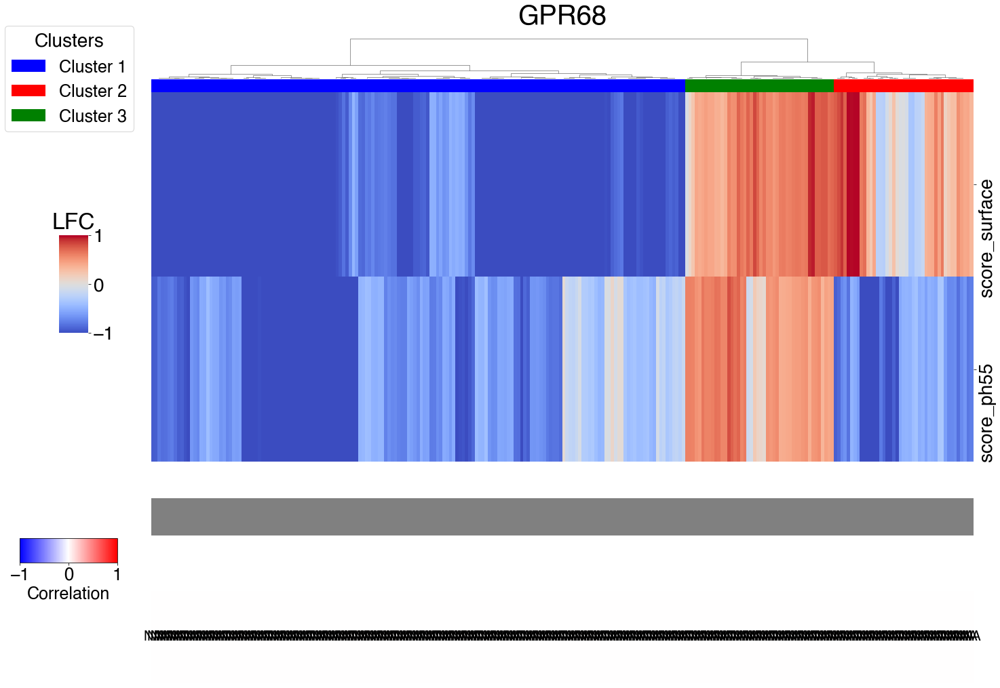

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/GPR68_DimReduction.png


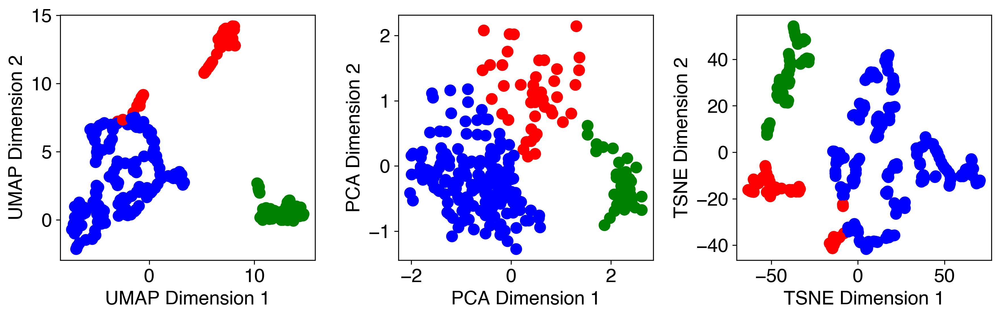

In [248]:
df_gene = df_m[(abs(df_m['zscore_ph55'])>3)|(df_m['zscore_ph55']<-6)| \
               (df_m['zscore_surface']>3)|(df_m['zscore_surface']<-6)]

df_gene['Function'] = ['missense'] * df_gene.shape[0]
df_gene['Mutation'] = [str(aa) for aa in df_gene['AA']]
sample_ls = ['score_surface','score_ph55']
df_clust = clustering(df_gene,'GPR68',sample_ls,'',3,'ward','euclidean','Test')

In [3]:
import pandas as pd
import re

df = pd.read_csv('BE_screen_CellLine.csv')

from collections import Counter

mut_ls = []; aa_ls = []

for s in df['AAChg']:
    #print(s)
    if str(s)!='nan':
        ls = s.split(' ')
        counter = Counter(ls)
        most_common = counter.most_common(1)[0]
        mut = most_common[0]
        #print(ls,most_common_number)
        if 'del' in mut:
            mut = mut[2:mut.index('del')] + '_Delins'
            mut_ls.append(mut)
        else:
            mut_ls.append(mut[2:])
            
        match = re.search(r'\d+', mut)
        if match:
            number = match.group()
            aa_ls.append(int(number))
    else:
        mut_ls.append('NA')
        aa_ls.append('NA')
    
df['Mutation'] = mut_ls
df['AA'] = aa_ls
df['AA_str'] = [str(s) for s in df['AA']]
df['AA_name'] = [s[0] if str(s)!='NA' else '' for s in df['Mutation']]
df.index = df['Function']+'_'+df['AA_name']+df['AA_str']

df['NegativeControl'] = [1 if s=='AAVS1' or s=='NT' else 0 for s in df['Gene']]

df_neg = df[df['NegativeControl']==1]

df['Zscore_MDAMB231'] = abs((df['LFC_MDAMB231'] - df_neg['LFC_MDAMB231'].mean())/df_neg['LFC_MDAMB231'].std())
df['Zscore_MCF7'] = abs((df['LFC_MCF7'] - df_neg['LFC_MCF7'].mean())/df_neg['LFC_MCF7'].std())
df['Zscore_MCF10A'] = abs((df['LFC_MCF10A'] - df_neg['LFC_MCF10A'].mean())/df_neg['LFC_MCF10A'].std())

df['Zscore_max'] = df[['Zscore_MDAMB231', 'Zscore_MCF7', 'Zscore_MCF10A']].max(axis=1)

In [4]:
df = df[(df['Function']=='missense')|(df['Function']=='nonsense')|(df['Function']=='splice-acceptor')|(df['Function']=='splice-donor')]

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/ATM_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

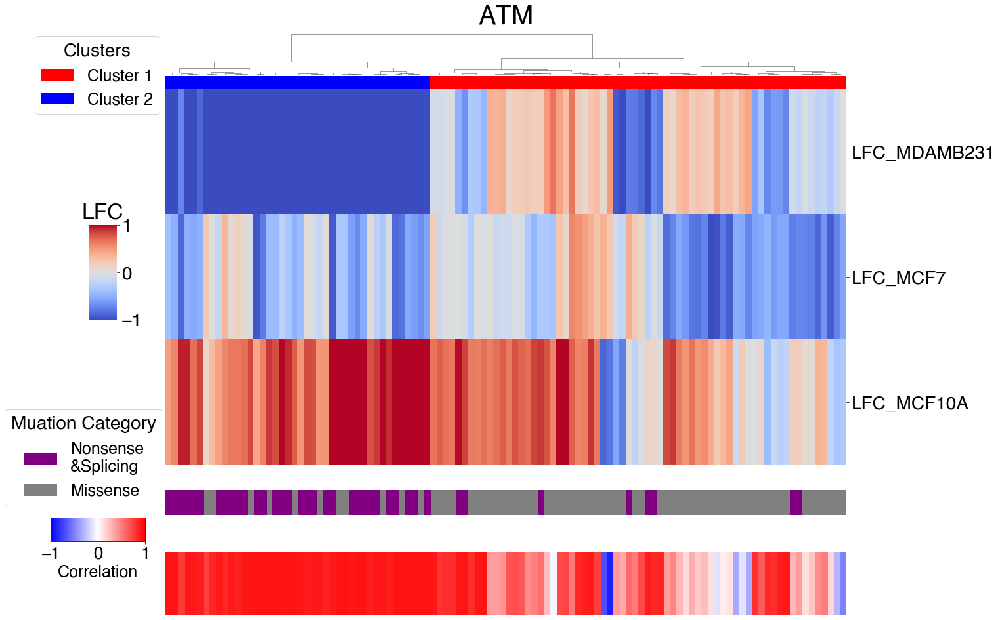

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/ATM_DimReduction.png


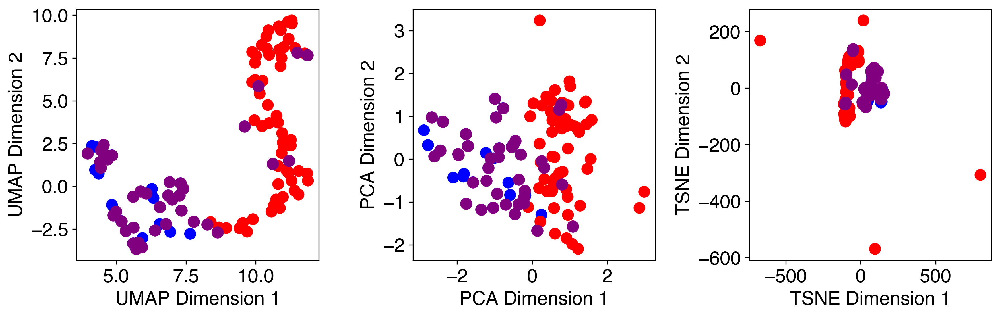

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/ATR_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

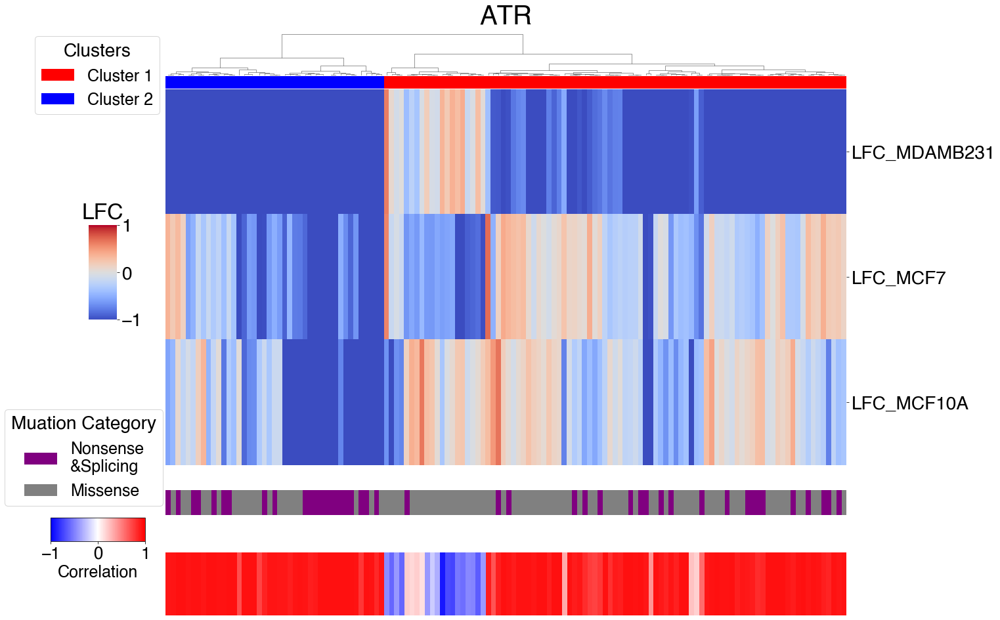

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/ATR_DimReduction.png


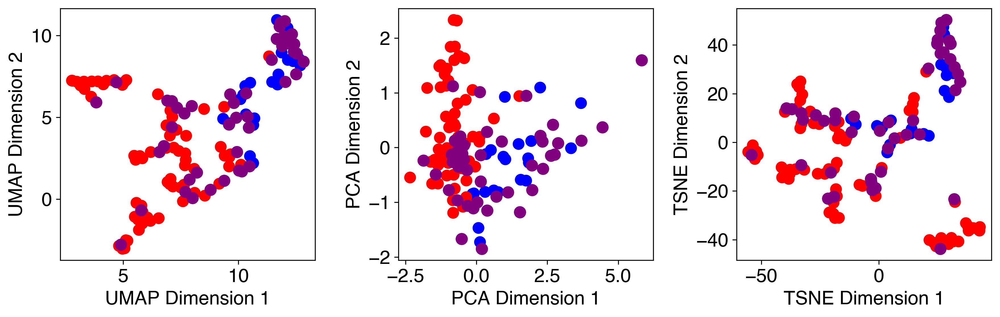

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BARD1_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

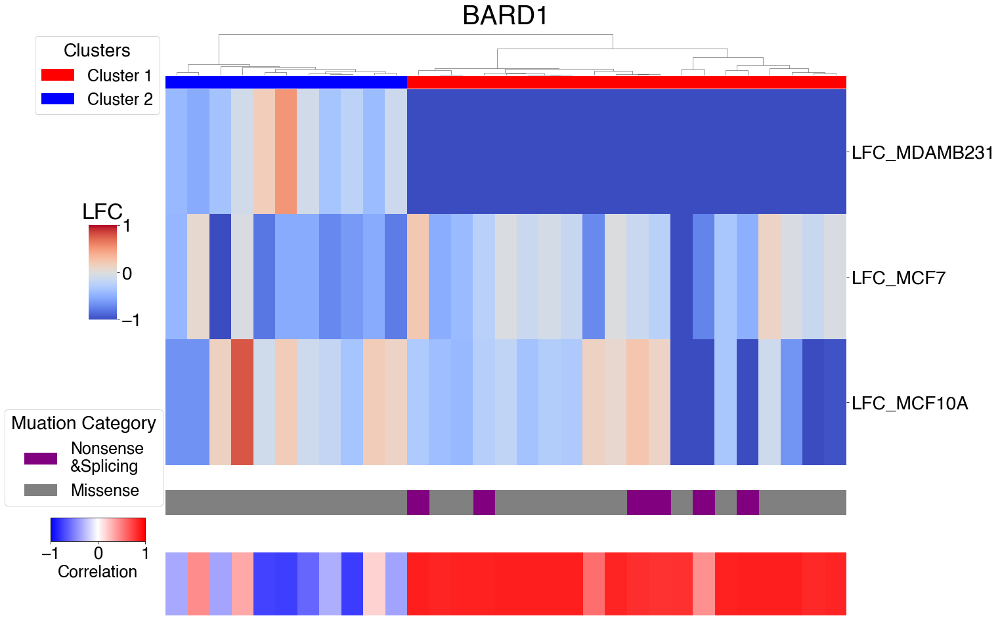

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BARD1_DimReduction.png


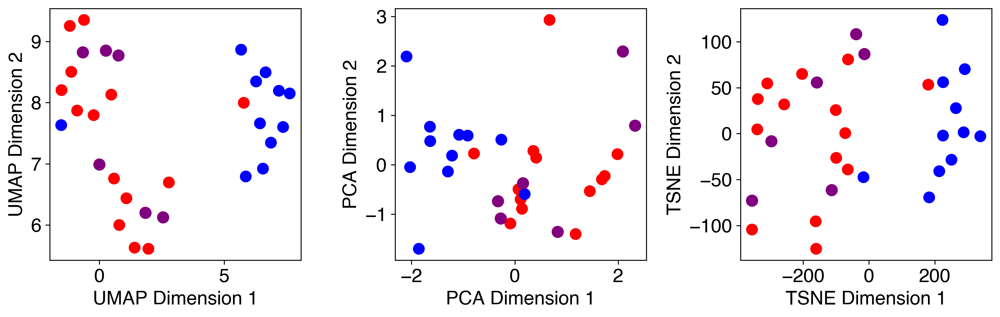

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BLM_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

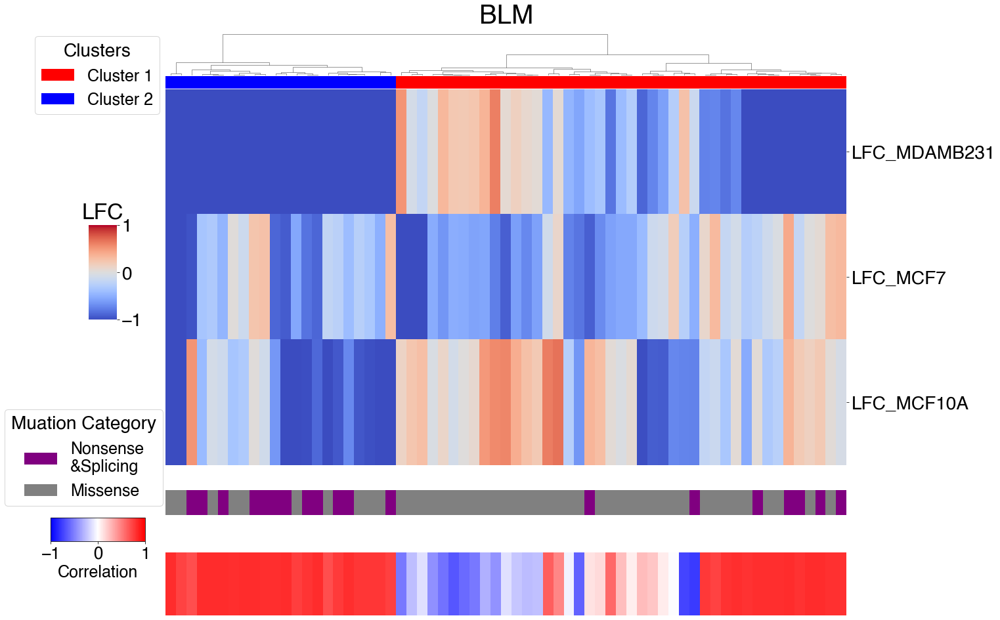

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BLM_DimReduction.png


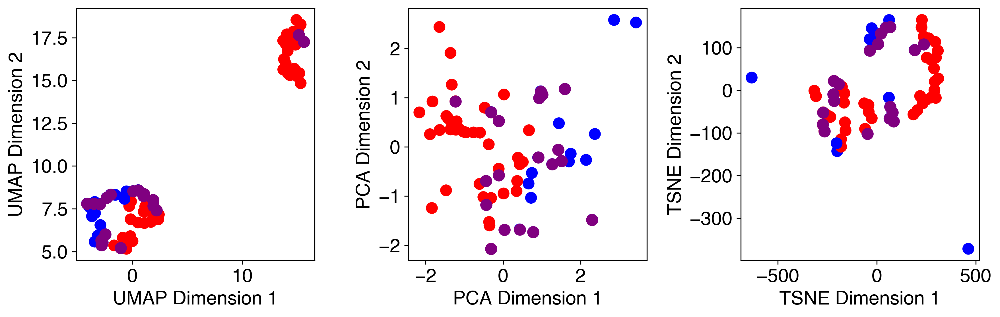

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BRCA1_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

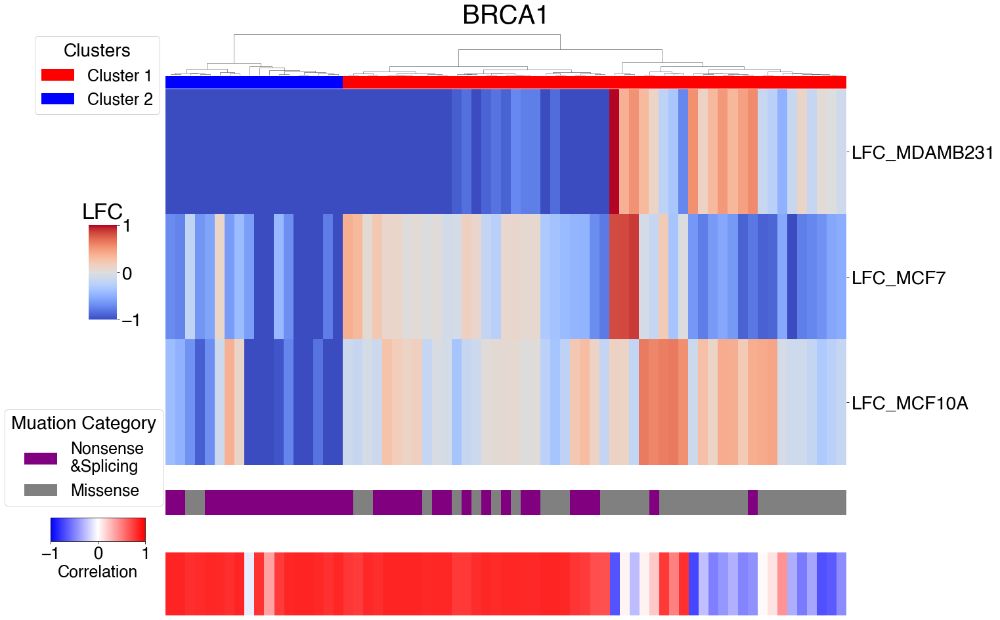

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BRCA1_DimReduction.png


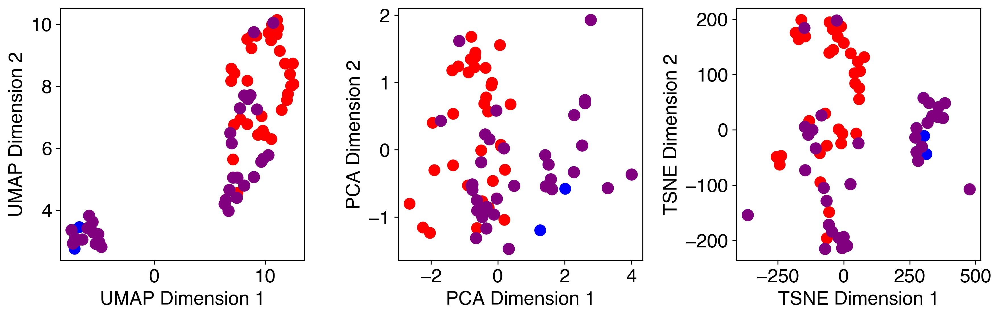

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BRCA2_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

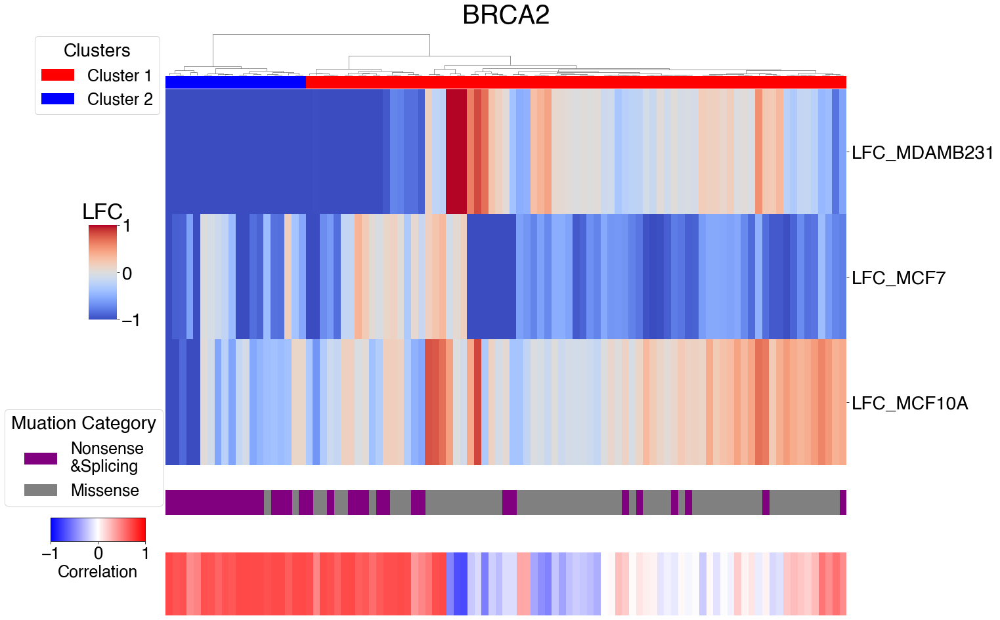

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BRCA2_DimReduction.png


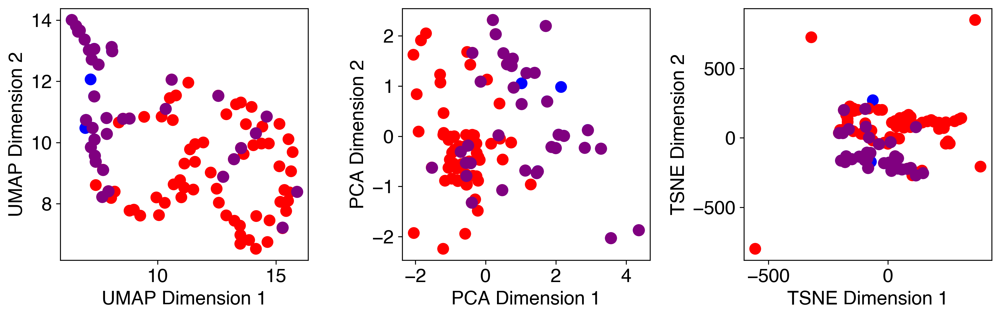

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BRIP1_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

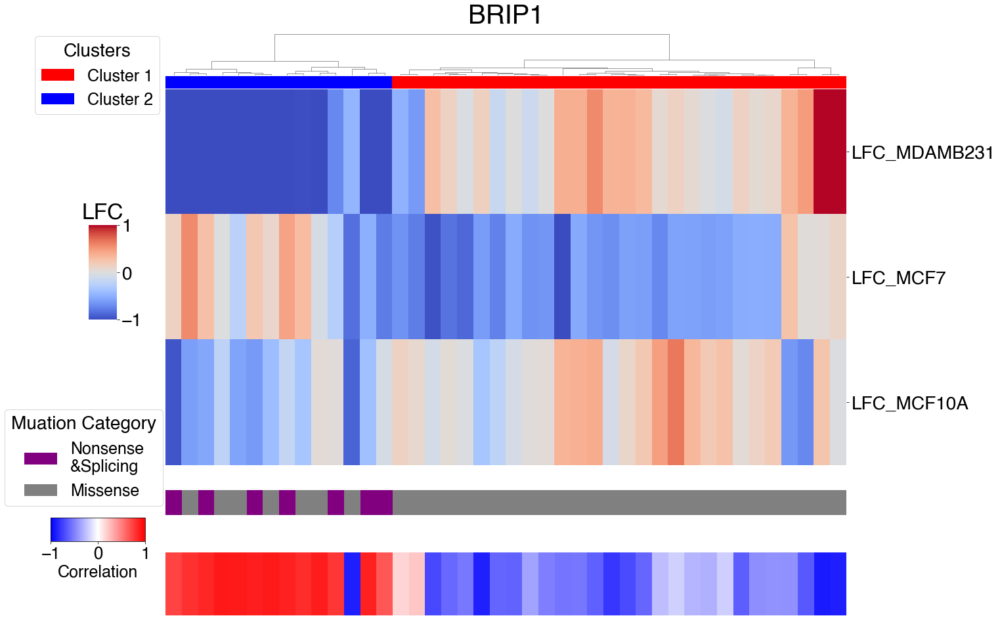

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/BRIP1_DimReduction.png


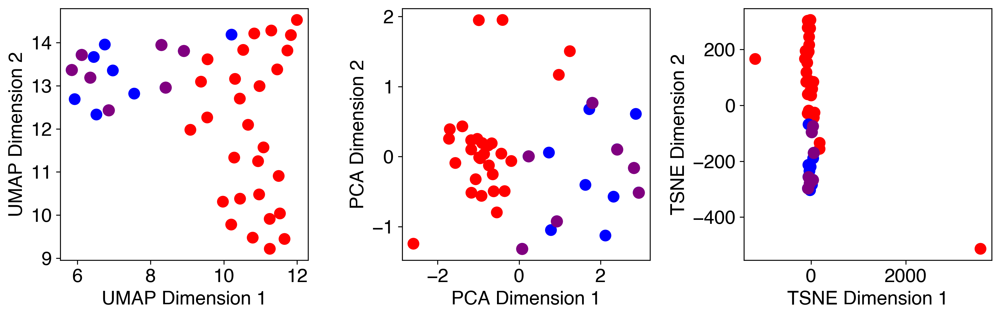

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/CDK12_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

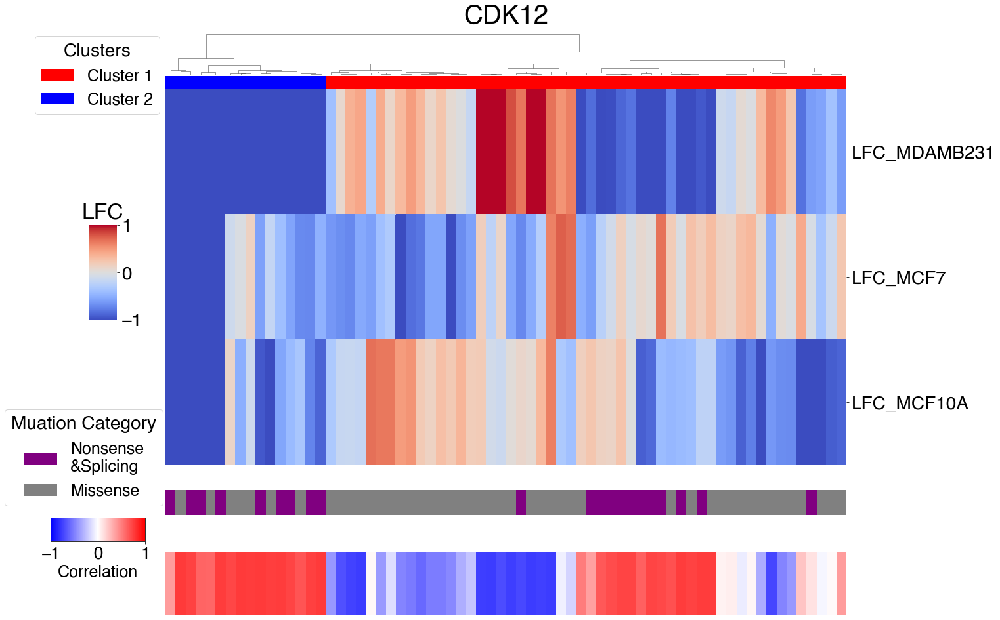

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/CDK12_DimReduction.png


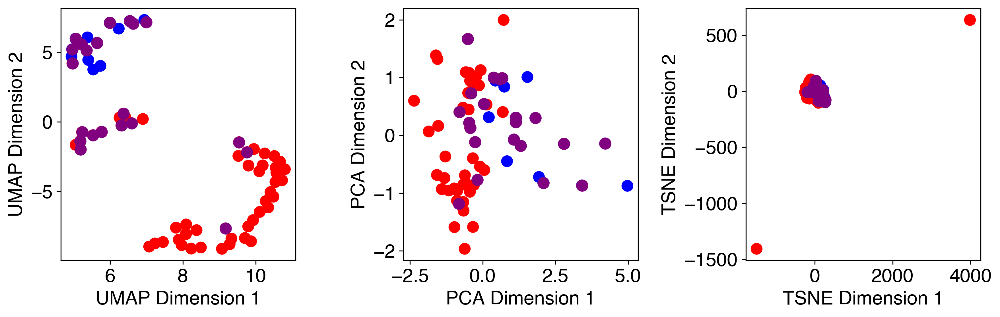

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/CHEK2_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

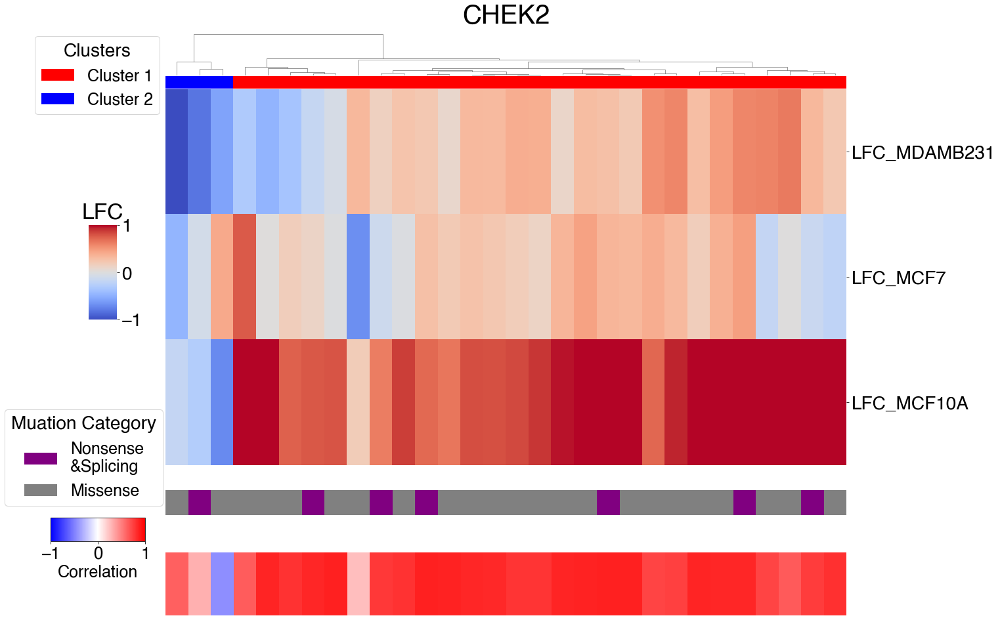

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/CHEK2_DimReduction.png


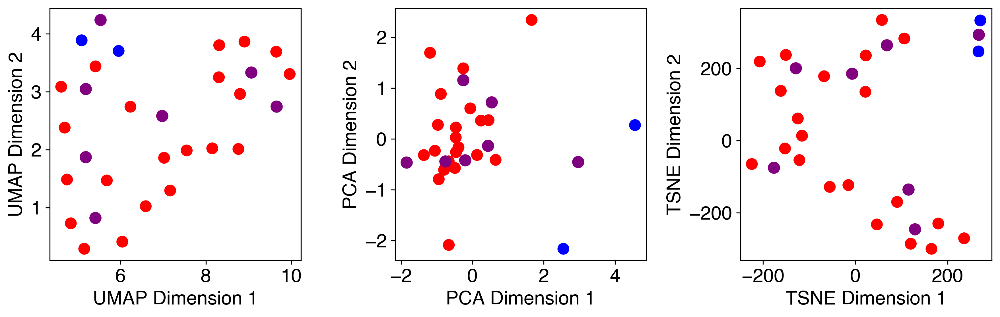

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCA_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

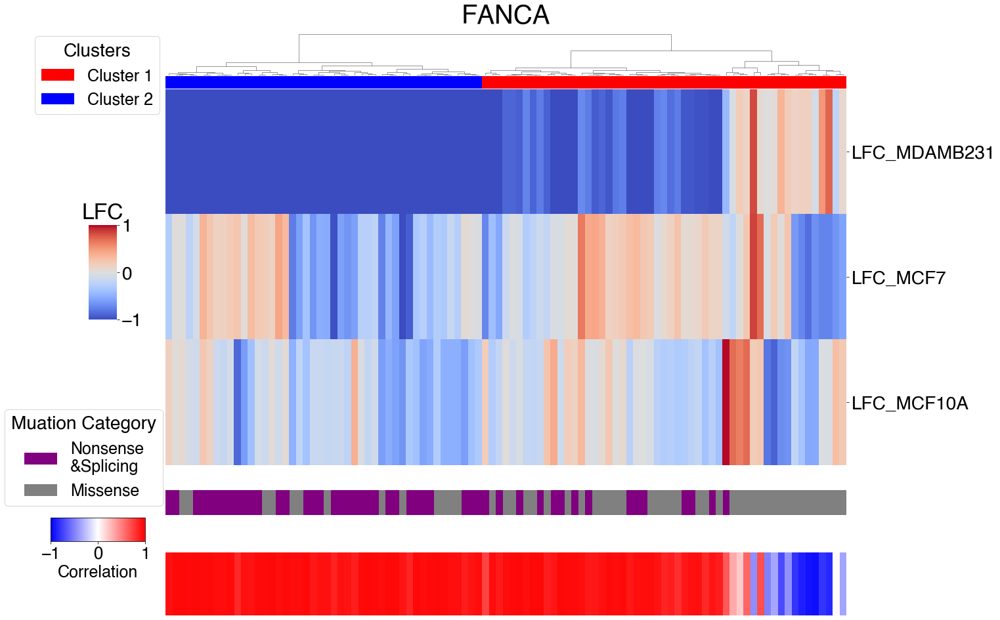

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCA_DimReduction.png


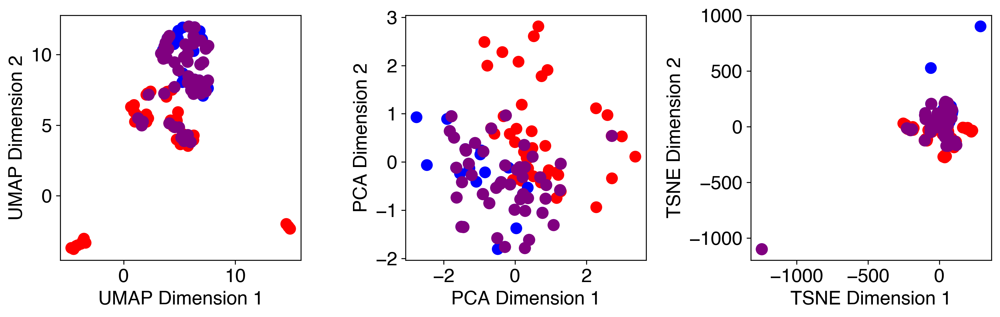

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCC_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

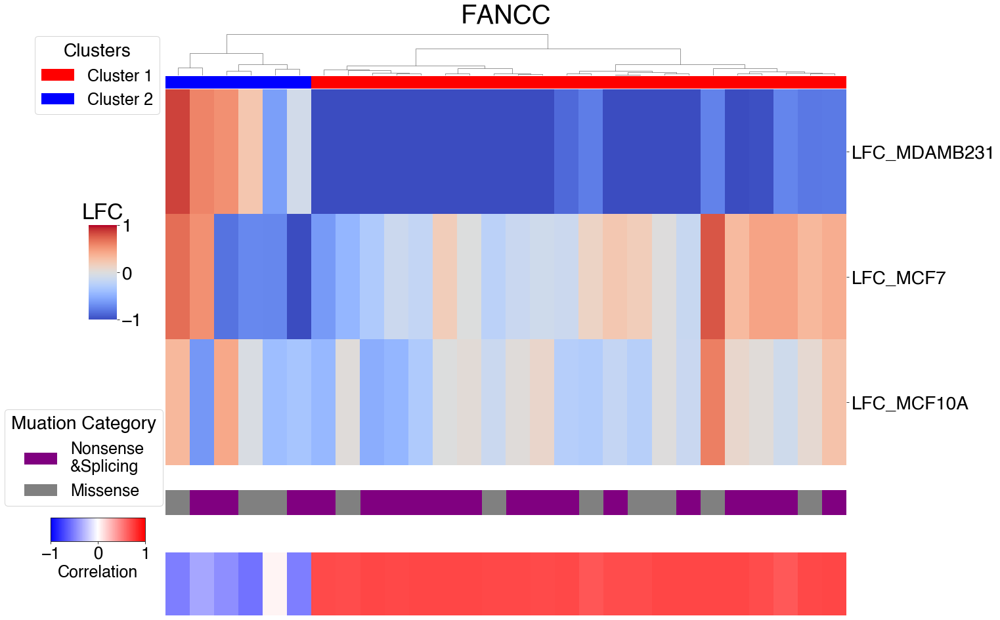

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCC_DimReduction.png


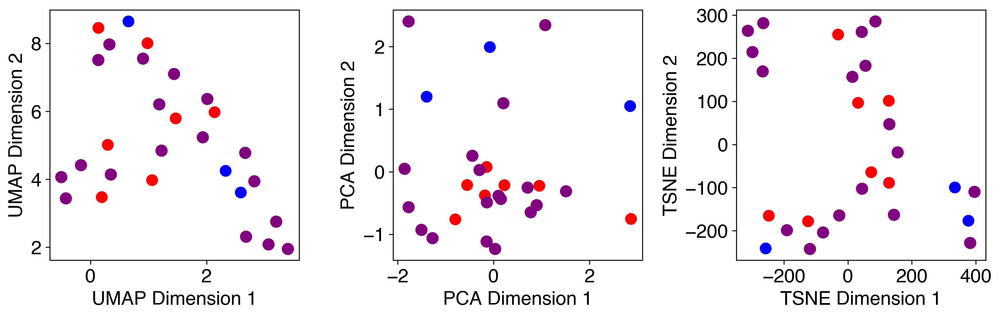

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCD2_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

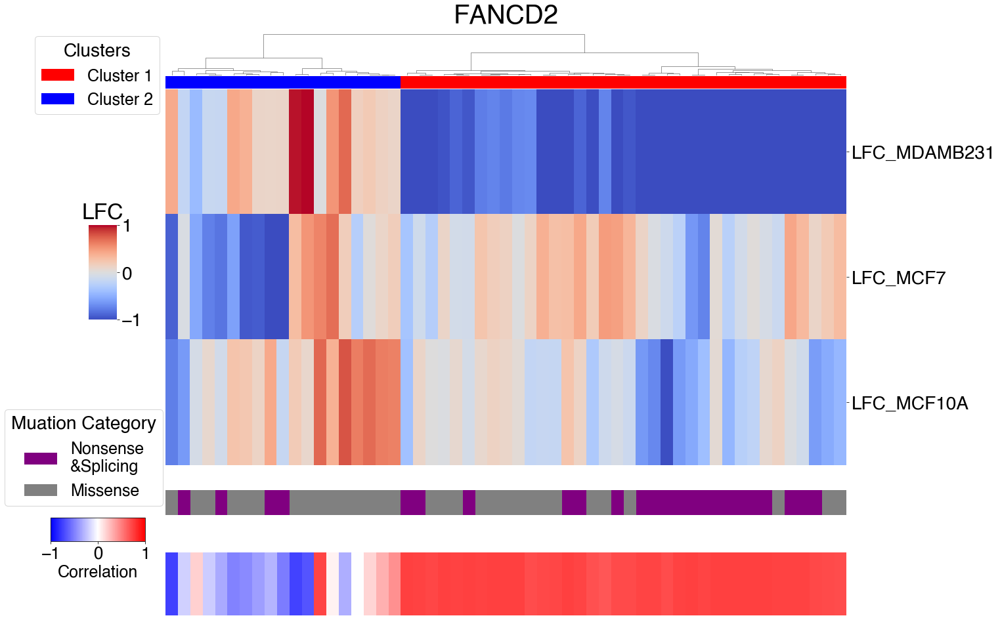

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCD2_DimReduction.png


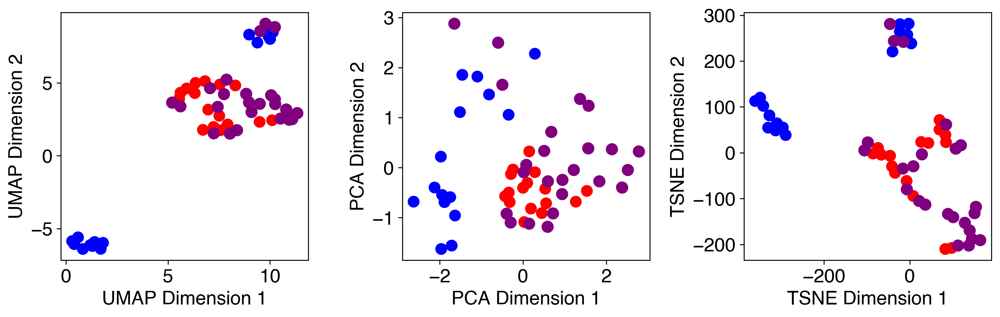

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCE_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

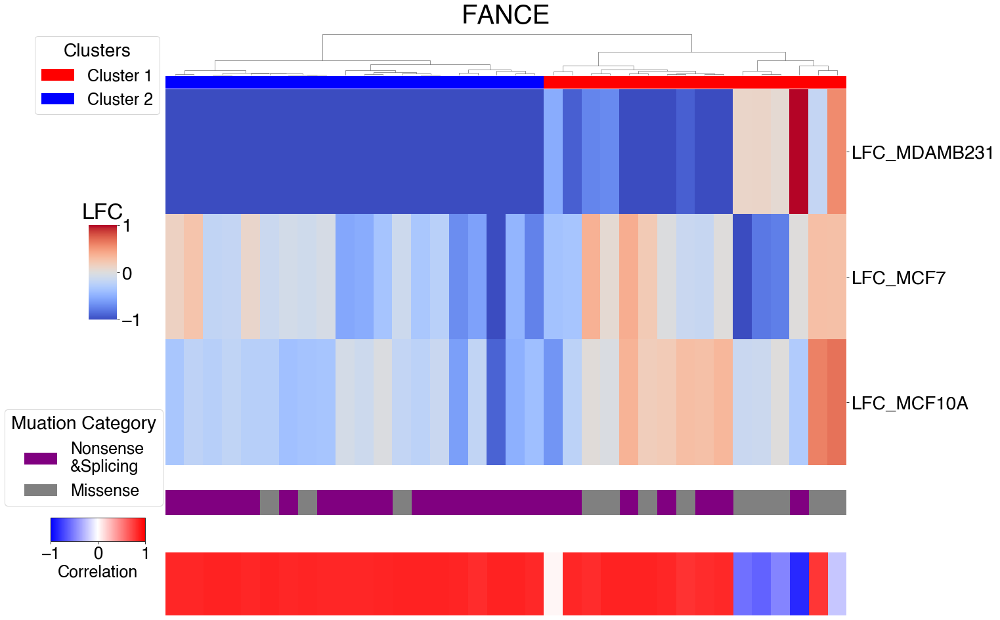

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCE_DimReduction.png


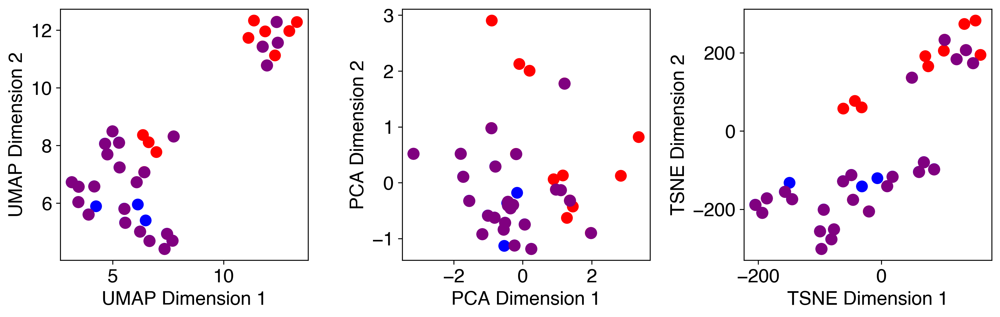

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCF_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

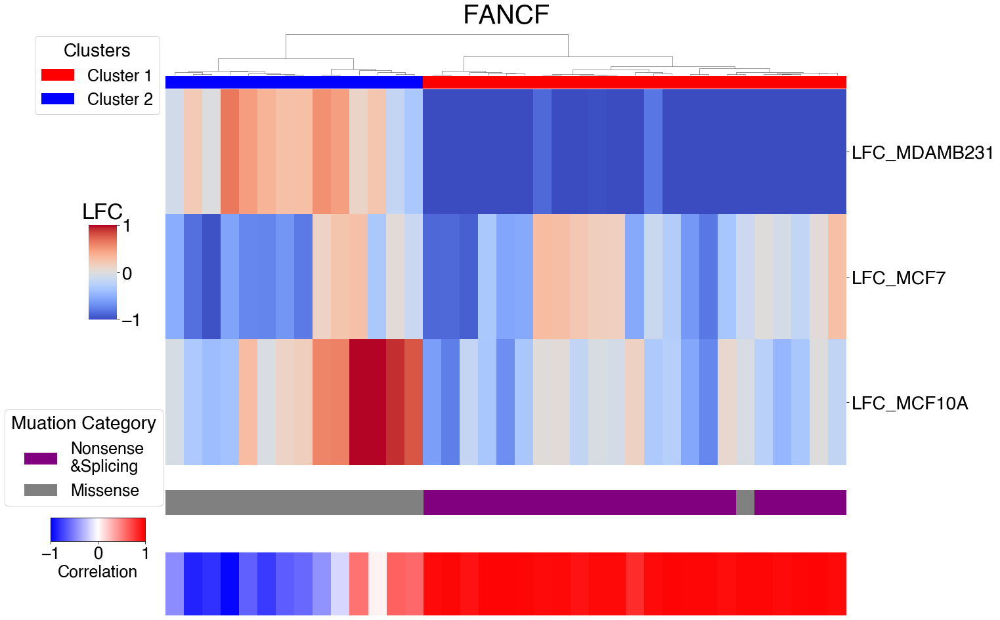

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCF_DimReduction.png


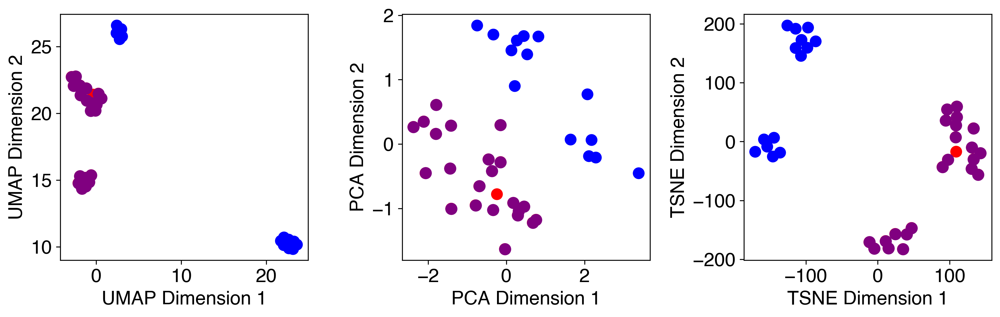

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCG_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

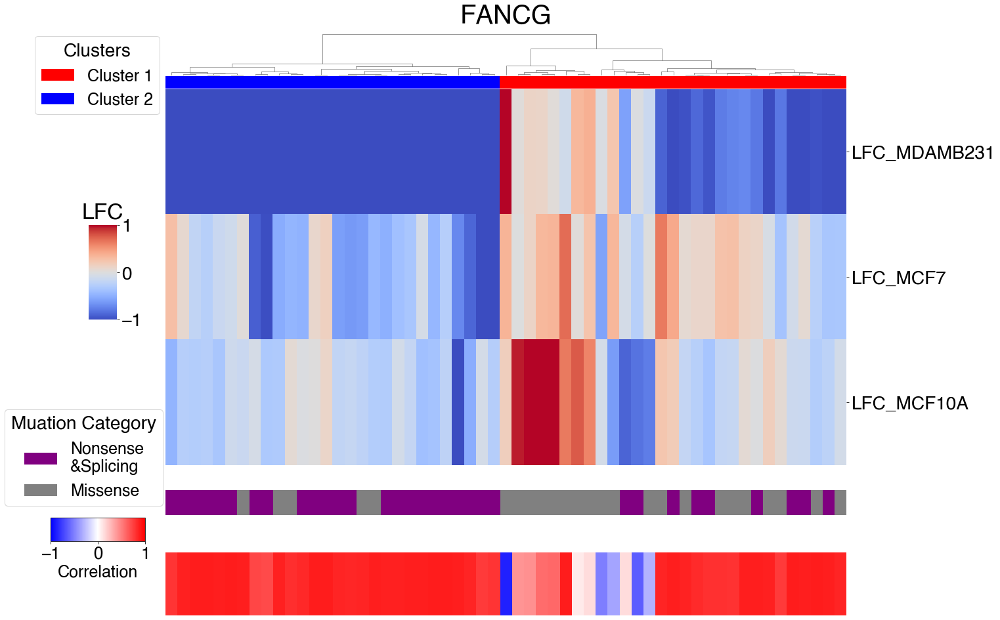

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCG_DimReduction.png


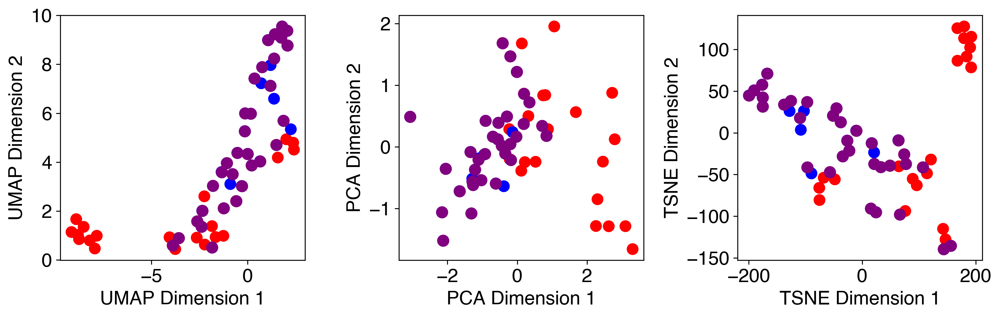

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCI_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

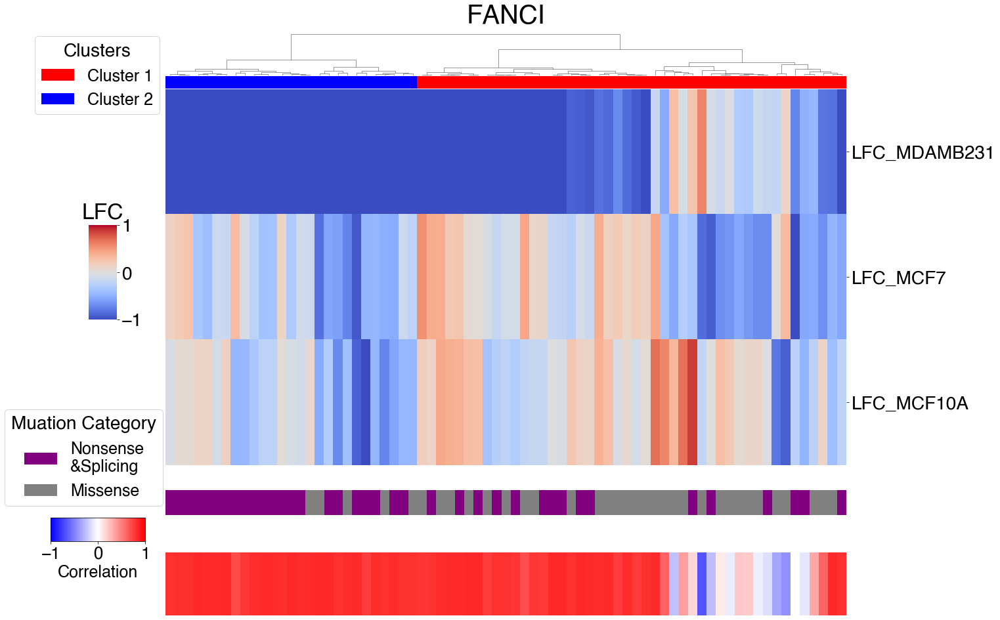

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCI_DimReduction.png


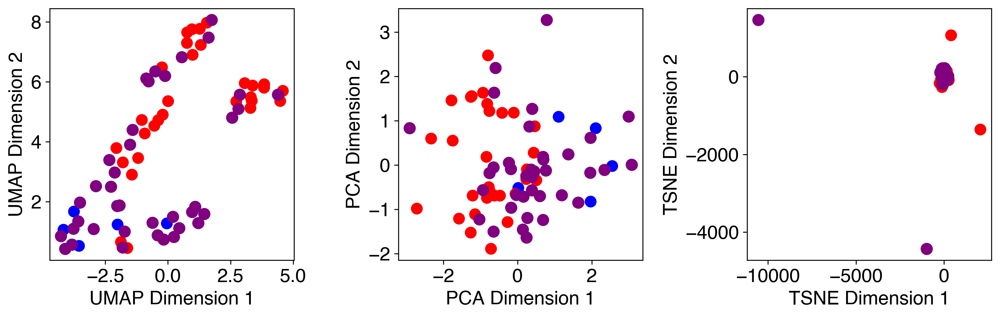

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCL_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

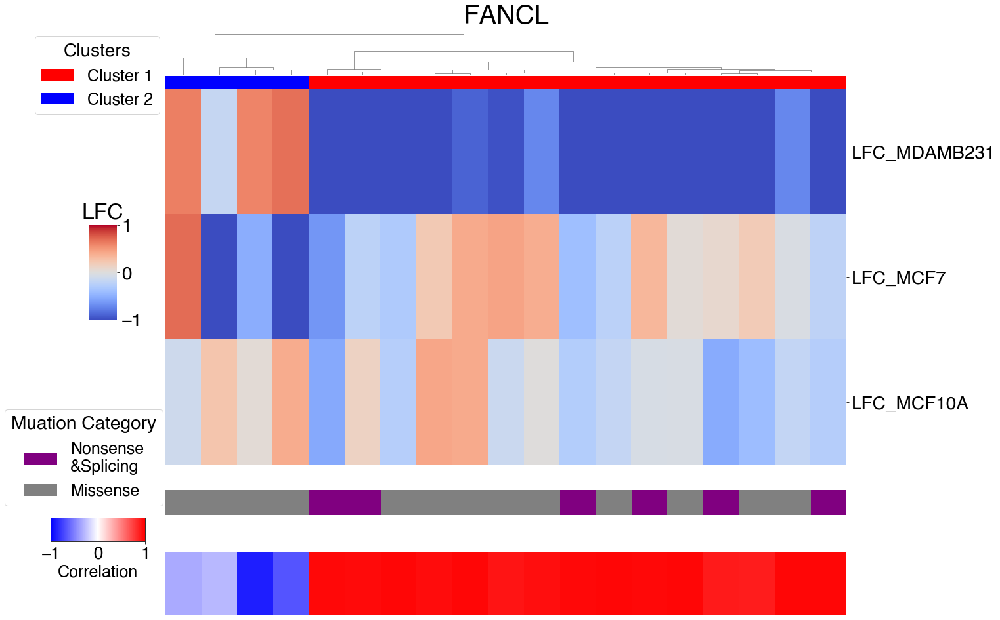

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCL_DimReduction.png


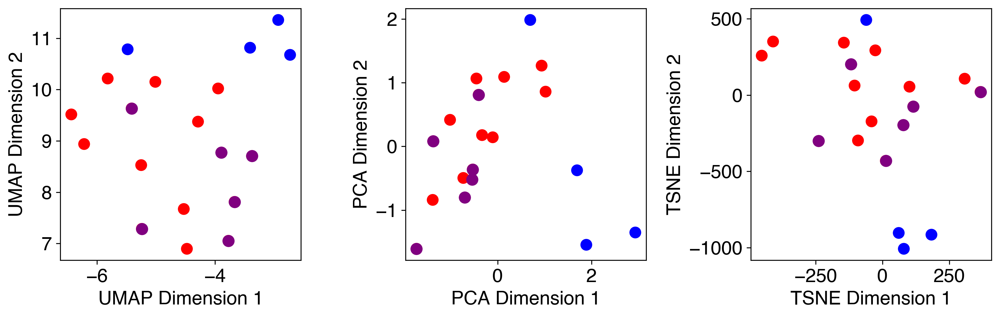

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCM_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

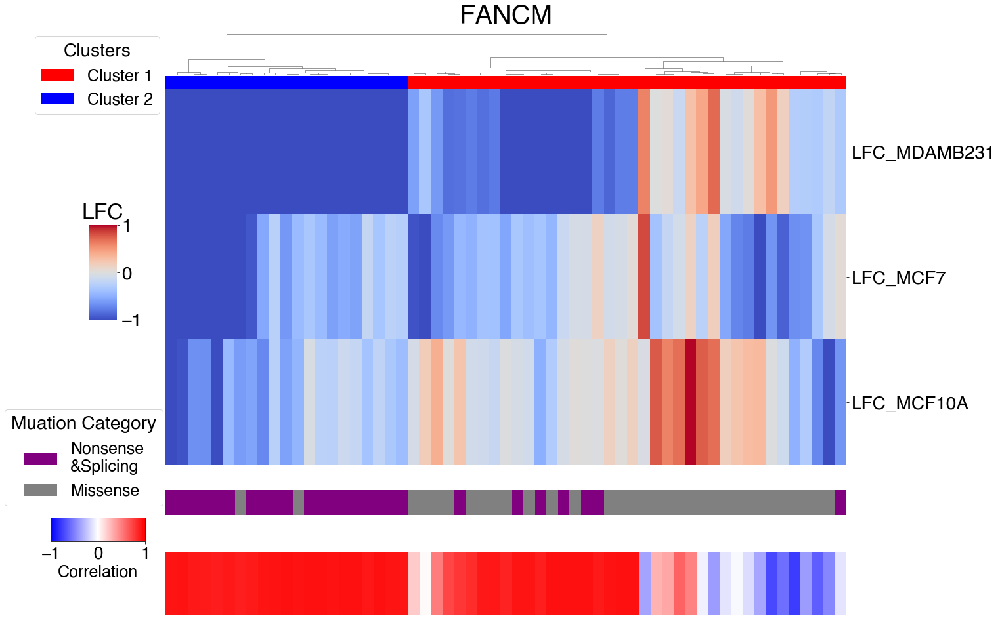

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/FANCM_DimReduction.png


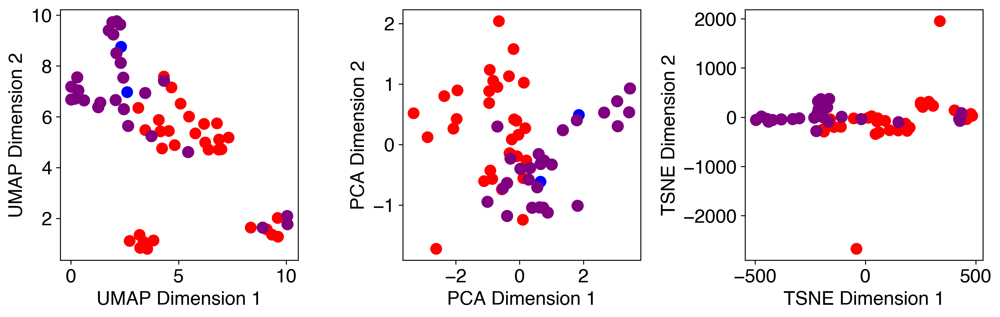

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/MRE11A_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

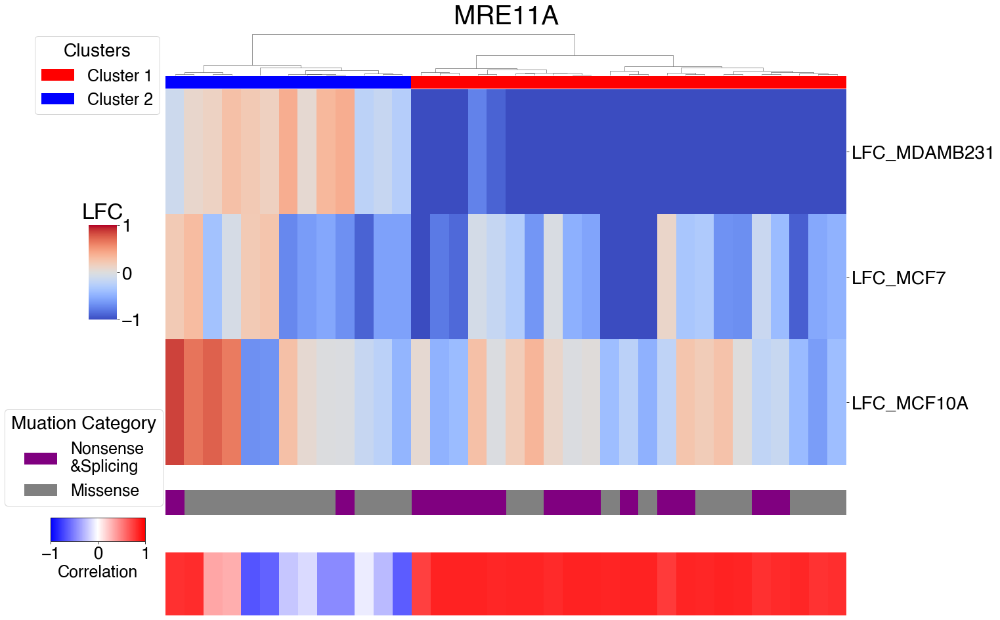

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/neighbors/base.py:432: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < LooseVersion('0.12'):
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/MRE11A_DimReduction.png


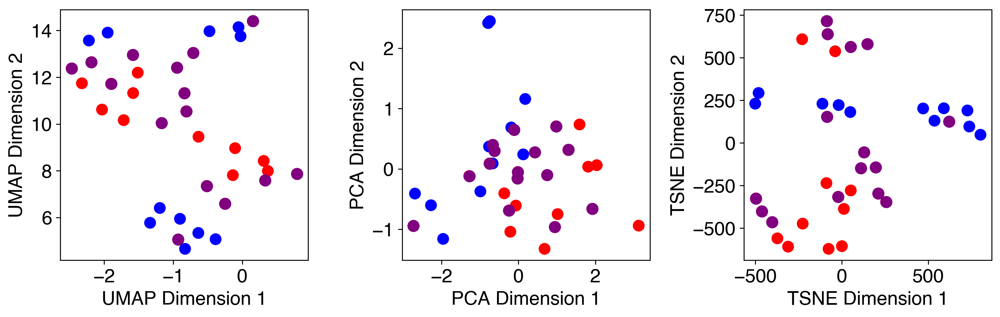

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/NBN_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

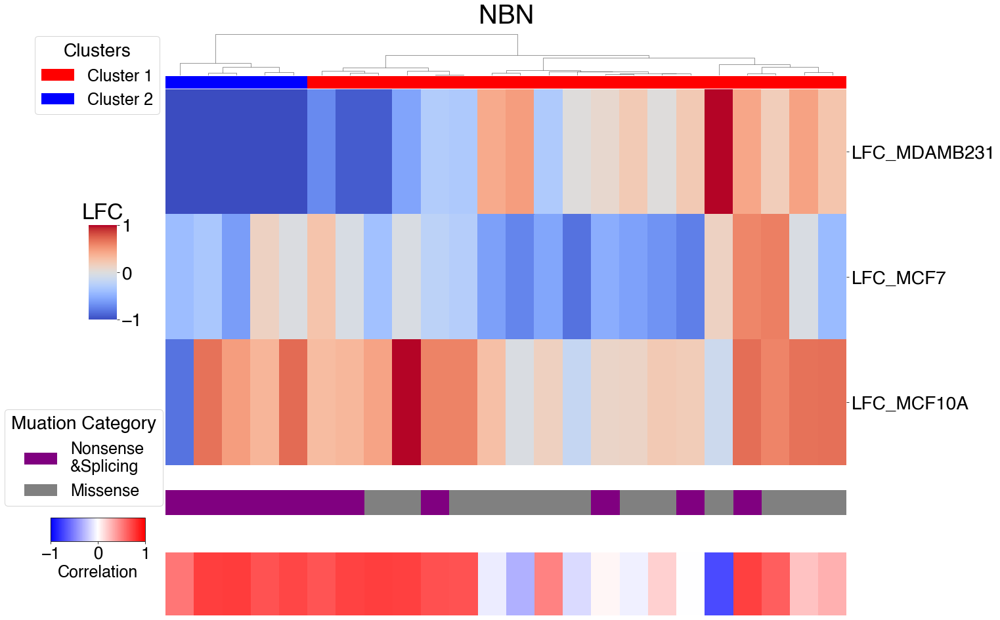

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/NBN_DimReduction.png


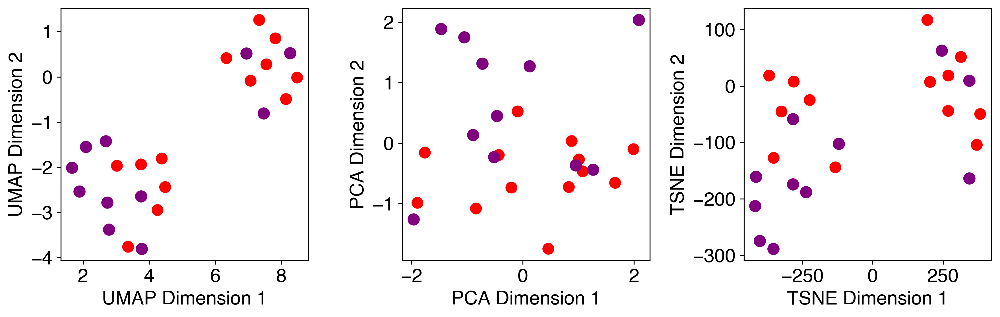

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/PALB2_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

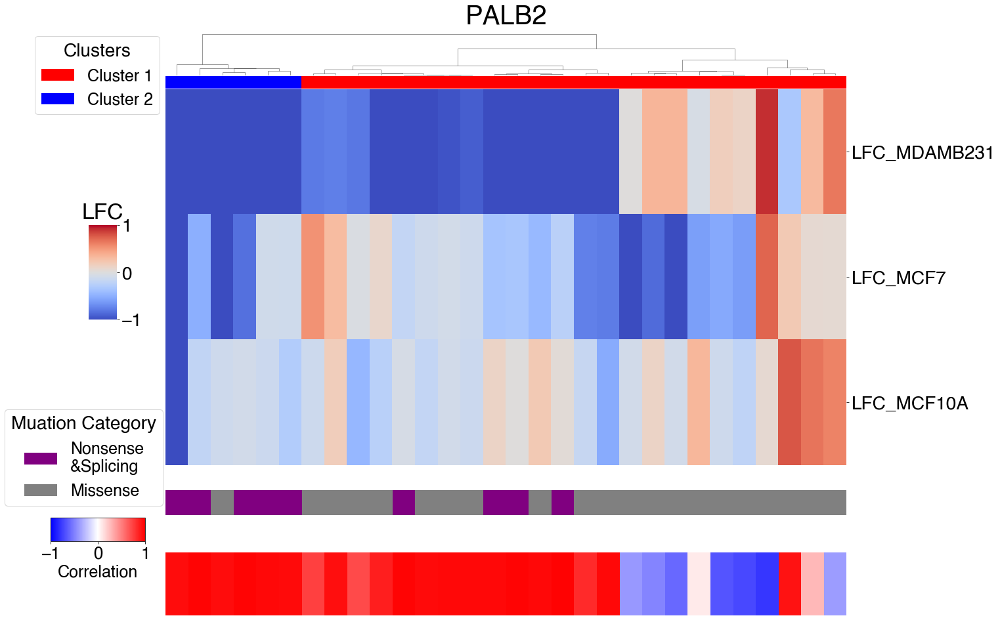

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/PALB2_DimReduction.png


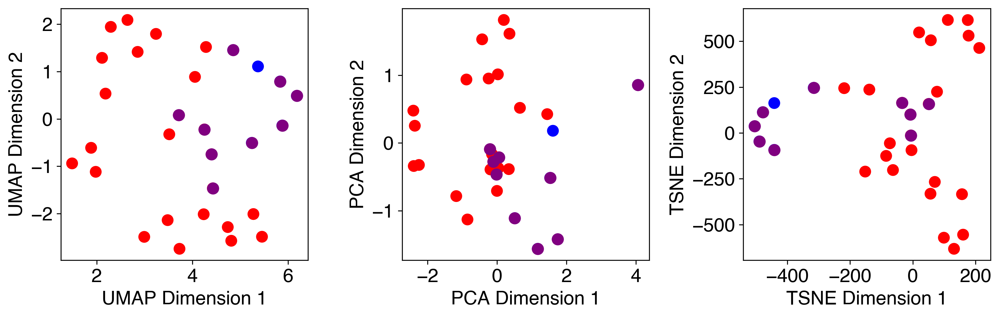

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/RAD50_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

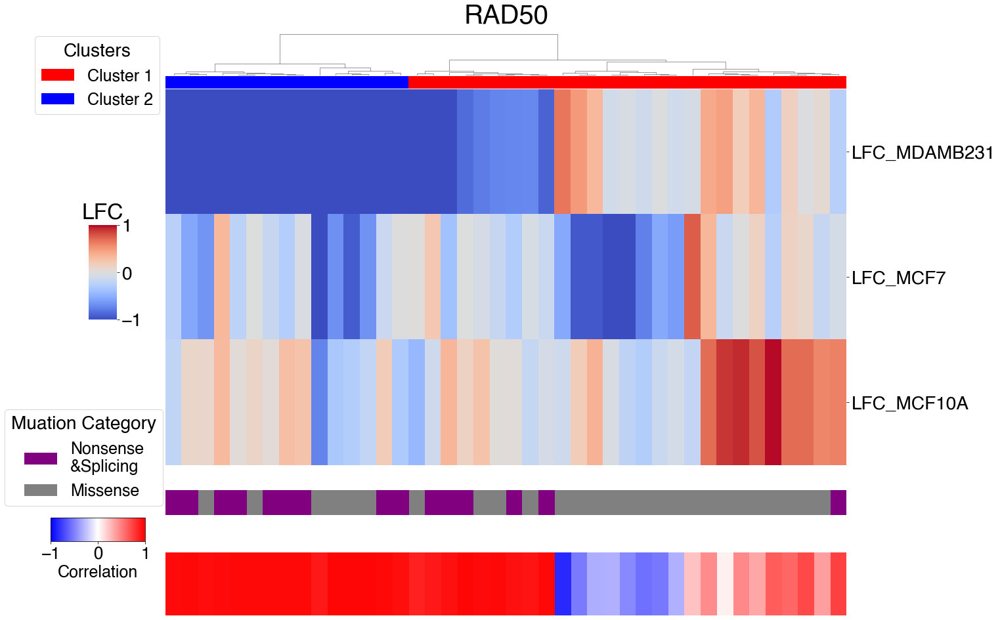

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklear

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/RAD50_DimReduction.png


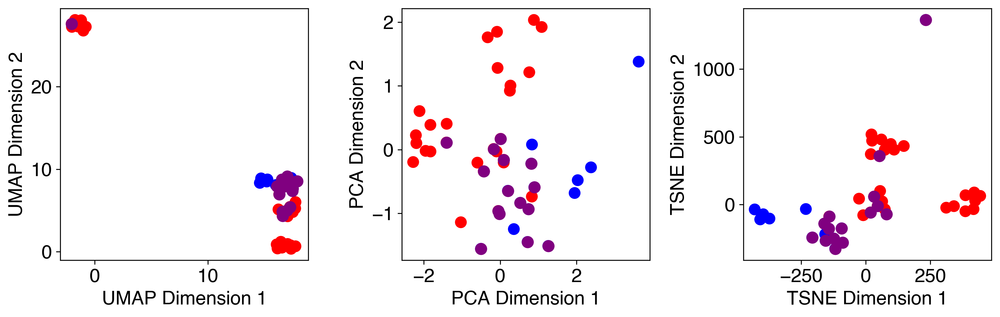

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/RAD51C_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

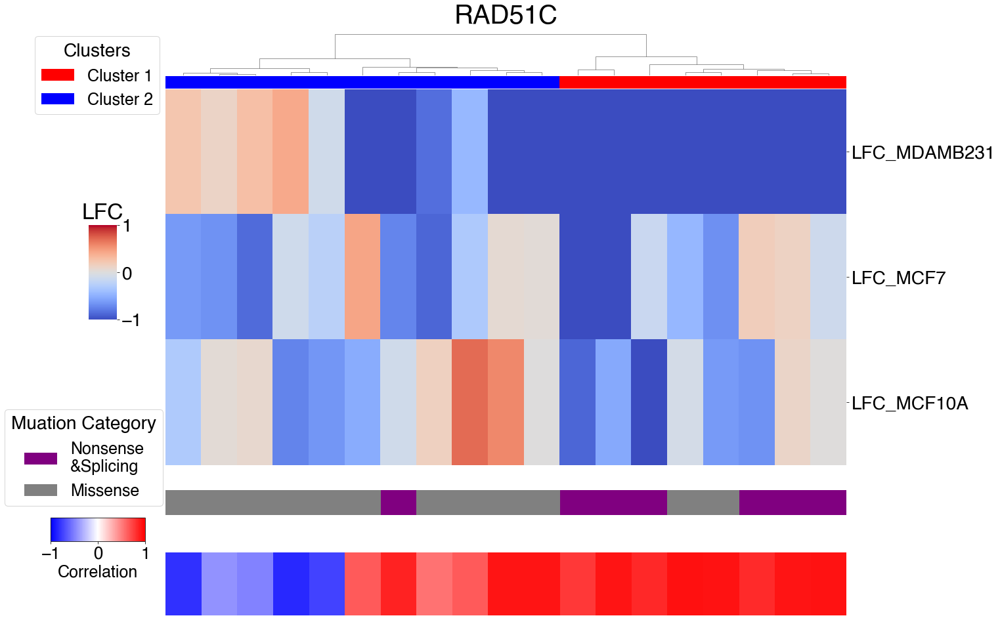

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/RAD51C_DimReduction.png


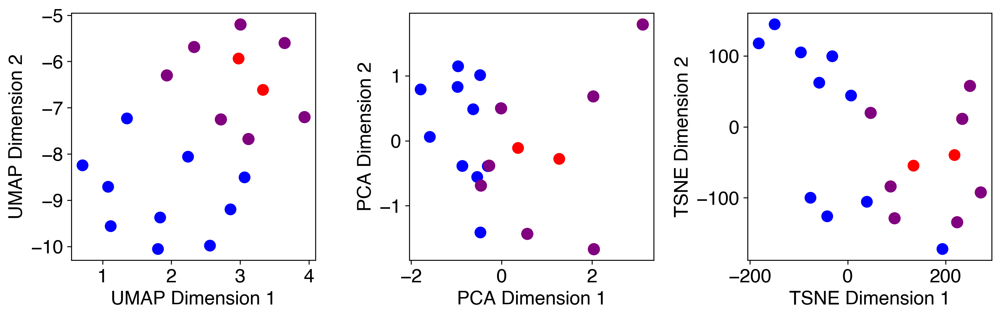

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/RAD51D_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

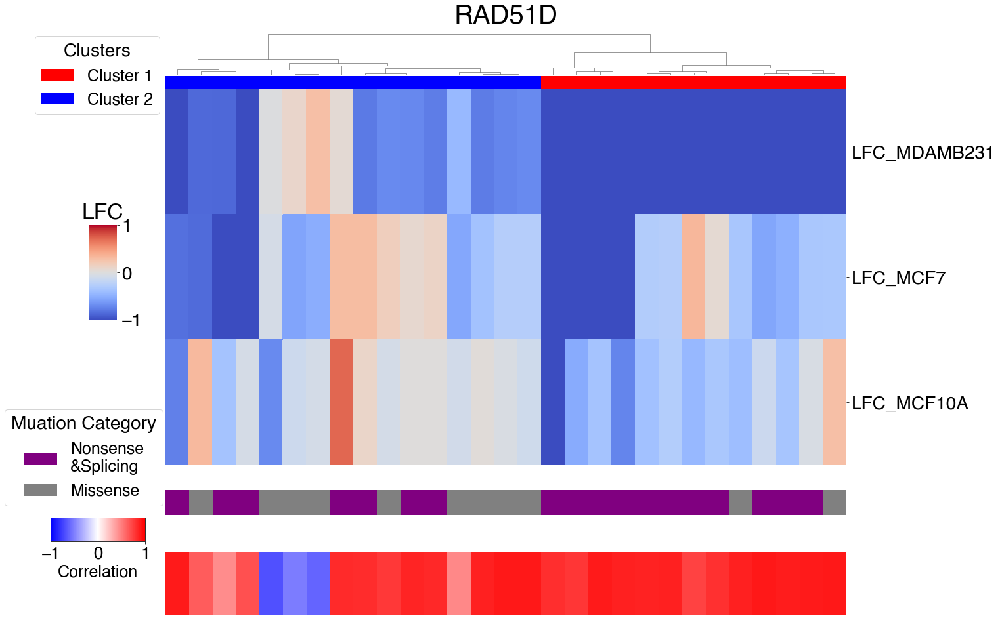

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/RAD51D_DimReduction.png


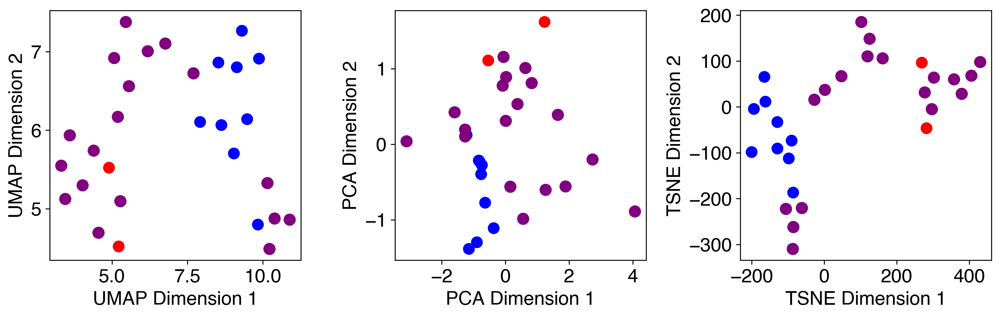

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/RECQL_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

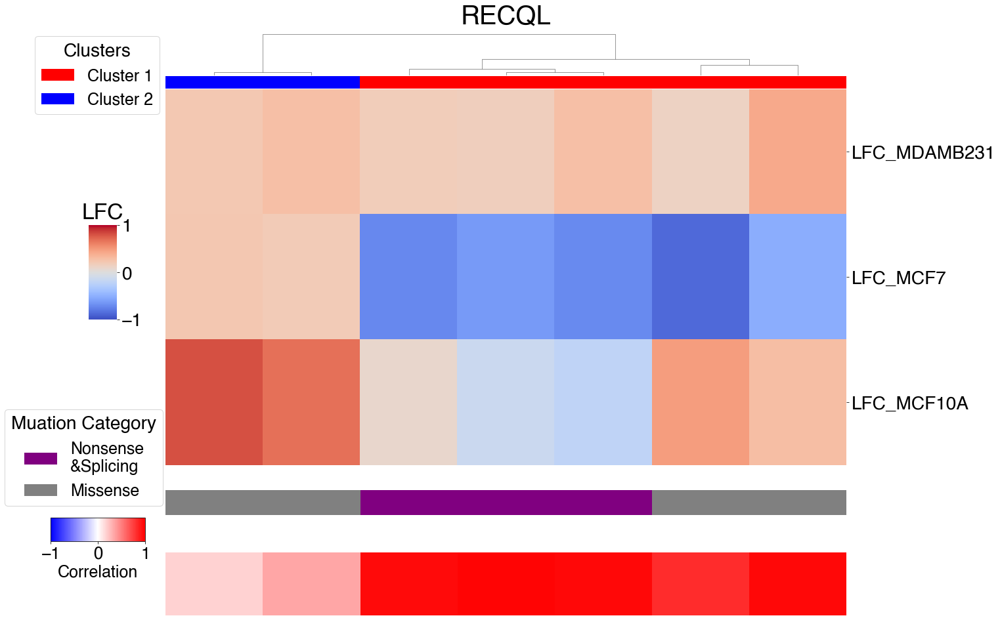

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/RECQL_DimReduction.png


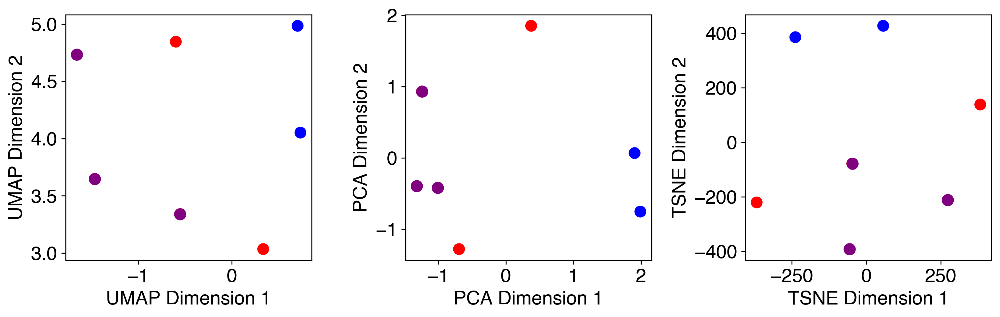

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/WRN_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

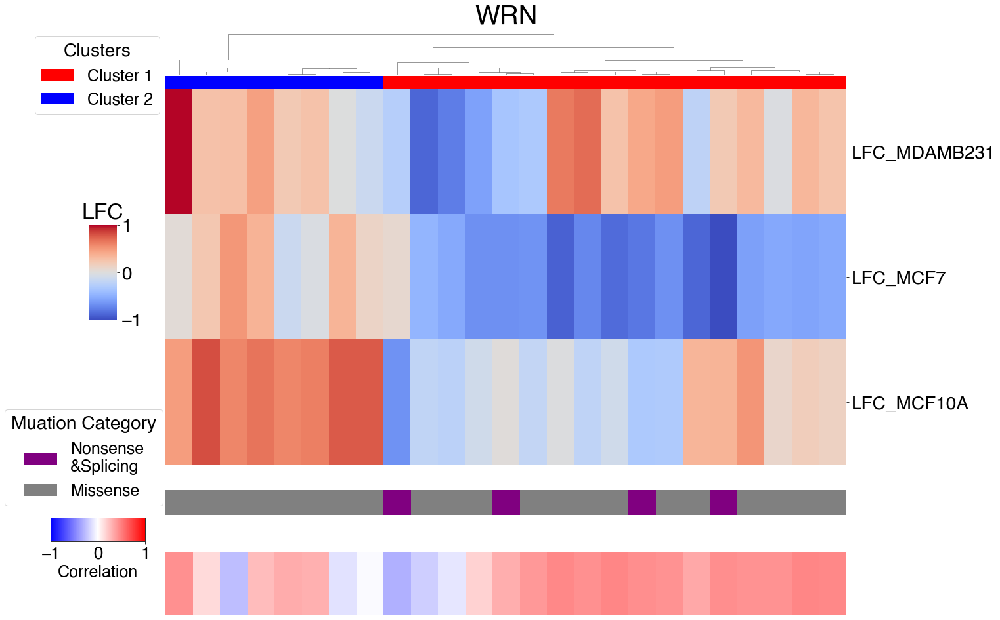

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/WRN_DimReduction.png


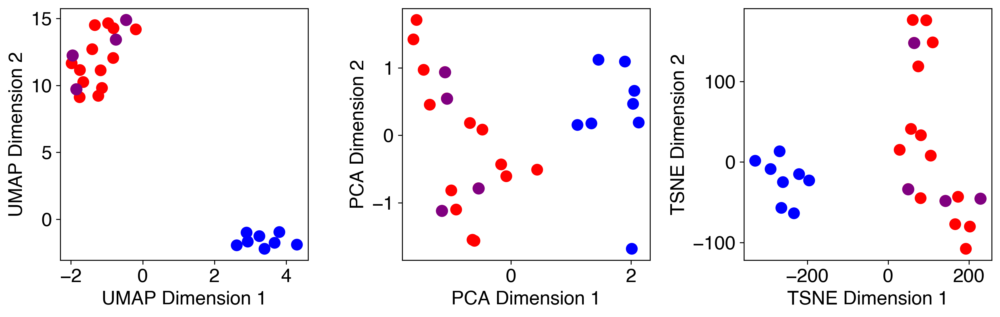

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:204: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if LooseVersion(joblib_version) < '0.12':
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/XRCC3_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

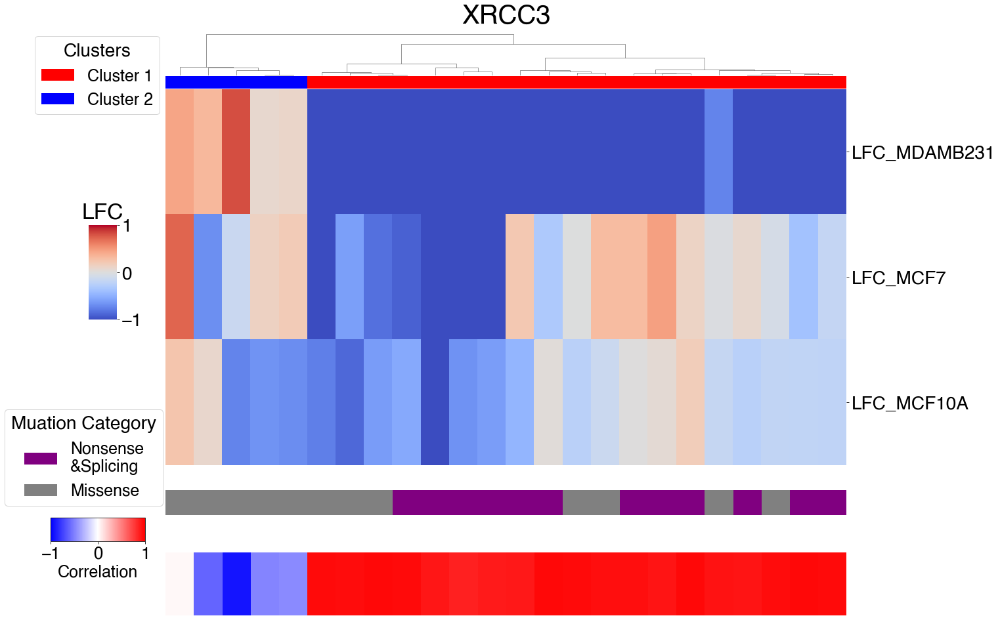

/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/metrics/pairwise.py:54: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  dtype = np.float
/home/whe/anaconda3/lib/python3.7/site-packages/sklearn/manifold/t_sne.py:347: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  error = np.finfo(np.float).max
/home/whe/anaconda3/lib/python3.7/site-pa

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/XRCC3_DimReduction.png


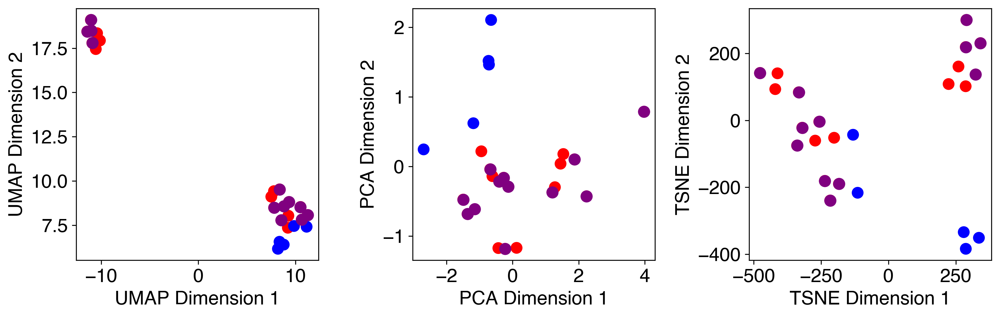

In [5]:
for gene in sorted(set(df['Gene'])):
    df_sig = df[(df['Zscore_max']>2)]
    sample_ls = ['LFC_MDAMB231','LFC_MCF7','LFC_MCF10A']
    df_gene = df_sig[df_sig['Gene']==gene]

    if df_gene.shape[0] > 5:
        df_clust = clustering(df_gene,gene,sample_ls,'',2,'ward','euclidean','Test')

In [22]:
for gene in sorted(set(df['Gene'])):
    print(gene)

ATM
ATR
BARD1
BLM
BRCA1
BRCA2
BRIP1
CDK12
CHEK2
FANCA
FANCC
FANCD2
FANCE
FANCF
FANCG
FANCI
FANCL
FANCM
MRE11A
NBN
PALB2
RAD50
RAD51C
RAD51D
RECQL
WRN
XRCC3


/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/MRE11A_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

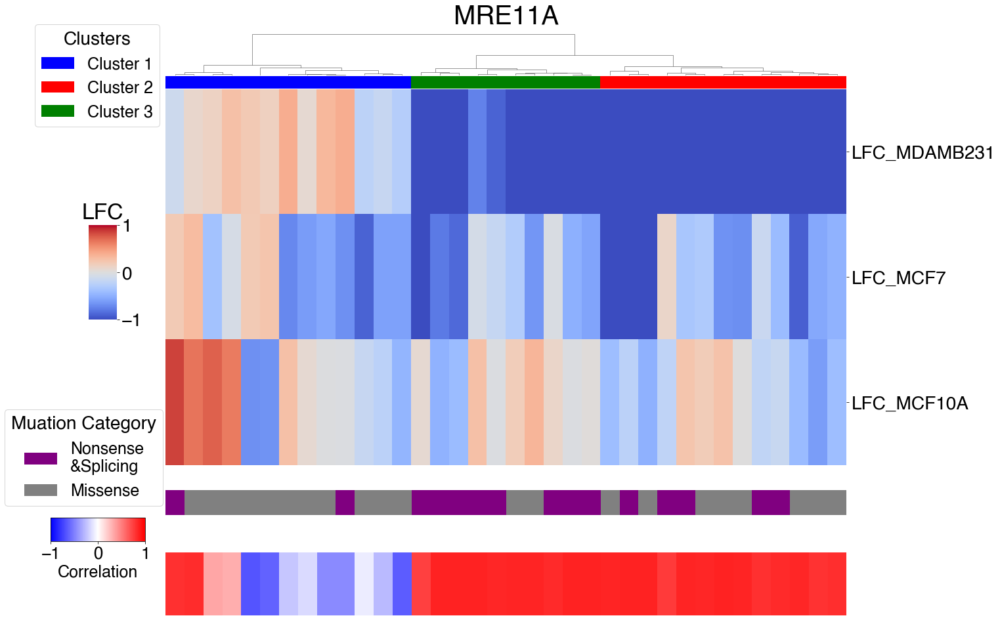

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/MRE11A_DimReduction.png


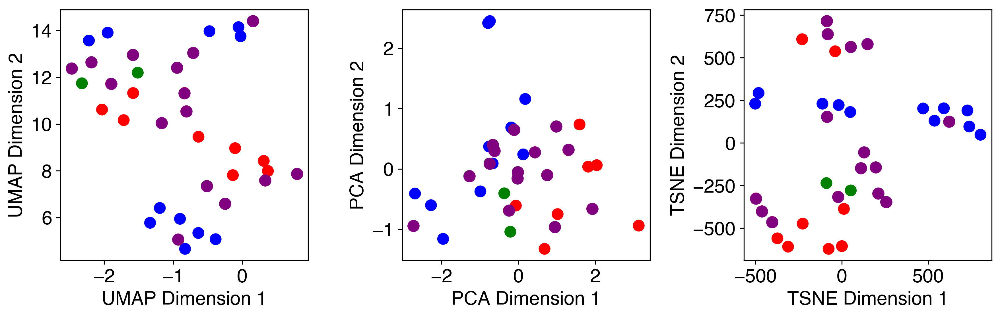

In [81]:
gene = 'MRE11A'

df_sig = df[(df['Zscore_max']>2)]

sample_ls = ['LFC_MDAMB231','LFC_MCF7','LFC_MCF10A']

df_gene = df_sig[df_sig['Gene']==gene]
df_clust = clustering(df_gene,gene,sample_ls,'',3,'ward','euclidean','Test')

In [82]:
visualization_1d(df,df_clust,gene,'Test')

KeyError: 'MRE11A'

In [54]:
df_clust[df_clust['Cluster']==0]

,Gene,sgRNA_ID,sgRNA_sequence,AAChg,Function,T0_R1,T0_R2,T0_R3,T18_UNT_R1,T18_UNT_R2,...,AA,AA_str,AA_name,NegativeControl,Zscore_MDAMB231,Zscore_MCF7,Zscore_MCF10A,Zscore_max,Cluster,Correlation
missense_M163,FANCF,Core-FANCF.49,TCTTCATCAGAGAGTCCTCC,p.M163I p.M163I p.L162=,missense,0.294723,0.078641,0.367781,0.328922,0.359820,...,163,163,M,0,0.971920,0.131316,2.025693,2.025693,0,-0.811375
missense_V263,FANCF,Core-FANCF.23,AGTCACTAAAGTCAAAAGCC,p.V263I p.V263M p.V263=,missense,-0.017617,0.336311,0.135999,-0.020368,-0.127757,...,263,263,V,0,0.531923,2.742215,0.049192,2.742215,0,-0.163757
missense_V91,FANCF,Core-FANCF.74,CAGGACGTCACAGTGACCGA,p.V91I,missense,0.603620,0.619726,0.446378,0.355512,0.274958,...,91,91,V,0,0.758756,0.177104,3.096816,3.096816,0,0.592506
missense_P117,FANCF,Core-FANCF.142,CTTTCCCGGCCCGGGCGTCC,p.P117F p.P117S p.P117F p.P117S p.P117L p.P117...,missense,0.487600,0.317249,0.347119,-0.042415,-0.013362,...,117,117,P,0,0.161662,3.080429,1.005175,3.080429,0,0.959135
missense_R122,FANCF,Core-FANCF.65,GCGTCCCGGACGCCCGGGCC,p.R122= p.R122Q p.R122_D123delinsQN p.D123N p....,missense,0.861049,0.957497,1.102335,1.176203,0.795510,...,122,122,R,0,0.825365,2.700335,1.062276,2.700335,0,0.973999
missense_A124,FANCF,Core-FANCF.64,GGCGTCCCGGACGCCCGGGC,p.A124T p.R122= p.R122Q p.R122_D123delinsQN p....,missense,-2.438833,-1.682234,-1.959542,-2.612184,-3.085941,...,124,124,A,0,0.355368,3.553204,1.333190,3.553204,0,0.977960
missense_A124,FANCF,Core-FANCF.63,CATCGGCGTCCCGGACGCCC,p.A124T p.A124_D125delinsTN p.D125N,missense,0.882888,0.999494,1.052154,0.728582,0.664825,...,124,124,A,0,0.542977,2.005072,0.131181,2.005072,0,0.821545
missense_G225,FANCF,Core-FANCF.36,GCCGGGTTCCAACTCTTCTT,p.G225S,missense,1.149736,1.071265,1.072751,1.268082,1.293359,...,225,225,G,0,0.249627,1.373629,3.353407,3.353407,0,0.954068
missense_R122,FANCF,Core-FANCF.143,GGGCGTCCGGGACGCCGATG,p.G120= p.R122W p.R122W p.GV120= p.R122W p.V12...,missense,0.319337,0.317249,0.284655,0.421428,-0.029626,...,122,122,R,0,0.337428,2.450049,0.466003,2.450049,0,0.977523
missense_V31,FANCF,Core-FANCF.92,GCGCACGGTGGCGGGGTCCC,p.V31= p.V31I p.V31M,missense,0.348032,0.168105,0.187756,0.401151,0.635555,...,31,31,V,0,0.050361,0.624009,5.100913,5.100913,0,0.972355


In [2]:
from collections import Counter
import re


df_be = pd.read_csv('../Tcell_Nature_dataset/Tcell_screen_Nature.csv')
df_be = df_be.dropna(subset=['Mutation'])
df_be.reset_index(drop=True,inplace=True)

mut_ls = []; aa_ls = []

for s in df_be['Mutation']:
    ls = s.split(',')
    counter = Counter(ls)
    most_common = counter.most_common(1)[0]
    mut = most_common[0]
        
    if 'splice' in mut:
        mut = 'splice'; aa = 'NA'
        print(mut,aa)
        mut_ls.append(mut)
        aa_ls.append(aa)
            
    elif '*' in mut:
        mut = 'nonsense'; aa = 'NA'
        print(mut,aa)
        mut_ls.append(mut)
        aa_ls.append(aa)
    
    else:
        match = re.search(r'\d+', mut)
        if match:
            aa = match.group()
            aa_ls.append(int(aa))
        else:
            aa = 'NA'
            aa_ls.append(aa)
        print(mut,aa)
        mut_ls.append(mut)
        
df_be['Mutation'] = mut_ls
df_be['AA'] = aa_ls

df_be['lfc_max'] = [max([abs(df_be['CD25'][i]),abs(df_be['IFNG'][i]),abs(df_be['PD1'][i]),abs(df_be['TNFa'][i])]) \
                            for i in range(df_be.shape[0])]

df_neg = df_be[df_be['Gene']=='NT']

m = df_neg['lfc_max'].mean()
s = df_neg['lfc_max'].std()

df_be['Zscore'] = (df_be['lfc_max']-m)/s

/home/whe/anaconda3/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3319: DtypeWarning: Columns (5,6,7,8) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


C415R 415
L691P 691
Y346H 346
C422R 422
L691P 691
K185E 185
I273T 273
K185K 185
Y582C 582
Y518C 518
C422R 422
D1207G 1207
L257P 257
H295R 295
L390P 390
C43R 43
L270P 270
Y176C 176
C415R 415
Y348H 348
K252E 252
F387S 387
E580G 580
C349R 349
M207T 207
splice NA
C200R 200
None NA
L14P 14
C106R 106
splice NA
E48G 48
H295R 295
C205R 205
L871P 871
T198A 198
splice NA
C349R 349
L161P 161
C43R 43
L572P 572
L871P 871
L277P 277
L265P 265
L390P 390
Y28H 28
I340T 340
S245P 245
Y176H 176
L199P 199
W236R 236
L871P 871
L158P 158
None NA
I177T 177
V338V 338
I177T 177
None NA
L272P 272
splice NA
W311R 311
None NA
V181A 181
L272P 272
M173T 173
L51P 51
I168T 168
G666G 666
K252E 252
splice NA
K209E 209
splice NA
splice NA
splice NA
None NA
F250S 250
Y687H 687
splice NA
H584R 584
splice NA
E322G 322
None NA
Y286H 286
L36P 36
C201R 201
splice NA
F133L 133
D83G 83
splice NA
W623R 623
C531R 531
Y753H 753
Y315H 315
splice NA
S333P 333
Y315H 315
L546S 546
R485G 485
Y700C 700
splice NA
L49P 49
W27R 27
Y508H 508


L760P 760
L429P 429
L511P 511
E156G 156
Y70H 70
R421G 421
I119T 119
C825R 825
L641P 641
None NA
E199G 199
L1033P 1033
None NA
Y105H 105
M305T 305
Y266H 266
None NA
E842G 842
splice NA
Y397H 397
C803R 803
Y321H 321
I133M 133
None NA
S274P 274
S172P 172
C538R 538
Q58R 58
N72D 72
None NA
S211P 211
C167R 167
N208D 208
F256S 256
V273A 273
splice NA
L269P 269
F966S 966
L511P 511
T1T 1
T382T 382
V771A 771
Y321H 321
L260P 260
W120R 120
None NA
Y370C 370
D101G 101
I110T 110
E225G 225
I3V 3
F116S 116
None NA
D106G 106
I2162T 2162
None NA
None NA
K108E 108
None NA
L50P 50
C398R 398
E121G 121
splice NA
Y37H 37
L358P 358
L890S 890
K95E 95
I234T 234
L403P 403
L461P 461
None NA
F973S 973
L340P 340
D1058G 1058
M665T 665
None NA
None NA
I356T 356
L2010P 2010
L726P 726
L158P 158
splice NA
W250R 250
Y279H 279
C89R 89
None NA
F82S 82
F106S 106
S801P 801
L191P 191
L174P 174
splice NA
L614P 614
T753A 753
E94G 94
D711G 711
Q310R 310
Y133H 133
C364R 364
Y672C 672
L2208P 2208
L833P 833
T197A 197
E1G 1
V75A 75


I659T 659
K781E 781
G9G 9
None NA
C5R 5
V690A 690
E61G 61
None NA
R137R 137
E863G 863
I172T 172
L153P 153
C118R 118
H448R 448
F127S 127
H109R 109
F340L 340
C251R 251
V408A 408
I734V 734
K1051R 1051
R460R 460
None NA
M0T 0
F238L 238
splice NA
E579E 579
L727P 727
K494E 494
R119R 119
T662A 662
None NA
S150P 150
Y266C 266
None NA
None NA
None NA
L189P 189
Y153H 153
splice NA
N185D 185
I41T 41
K16E 16
F199S 199
S90P 90
S963P 963
Y213H 213
C330R 330
L298P 298
None NA
L203P 203
Y692H 692
splice NA
Y191C 191
K126R 126
D90G 90
L78P 78
M0V 0
C62R 62
None NA
L140P 140
L31P 31
S644P 644
V130V 130
None NA
C281R 281
T148A 148
L2353P 2353
I26V 26
I125V 125
H565R 565
None NA
L117P 117
P178P 178
E40G 40
V262A 262
E90G 90
L174P 174
Y382H 382
D56G 56
N537D 537
L32L 32
D325G 325
L86P 86
None NA
E289G 289
L129P 129
E354G 354
L289P 289
L643S 643
F58F 58
L2P 2
A266A 266
Y324C 324
R706G 706
I250T 250
Q184R 184
L708P 708
C412R 412
None NA
P698P 698
L195P 195
L208P 208
Y646C 646
Y130H 130
F458S 458
S269S 269
No

I6T 6
None NA
K122R 122
S1414P 1414
L264P 264
H431R 431
E571G 571
F580S 580
A292A 292
None NA
Q454R 454
C800R 800
F1012S 1012
V695A 695
H482R 482
S482P 482
L226P 226
G135G 135
I398T 398
L686P 686
L717S 717
splice NA
K433R 433
None NA
splice NA
splice NA
H598R 598
L195P 195
L476P 476
Y240C 240
None NA
splice NA
T413A 413
I460V 460
S32G 32
L287P 287
L404P 404
E311G 311
S724P 724
R1314G 1314
None NA
None NA
L204P 204
Y479C 479
None NA
None NA
I367T 367
S496P 496
F366L 366
E624G 624
None NA
C1119R 1119
splice NA
E792G 792
D387G 387
N192D 192
C192R 192
H39R 39
E142G 142
N52D 52
I230T 230
None NA
E32G 32
Y197H 197
L2P 2
L171P 171
M324T 324
None NA
L833P 833
N636D 636
V296A 296
A34A 34
L63P 63
E584G 584
E256G 256
splice NA
V1056A 1056
K164E 164
Q923R 923
None NA
C141R 141
R337G 337
Q1958R 1958
H517R 517
C22R 22
K371E 371
L58P 58
L197P 197
L156P 156
Y63C 63
L188P 188
E555G 555
K535E 535
splice NA
S541S 541
splice NA
M418T 418
L42P 42
R215G 215
L1422L 1422
I522V 522
None NA
D173G 173
F785S 785


A1A 1
splice NA
None NA
None NA
F408L 408
E488G 488
S615P 615
Q526R 526
None NA
T26A 26
S673P 673
None NA
E279G 279
None NA
splice NA
H462R 462
E675G 675
D104D 104
H610R 610
None NA
L241P 241
F372S 372
F323S 323
K466E 466
Y231H 231
Q271R 271
None NA
E900G 900
V241A 241
H556R 556
None NA
None NA
L442P 442
W522R 522
E119G 119
L794P 794
S332S 332
None NA
splice NA
None NA
D391G 391
None NA
F106S 106
I135T 135
S115P 115
M255V 255
None NA
None NA
V200V 200
Q203R 203
R530G 530
None NA
T237T 237
V29A 29
S351P 351
Q187R 187
F153S 153
W274R 274
splice NA
W257R 257
V1203A 1203
I773T 773
K296E 296
D1D 1
E30G 30
T99A 99
K22E 22
None NA
W151R 151
Q137R 137
N443S 443
V755A 755
F270S 270
None NA
R85R 85
None NA
F383S 383
None NA
C776R 776
A1306A 1306
E252G 252
E258G 258
S119P 119
E129G 129
L412P 412
Y748H 748
E306G 306
F512S 512
None NA
None NA
K530E 530
P1274P 1274
V797A 797
Y1066H 1066
Q265R 265
E1497G 1497
None NA
Y173H 173
F69S 69
T535T 535
L526P 526
Q85R 85
splice NA
F248S 248
Q4R 4
Y746H 746
A2

C346R 346
L317P 317
splice NA
V253A 253
None NA
Y305C 305
K585E 585
R68G 68
P361P 361
N455N 455
A725A 725
Q46R 46
L306P 306
K156R 156
None NA
S237S 237
T712T 712
None NA
L178P 178
K457E 457
Y2541C 2541
L43P 43
L712P 712
None NA
F105S 105
S121S 121
F69S 69
V602V 602
splice NA
None NA
L23P 23
splice NA
L1652S 1652
Y148C 148
T107T 107
P70P 70
K258E 258
Y1545H 1545
I163T 163
splice NA
L131P 131
None NA
E115G 115
C224R 224
L51P 51
L89P 89
R356G 356
None NA
N185N 185
D77G 77
None NA
L669P 669
N159D 159
K1205E 1205
D805G 805
F203S 203
L76P 76
L301P 301
S116P 116
E123G 123
N3S 3
None NA
C193R 193
L139P 139
D1422G 1422
R81G 81
R298R 298
None NA
I81V 81
P450P 450
L289P 289
S451P 451
V494A 494
Q60R 60
K428R 428
P72P 72
L479P 479
H243H 243
None NA
W173R 173
splice NA
Y417H 417
L250S 250
R219G 219
D330G 330
T477T 477
A562A 562
None NA
Y123C 123
H93R 93
N831D 831
None NA
None NA
K515E 515
L396P 396
L241P 241
E618G 618
I247V 247
K60E 60
W350R 350
None NA
Q324R 324
L158L 158
N560S 560
S138P 138
F382S 

M172V 172
None NA
None NA
None NA
None NA
P387P 387
W55R 55
Q247Q 247
L37P 37
M575V 575
D201G 201
L93P 93
splice NA
R123R 123
H1051R 1051
None NA
H485R 485
F263S 263
None NA
L751P 751
N1063D 1063
G22G 22
E168G 168
T468A 468
None NA
F423S 423
I221V 221
S84G 84
None NA
V498A 498
Y521H 521
N377D 377
S336P 336
None NA
L595P 595
C664R 664
G346G 346
N100D 100
C458R 458
L460P 460
S904P 904
H98R 98
M114T 114
P278P 278
T42A 42
H514H 514
None NA
S852S 852
I481T 481
I216T 216
None NA
K32R 32
V63A 63
H307R 307
E442G 442
None NA
None NA
S644P 644
S137S 137
Q22R 22
S423P 423
I713T 713
F172S 172
K370R 370
E303G 303
S1500G 1500
None NA
I328T 328
None NA
K78E 78
S672G 672
I543T 543
H264H 264
None NA
V637A 637
L241P 241
C311R 311
C801R 801
L346P 346
L164P 164
Q189R 189
Q721R 721
K673R 673
S278S 278
Q90R 90
None NA
E19E 19
Q171R 171
C128R 128
S363P 363
None NA
T250A 250
Y128C 128
T416A 416
None NA
E266G 266
V134A 134
Q509R 509
A269A 269
E107G 107
splice NA
L507P 507
Y105H 105
Q382R 382
L87P 87
None NA
V9

None NA
E232G 232
R897G 897
None NA
I30V 30
S730P 730
N1400D 1400
F1696S 1696
None NA
M0T 0
T210A 210
L144P 144
D123G 123
Y379H 379
N223D 223
splice NA
None NA
L562L 562
K445E 445
Q246R 246
N204N 204
R949G 949
None NA
F643S 643
L597P 597
K62E 62
None NA
L662S 662
L868S 868
K183K 183
I330T 330
None NA
None NA
N101S 101
splice NA
S493P 493
C657C 657
T249A 249
E186G 186
T592A 592
None NA
None NA
P265P 265
Q634R 634
E53G 53
I497T 497
C19R 19
None NA
I198T 198
I272T 272
I558T 558
C262R 262
E1238E 1238
G710G 710
N360S 360
I573T 573
P143P 143
P1028P 1028
D10G 10
None NA
Q284R 284
None NA
splice NA
S293P 293
L152L 152
G412G 412
L661P 661
A387A 387
None NA
None NA
I1365T 1365
None NA
None NA
None NA
L356P 356
N42S 42
G109G 109
D96D 96
F103S 103
S437P 437
K316E 316
Y348Y 348
None NA
splice NA
splice NA
T344A 344
None NA
None NA
K401E 401
E150G 150
K416E 416
None NA
R270R 270
D353G 353
Q226R 226
None NA
L383S 383
D788G 788
None NA
S417P 417
None NA
V29A 29
I12T 12
S137G 137
R507G 507
S399P 399
V2

Q633R 633
D172G 172
M365T 365
D62D 62
N302N 302
S70S 70
None NA
L59P 59
S28G 28
C328R 328
None NA
None NA
E158G 158
Y720H 720
K18E 18
S842S 842
None NA
I345T 345
V428A 428
E534G 534
None NA
Q764R 764
G429G 429
C213R 213
Y141C 141
E207G 207
V1048A 1048
T712T 712
D480G 480
L530P 530
splice NA
None NA
R252G 252
None NA
L175P 175
L174P 174
V96A 96
None NA
None NA
L163L 163
F489S 489
C749R 749
R345R 345
P251P 251
K124E 124
N308D 308
W577R 577
V688A 688
T228A 228
T326T 326
K143E 143
C264R 264
R200G 200
L1008S 1008
None NA
H1597R 1597
Y79H 79
splice NA
None NA
T169A 169
L58P 58
C219R 219
L18P 18
V14A 14
None NA
E48G 48
K247R 247
I16V 16
F510S 510
A440A 440
None NA
None NA
None NA
C9R 9
S103P 103
None NA
S711S 711
L17P 17
Y165H 165
None NA
None NA
H694R 694
I304V 304
Q447R 447
Q404R 404
None NA
P708P 708
D341G 341
I1535M 1535
E503G 503
None NA
F438L 438
L153P 153
S31G 31
T19A 19
Y107C 107
None NA
V116A 116
None NA
K19E 19
M9V 9
H21H 21
None NA
None NA
L161P 161
T137A 137
Y21C 21
F248S 248
Y193

Y88H 88
S26S 26
Y668H 668
None NA
F103S 103
None NA
G134G 134
C121R 121
K611E 611
K5E 5
E291G 291
L261P 261
I594V 594
L588L 588
S29P 29
L1025P 1025
None NA
V176A 176
D474G 474
E190G 190
splice NA
I848V 848
Y883C 883
S1170G 1170
D521G 521
None NA
S211P 211
Q26R 26
None NA
C92R 92
C369R 369
None NA
H1153R 1153
S252S 252
T361A 361
N178D 178
None NA
Q360R 360
D835G 835
S1P 1
None NA
Y117C 117
T49A 49
None NA
S123P 123
Y617C 617
None NA
Y47H 47
None NA
Q41R 41
splice NA
L291P 291
I108T 108
L186P 186
M197V 197
V436A 436
F365S 365
E874G 874
N32D 32
R367R 367
Y236H 236
None NA
None NA
M115V 115
K624E 624
None NA
L165S 165
F531S 531
S197P 197
N116D 116
A430A 430
None NA
E625G 625
K455R 455
M1240T 1240
E242G 242
I324V 324
L519S 519
Q321R 321
None NA
K401E 401
V731A 731
Y251H 251
M0V 0
T637A 637
None NA
K708R 708
E988G 988
L301S 301
None NA
F93S 93
Q762R 762
None NA
E784G 784
S226G 226
W7R 7
H1311R 1311
F18S 18
None NA
M23V 23
E31G 31
A172A 172
Y101C 101
splice NA
T246A 246
V92A 92
None NA
None N

R428G 428
None NA
None NA
None NA
D112G 112
P299P 299
splice NA
H604H 604
None NA
None NA
None NA
E141G 141
C621R 621
G1123G 1123
M626V 626
L384P 384
C245R 245
None NA
None NA
A314A 314
F154S 154
W359R 359
A517A 517
F165L 165
V172A 172
I225V 225
K913R 913
None NA
Y360C 360
M717T 717
E937G 937
S327P 327
R156G 156
None NA
E190G 190
None NA
Q65R 65
D594G 594
D521G 521
P730P 730
P445P 445
E131G 131
E82G 82
D548G 548
S486G 486
L383P 383
I139T 139
None NA
None NA
Q225R 225
None NA
S45P 45
splice NA
None NA
D1G 1
K519E 519
None NA
None NA
None NA
Y32H 32
None NA
None NA
L464S 464
None NA
None NA
None NA
None NA
S193P 193
None NA
I801T 801
C413R 413
S506G 506
F1S 1
I1019T 1019
I385T 385
I203T 203
Y199H 199
None NA
G34G 34
M237V 237
H39R 39
I705V 705
R362R 362
Q133R 133
Q608R 608
None NA
L3P 3
None NA
S1081P 1081
P366P 366
D169G 169
I255V 255
None NA
splice NA
None NA
I395T 395
D789G 789
None NA
None NA
S2P 2
K27R 27
E120G 120
L1310S 1310
T644T 644
H554R 554
L527P 527
S422P 422
splice NA
G70G 7

M854V 854
N676N 676
P794P 794
None NA
N506N 506
S203G 203
T178T 178
None NA
None NA
I198V 198
E138G 138
R2G 2
splice NA
None NA
Q931R 931
L732L 732
I337V 337
None NA
S19P 19
C287R 287
V190A 190
S170P 170
P225P 225
S177G 177
P449P 449
I92M 92
L364P 364
M1440T 1440
E797G 797
M432V 432
Y1545C 1545
P555P 555
V327A 327
None NA
E270G 270
T956A 956
K79E 79
Y380Y 380
V651A 651
S439P 439
S361P 361
D1375D 1375
P224P 224
None NA
None NA
Q261R 261
D224G 224
N114D 114
Q100R 100
S329P 329
None NA
None NA
None NA
H319R 319
M438T 438
None NA
None NA
None NA
H322R 322
I319T 319
None NA
Q540R 540
I39V 39
None NA
None NA
S55P 55
None NA
Q170R 170
None NA
K788E 788
splice NA
A1039A 1039
splice NA
E479G 479
None NA
None NA
Q198R 198
I420M 420
S548G 548
A846A 846
F412S 412
A11A 11
None NA
R150R 150
D174G 174
S189G 189
G391G 391
E93G 93
V490A 490
H64R 64
P266P 266
None NA
K640E 640
D270G 270
splice NA
S362S 362
I693T 693
None NA
F158L 158
S1219S 1219
None NA
E459G 459
S832P 832
None NA
Y994H 994
L372L 372
K8

splice NA
None NA
K582E 582
V606A 606
None NA
L94P 94
None NA
N134S 134
Y251C 251
None NA
K538E 538
K116E 116
None NA
E374G 374
S497P 497
M0V 0
None NA
I33T 33
S859P 859
M245V 245
None NA
None NA
S1079P 1079
G87G 87
Y390C 390
None NA
M90T 90
L641P 641
E75G 75
T130A 130
None NA
V46A 46
E13G 13
E630G 630
N115S 115
P198P 198
F280S 280
M621T 621
F303S 303
I1634T 1634
splice NA
L443P 443
L391P 391
S432P 432
None NA
S862S 862
S490S 490
V355A 355
None NA
None NA
V14A 14
L392P 392
Y2448H 2448
N360D 360
K1397E 1397
None NA
Y316H 316
M723T 723
Y814H 814
None NA
I70T 70
V642A 642
M497V 497
L499P 499
None NA
V15A 15
None NA
None NA
Q365R 365
K23E 23
H146H 146
None NA
E232G 232
S71G 71
Y41C 41
None NA
None NA
L608P 608
L6L 6
N437S 437
F1550S 1550
None NA
I70V 70
S661G 661
V832A 832
E186G 186
N162D 162
L270P 270
K334E 334
L383P 383
L749P 749
Y344H 344
E718G 718
S312P 312
I1476T 1476
Q351R 351
I139T 139
Y29C 29
A515A 515
C2093R 2093
I1154V 1154
L538P 538
None NA
None NA
S335P 335
N771D 771
None NA
No

S748P 748
L163L 163
M199V 199
D296G 296
L355L 355
S652P 652
splice NA
V180A 180
Y631C 631
Q577R 577
None NA
None NA
None NA
None NA
P423P 423
S174P 174
E572G 572
H7R 7
T367A 367
K241E 241
I811T 811
E263G 263
T116A 116
F623S 623
None NA
T646A 646
L469P 469
F221S 221
None NA
Q297R 297
None NA
N141D 141
S63P 63
None NA
S66P 66
E368G 368
K240E 240
C117R 117
K134R 134
M402V 402
D119G 119
S1067P 1067
D147G 147
V186A 186
G109G 109
I131V 131
V141A 141
D63G 63
None NA
I69T 69
L91P 91
None NA
S129P 129
None NA
None NA
A26A 26
None NA
Q347R 347
L515P 515
N235D 235
R112R 112
splice NA
M24T 24
E899G 899
splice NA
None NA
None NA
None NA
None NA
M238V 238
None NA
E211G 211
L139P 139
E1427G 1427
None NA
S619S 619
L648P 648
Y36C 36
None NA
None NA
None NA
V443A 443
N332N 332
K814E 814
None NA
D416G 416
C832R 832
L106P 106
V210V 210
D278G 278
None NA
None NA
M0T 0
L34S 34
A398A 398
R764G 764
None NA
W305R 305
R350G 350
T355A 355
T410A 410
None NA
None NA
S22S 22
None NA
R970R 970
L418P 418
None NA
Y80Y

None NA
L255S 255
E89G 89
None NA
None NA
G598G 598
None NA
splice NA
V186A 186
S385P 385
splice NA
M17T 17
P695P 695
D574G 574
None NA
V127V 127
E652G 652
L341S 341
H604H 604
V351V 351
S457G 457
Q178R 178
None NA
N538N 538
Q608R 608
W187R 187
L369P 369
T907T 907
G339G 339
S78S 78
I216T 216
A520A 520
None NA
Q297R 297
S295G 295
H179H 179
I831T 831
T522A 522
None NA
N121N 121
Y197H 197
Y1502H 1502
None NA
M532T 532
None NA
F442S 442
S26S 26
None NA
A354A 354
None NA
None NA
M642T 642
V77V 77
None NA
Y309C 309
M651T 651
A440A 440
S91P 91
H588R 588
Q382R 382
Q80R 80
Y315H 315
None NA
P139P 139
S23S 23
Y1284H 1284
L199P 199
I921I 921
Q26R 26
A319A 319
C534R 534
R203R 203
S9G 9
Y576H 576
None NA
S349P 349
D411G 411
E480G 480
S450P 450
M968V 968
V654A 654
N366D 366
F468S 468
M394V 394
V376A 376
K838E 838
None NA
L293P 293
D446G 446
S298P 298
M0T 0
Q459R 459
E789G 789
F720L 720
nonsense NA
L468P 468
F112S 112
K798E 798
None NA
S259G 259
Q455R 455
None NA
K413E 413
H308R 308
C192R 192
L153L 15

I607T 607
None NA
S1202G 1202
None NA
I14V 14
E385G 385
None NA
N17D 17
T385A 385
L87P 87
R106G 106
Y573C 573
None NA
T1902T 1902
None NA
C205R 205
K457E 457
D619D 619
L200P 200
S229P 229
F857S 857
None NA
None NA
None NA
P276P 276
Y699C 699
F402L 402
None NA
T97A 97
None NA
F273S 273
V25A 25
T596A 596
L58P 58
N3D 3
I494V 494
V354A 354
None NA
Q526R 526
I99V 99
L27S 27
V356A 356
C7R 7
S307G 307
K323E 323
None NA
None NA
None NA
None NA
V14A 14
I362M 362
L846P 846
S86P 86
Y41C 41
None NA
None NA
None NA
None NA
A184A 184
T398A 398
E152G 152
E251E 251
None NA
None NA
I733V 733
E332G 332
N49D 49
None NA
T346A 346
nonsense NA
Y460C 460
None NA
P325P 325
I183T 183
F1087S 1087
V465A 465
K114E 114
Q325R 325
T283A 283
Q90R 90
E191E 191
S1041P 1041
Q2115R 2115
D95D 95
Q325R 325
C963R 963
None NA
A334A 334
None NA
None NA
splice NA
L2P 2
M199V 199
S285S 285
None NA
I115M 115
F25L 25
L769P 769
Y407C 407
E1059G 1059
A625A 625
V38A 38
None NA
None NA
None NA
V476A 476
N468S 468
None NA
None NA
V432

None NA
None NA
None NA
None NA
K278R 278
None NA
E275G 275
S280P 280
E343E 343
None NA
None NA
H733H 733
P22P 22
D800G 800
Q182R 182
R130G 130
V654A 654
S132P 132
None NA
D56G 56
V251A 251
None NA
F3S 3
C415R 415
L784P 784
None NA
C240R 240
None NA
H580R 580
E697G 697
L525P 525
E647G 647
V133A 133
E507G 507
Y365H 365
K650E 650
splice NA
None NA
N324D 324
Q528R 528
F391S 391
E17G 17
N426S 426
K273E 273
L797P 797
None NA
T1649A 1649
F885S 885
None NA
Y407H 407
V69A 69
P1285P 1285
H29H 29
splice NA
I28T 28
L97P 97
C411R 411
E49G 49
K41R 41
L505P 505
K96E 96
V1197A 1197
E28G 28
D501G 501
L5P 5
R154G 154
Q63R 63
Q659R 659
S308G 308
Q124R 124
G39G 39
Q889R 889
D647G 647
N721D 721
E1014G 1014
None NA
None NA
None NA
None NA
K266E 266
V175A 175
None NA
S35P 35
nonsense NA
C479R 479
None NA
L80P 80
D1038D 1038
None NA
None NA
None NA
S377P 377
Q407R 407
L212P 212
S463P 463
E284G 284
S27P 27
K531E 531
None NA
None NA
None NA
None NA
None NA
K614E 614
None NA
None NA
R6G 6
None NA
None NA
K190E 

T159A 159
S215S 215
V102A 102
I244V 244
Y62C 62
None NA
E288G 288
None NA
I515T 515
S43G 43
None NA
N238S 238
V317A 317
None NA
T14A 14
Y166H 166
P201P 201
V39A 39
None NA
R96R 96
None NA
None NA
None NA
None NA
None NA
F135S 135
None NA
None NA
E125G 125
G265G 265
None NA
None NA
L22L 22
S206P 206
Y94C 94
None NA
None NA
S188S 188
V1115A 1115
S120P 120
A678A 678
S703P 703
F542S 542
None NA
L273S 273
L714L 714
F560F 560
E99G 99
F13S 13
L591P 591
S333P 333
L144P 144
F373S 373
D416G 416
Y747C 747
None NA
Y417C 417
None NA
A620A 620
None NA
None NA
E253G 253
C154R 154
S103P 103
E687G 687
D277G 277
P1861P 1861
L202P 202
F134S 134
Q288R 288
None NA
V501A 501
Y300H 300
None NA
N598N 598
E5G 5
L459P 459
G295G 295
None NA
S517G 517
I275V 275
N189D 189
L146P 146
V315A 315
None NA
A742A 742
V230A 230
N304D 304
None NA
None NA
None NA
L158P 158
None NA
S620S 620
C232R 232
T28A 28
V613A 613
D131G 131
S449P 449
R331G 331
None NA
None NA
Q77R 77
T470A 470
Q827R 827
Q234R 234
None NA
L384P 384
Y604H 

None NA
I10V 10
None NA
E883G 883
None NA
E748E 748
None NA
L102P 102
V2363A 2363
None NA
L452S 452
Y194H 194
Y204H 204
V249A 249
L15P 15
None NA
S261P 261
K242E 242
None NA
L283P 283
E681G 681
E50G 50
None NA
M563T 563
L80P 80
T631A 631
I748T 748
L565L 565
T377T 377
None NA
None NA
A50A 50
None NA
Q539R 539
S233G 233
H110R 110
splice NA
G416G 416
S366G 366
E546G 546
T107A 107
None NA
None NA
None NA
splice NA
None NA
N403D 403
P450P 450
I1254T 1254
None NA
D613G 613
I7T 7
None NA
E343G 343
I583T 583
G768G 768
None NA
P268P 268
None NA
None NA
I811I 811
I15V 15
None NA
Q568R 568
None NA
V1000V 1000
G100G 100
H25R 25
S1170S 1170
splice NA
None NA
None NA
K293E 293
D473D 473
V624V 624
T266T 266
S120P 120
None NA
None NA
Y519H 519
V828A 828
K130E 130
N502D 502
T816A 816
None NA
None NA
None NA
V278A 278
K859R 859
P191P 191
I456V 456
D333G 333
Q83R 83
None NA
D118G 118
S48G 48
F34S 34
Q693R 693
I115T 115
L551P 551
I169V 169
K247E 247
I53T 53
Q223R 223
V50A 50
L635P 635
E209G 209
None NA
sp

E177G 177
L276P 276
L237L 237
None NA
V518A 518
Q376R 376
I481T 481
K760E 760
E1524G 1524
E503G 503
None NA
V1240V 1240
L213L 213
T169A 169
L352P 352
L623P 623
Q180R 180
None NA
None NA
None NA
Q42R 42
None NA
T413T 413
L2P 2
None NA
L221P 221
K701E 701
None NA
T34A 34
V465A 465
S63G 63
None NA
W178R 178
V632A 632
None NA
None NA
None NA
splice NA
None NA
S13G 13
D369D 369
V447A 447
M1196T 1196
A43A 43
V49A 49
None NA
T115T 115
K458E 458
None NA
None NA
L165P 165
M2280V 2280
K206E 206
D286D 286
Y278C 278
F138S 138
N1018D 1018
None NA
None NA
None NA
L63P 63
S179P 179
Y411C 411
Y66H 66
splice NA
P100P 100
L696P 696
L687S 687
K190E 190
None NA
E1124G 1124
K757R 757
None NA
Q2031R 2031
S4P 4
None NA
None NA
L26L 26
None NA
None NA
None NA
None NA
V298A 298
None NA
V128V 128
None NA
Q372R 372
V731A 731
S209S 209
None NA
D372G 372
S150S 150
T374T 374
None NA
G584G 584
L192P 192
L527L 527
I246V 246
None NA
R736G 736
P214P 214
F160L 160
None NA
None NA
L228P 228
None NA
L48P 48
N1124D 1124
G5

I829V 829
F266S 266
None NA
None NA
L293P 293
None NA
I536V 536
F634S 634
None NA
None NA
V173A 173
None NA
G260G 260
S691S 691
None NA
None NA
Y211H 211
L549S 549
N397D 397
E429G 429
Y168H 168
F265S 265
L658S 658
None NA
G163G 163
H346H 346
L379P 379
None NA
S65S 65
R1087R 1087
P213P 213
L374P 374
None NA
E1033G 1033
None NA
H40R 40
Q680R 680
D665G 665
splice NA
V133A 133
C104R 104
E494G 494
L656P 656
R96G 96
H472R 472
None NA
R6R 6
None NA
splice NA
S135P 135
A143A 143
None NA
F47S 47
Q23R 23
None NA
None NA
Q2R 2
S880S 880
E1118G 1118
Q167R 167
F109S 109
None NA
E281G 281
S144P 144
L733S 733
K368E 368
F42L 42
None NA
K340K 340
None NA
None NA
I515T 515
S69G 69
None NA
K203R 203
None NA
V109A 109
Y191H 191
nonsense NA
None NA
A151A 151
I45T 45
None NA
S74P 74
K216R 216
S21P 21
H81H 81
I232V 232
C574R 574
None NA
None NA
T523A 523
I1004T 1004
None NA
K15R 15
V3A 3
D119G 119
E499G 499
None NA
Y628H 628
G399G 399
None NA
None NA
S363G 363
None NA
E771G 771
N78N 78
splice NA
None NA
L581

I475T 475
E41E 41
N547S 547
P3P 3
L427P 427
R318R 318
None NA
None NA
None NA
None NA
L47P 47
H274H 274
None NA
S692G 692
None NA
F226S 226
D967G 967
None NA
E24G 24
A379A 379
None NA
I329T 329
V566A 566
None NA
V80A 80
Q338R 338
Y438C 438
G33G 33
M109T 109
None NA
Y59H 59
G228G 228
V1073A 1073
None NA
None NA
None NA
None NA
None NA
E96G 96
None NA
None NA
None NA
None NA
Y236H 236
F741L 741
splice NA
K108R 108
S318G 318
None NA
None NA
None NA
None NA
T257T 257
T256A 256
None NA
None NA
None NA
L477P 477
N93S 93
None NA
Q116R 116
None NA
None NA
L361P 361
V61A 61
None NA
None NA
I244V 244
C271R 271
T18A 18
T284T 284
None NA
L112P 112
T55A 55
None NA
None NA
Y352C 352
R437G 437
D333G 333
None NA
F717S 717
T50A 50
splice NA
N643D 643
L4P 4
None NA
None NA
C33R 33
V34A 34
V212A 212
V99A 99
S1219S 1219
I635V 635
Q104R 104
None NA
D522D 522
K165E 165
None NA
None NA
P206P 206
P700P 700
L521P 521
I287T 287
None NA
V200A 200
K87R 87
None NA
None NA
Q40R 40
F318S 318
M1386T 1386
N467D 467
E9

I2282V 2282
S750S 750
V696A 696
I35T 35
None NA
None NA
None NA
L565P 565
R290G 290
D368D 368
C419R 419
V12A 12
F338S 338
N13D 13
T1708A 1708
Y627H 627
K292R 292
None NA
D314G 314
S562P 562
None NA
E30G 30
None NA
None NA
T546T 546
None NA
Q1374R 1374
None NA
F876S 876
S300P 300
Q470R 470
Y608H 608
V713A 713
None NA
A211A 211
None NA
S185P 185
L200P 200
V498A 498
A183A 183
D1201D 1201
S92S 92
E367G 367
None NA
E295G 295
None NA
F591L 591
None NA
R12G 12
V75A 75
T433A 433
Y99C 99
T140A 140
nonsense NA
V11A 11
D635D 635
G577G 577
L846P 846
D1313G 1313
None NA
W498R 498
R202R 202
K161E 161
S349P 349
L266P 266
None NA
None NA
M288T 288
None NA
T792A 792
M252V 252
Y225C 225
Q661R 661
R147G 147
T69A 69
F452S 452
H313H 313
L1103P 1103
D302G 302
T451A 451
K446E 446
None NA
Y233C 233
None NA
None NA
None NA
H26R 26
None NA
C85R 85
S805P 805
K18E 18
L229P 229
None NA
I380V 380
None NA
M424V 424
None NA
V134V 134
I94V 94
T118A 118
None NA
I500T 500
T554A 554
I759T 759
None NA
M738T 738
S93S 93
V1

S511P 511
S314P 314
None NA
S347S 347
M0V 0
S43G 43
L814P 814
A537A 537
W978R 978
V431A 431
Y267H 267
S205P 205
S1P 1
D484G 484
None NA
V438A 438
Y152C 152
None NA
D447G 447
I361T 361
None NA
E380G 380
S144G 144
I748T 748
Y545H 545
Q133R 133
L227L 227
None NA
S178P 178
G1571G 1571
None NA
Y431H 431
C467R 467
Q86R 86
None NA
None NA
E75E 75
None NA
F81S 81
None NA
M308T 308
S39P 39
None NA
I762T 762
None NA
None NA
None NA
K369R 369
None NA
L673P 673
None NA
None NA
None NA
L621S 621
V519A 519
None NA
None NA
None NA
None NA
None NA
E198G 198
F253S 253
None NA
None NA
D335G 335
L243L 243
L32P 32
S899P 899
Y365C 365
R640G 640
E415G 415
Y419H 419
I306V 306
P275P 275
None NA
D86G 86
K217E 217
None NA
N246D 246
I391T 391
H343R 343
None NA
None NA
N89D 89
L5P 5
V135A 135
None NA
L154P 154
None NA
None NA
None NA
E166E 166
Y296C 296
S186S 186
P692P 692
I352V 352
None NA
Y217C 217
None NA
Y298H 298
None NA
V23A 23
P538P 538
None NA
None NA
V15A 15
K323E 323
N358N 358
None NA
V668A 668
None NA


L440P 440
Y184H 184
P497P 497
None NA
S189G 189
None NA
None NA
P343P 343
K484E 484
L383P 383
V179A 179
V502A 502
None NA
N222D 222
T84A 84
None NA
I324V 324
H25R 25
None NA
L432P 432
M465V 465
None NA
None NA
None NA
E117G 117
None NA
G7G 7
None NA
I89M 89
K400E 400
M392T 392
Y538H 538
H665H 665
None NA
N276D 276
D13G 13
P171P 171
None NA
Y169Y 169
L645L 645
V132A 132
splice NA
None NA
K42E 42
V111A 111
R30G 30
N891D 891
S48G 48
N2108N 2108
nonsense NA
None NA
None NA
None NA
F60S 60
P1134P 1134
None NA
V35A 35
S1267S 1267
P811P 811
F588S 588
S384P 384
I1125V 1125
None NA
R463G 463
V535A 535
None NA
None NA
L261S 261
P240P 240
D2050G 2050
R455R 455
None NA
None NA
None NA
L163P 163
L151P 151
Q154R 154
Y118H 118
Y154H 154
V650A 650
None NA
D564G 564
S14P 14
None NA
I451T 451
None NA
Q487R 487
Y322H 322
M491T 491
I341V 341
L756S 756
L750L 750
Y291H 291
L68L 68
R839R 839
F215S 215
L108P 108
K238E 238
None NA
V195A 195
D233G 233
K164E 164
S258P 258
K797K 797
S219G 219
None NA
G342G 342
L7

None NA
A6A 6
None NA
I415T 415
None NA
V1036A 1036
N69D 69
None NA
None NA
S616S 616
D245G 245
None NA
K601R 601
D291G 291
Y1522H 1522
S899P 899
H76H 76
I83T 83
V99A 99
R736R 736
L1098P 1098
None NA
None NA
Q1111R 1111
P461P 461
S433P 433
K165E 165
I177T 177
D50G 50
S386P 386
I283V 283
None NA
None NA
H357R 357
E136G 136
I132T 132
None NA
M0V 0
L304L 304
None NA
V108A 108
S38P 38
None NA
None NA
E227G 227
I235T 235
E631G 631
P508P 508
None NA
E333E 333
None NA
Q721R 721
E668G 668
D1209G 1209
None NA
T215T 215
None NA
A314A 314
V341A 341
K889K 889
None NA
D281D 281
None NA
None NA
C358R 358
G261G 261
E303G 303
A373A 373
None NA
S946P 946
K1811K 1811
V353A 353
P486P 486
E322G 322
T550A 550
H303R 303
P94P 94
P305P 305
T57A 57
M17T 17
None NA
S200G 200
L696P 696
T535T 535
I358T 358
None NA
C687R 687
F511S 511
D884G 884
Y88C 88
None NA
G271G 271
R416G 416
None NA
None NA
Y141C 141
None NA
T57A 57
H77H 77
None NA
M326T 326
S337P 337
Q17R 17
K394E 394
None NA
E737G 737
M0T 0
T96A 96
Q210R 21

S407P 407
D209G 209
I653V 653
M582V 582
Q237R 237
E1061G 1061
S628P 628
C488R 488
None NA
A657A 657
E69G 69
D42G 42
I456V 456
I734V 734
S50G 50
None NA
None NA
None NA
None NA
D738G 738
E403G 403
Q84R 84
E270G 270
F691S 691
K353E 353
N132D 132
None NA
None NA
S124P 124
Y2117C 2117
None NA
Q111R 111
F305S 305
None NA
F80S 80
None NA
None NA
L156P 156
Q182R 182
A351A 351
P243P 243
R701G 701
None NA
S33G 33
L593P 593
K148R 148
Q642R 642
E876G 876
R192G 192
K361R 361
N1599D 1599
None NA
S70S 70
L878S 878
V342V 342
V560A 560
I142T 142
Q510R 510
None NA
S833S 833
I526V 526
I62T 62
None NA
None NA
None NA
K109E 109
Y465H 465
K440E 440
S175P 175
None NA
K41E 41
N427D 427
Q395Q 395
N379D 379
None NA
None NA
M210V 210
D239D 239
R55R 55
L977P 977
M511T 511
F216S 216
None NA
M167V 167
None NA
None NA
splice NA
I207V 207
K326E 326
splice NA
None NA
None NA
L492L 492
L48P 48
L303P 303
F1289S 1289
L450S 450
M642T 642
R225R 225
E318G 318
splice NA
C271R 271
None NA
P735P 735
None NA
I51V 51
R100R 100


I156V 156
None NA
E343G 343
L139P 139
D104D 104
D551G 551
S769P 769
None NA
V151A 151
K171R 171
None NA
L416P 416
None NA
F226S 226
V714A 714
None NA
L361P 361
F410S 410
K355E 355
N55S 55
None NA
Y79C 79
None NA
E448G 448
C216R 216
S298P 298
H1328H 1328
C69R 69
T82A 82
None NA
V469A 469
D20G 20
T201T 201
None NA
None NA
E382G 382
Q118R 118
L51S 51
L120L 120
E334G 334
E25G 25
V80A 80
E220G 220
P1271P 1271
R459R 459
None NA
Q252R 252
None NA
S4G 4
M853V 853
F396L 396
S231S 231
C545R 545
E148G 148
None NA
None NA
None NA
Y366H 366
L505L 505
L218P 218
M126V 126
T168A 168
P40P 40
Q201R 201
P865P 865
None NA
E952G 952
None NA
None NA
D1066G 1066
G854G 854
I536T 536
None NA
C298R 298
None NA
None NA
I30T 30
I213V 213
K502E 502
C220R 220
V215A 215
S441P 441
None NA
None NA
G474G 474
P237P 237
V199A 199
K328E 328
None NA
None NA
None NA
I269T 269
N407N 407
None NA
None NA
None NA
None NA
nonsense NA
Q415Q 415
L382S 382
None NA
Y66H 66
S629G 629
None NA
I63V 63
None NA
E355G 355
None NA
splice N

None NA
W762R 762
H315R 315
None NA
None NA
splice NA
N132D 132
C123C 123
I786T 786
S637G 637
None NA
A791A 791
Y162H 162
I353M 353
M262T 262
splice NA
S419G 419
None NA
V58A 58
I315T 315
D12G 12
K125R 125
K843E 843
T634A 634
None NA
I216V 216
I523T 523
None NA
L336P 336
H564H 564
P949P 949
R114R 114
S449G 449
N790D 790
K686R 686
P44P 44
None NA
L162P 162
None NA
None NA
None NA
D586D 586
Y27H 27
S392P 392
None NA
C50R 50
None NA
None NA
None NA
None NA
K402E 402
K376E 376
S426P 426
V333A 333
K273R 273
L944P 944
N45N 45
None NA
L165P 165
Q390R 390
V508A 508
V493A 493
M22T 22
S474P 474
Q8R 8
None NA
Q1011R 1011
Y1101C 1101
D51G 51
None NA
A190A 190
E741G 741
S327P 327
I254V 254
None NA
None NA
V429A 429
M208T 208
V345A 345
F858S 858
None NA
None NA
None NA
E563G 563
C161R 161
G1036G 1036
E116G 116
Q359R 359
N312N 312
M334V 334
G198G 198
T548A 548
S3S 3
S275P 275
G596G 596
L59P 59
L203P 203
P129P 129
None NA
S904P 904
S970P 970
splice NA
C184R 184
E1144G 1144
N124D 124
Y58C 58
None NA
Y1

T121A 121
F507S 507
A238A 238
S580P 580
Y383H 383
None NA
P383P 383
L208P 208
None NA
None NA
Q259R 259
V538A 538
K397R 397
M0T 0
S103G 103
D264G 264
N235N 235
P446P 446
M215T 215
L722S 722
D722G 722
S365G 365
None NA
None NA
S555G 555
F391S 391
R53G 53
Y815C 815
I23V 23
R313G 313
K396R 396
S405G 405
V591A 591
N342D 342
R68G 68
Q194R 194
D107G 107
None NA
None NA
L145P 145
None NA
D114G 114
D2050G 2050
I298T 298
K197E 197
None NA
None NA
H238R 238
F36S 36
C373R 373
H1192R 1192
Y525C 525
None NA
K224R 224
None NA
E1071G 1071
S127G 127
S119G 119
E23G 23
T738A 738
V4A 4
L381P 381
M328T 328
T404A 404
M99T 99
C939R 939
R970R 970
None NA
T240T 240
N150D 150
E148G 148
None NA
N379N 379
M1070T 1070
A591A 591
I1055V 1055
T562T 562
None NA
None NA
L24P 24
M850T 850
T80A 80
E470G 470
K1149R 1149
A872A 872
T62T 62
P473P 473
None NA
T21A 21
None NA
D136G 136
V98A 98
None NA
M0T 0
E144G 144
L316P 316
S277G 277
G117G 117
A639A 639
I65V 65
E47G 47
I1070I 1070
E38G 38
L119P 119
M207T 207
None NA
None N

None NA
S316S 316
C161R 161
None NA
T129T 129
T100T 100
Q240R 240
V652A 652
None NA
T238T 238
splice NA
V170A 170
Y329C 329
S64S 64
None NA
L123P 123
None NA
C126R 126
I236T 236
F135S 135
L175P 175
K334E 334
None NA
S209P 209
splice NA
N17S 17
D141D 141
L291S 291
T270T 270
V931A 931
Q577R 577
None NA
L116P 116
None NA
None NA
L229P 229
I149V 149
T112A 112
V683A 683
I374T 374
N325D 325
T41T 41
L201P 201
S294P 294
V121A 121
None NA
L223L 223
K396E 396
None NA
Q480R 480
E317G 317
M100V 100
M602V 602
None NA
Y519C 519
N415N 415
W1R 1
I26M 26
splice NA
Q603R 603
T214T 214
W821R 821
N27D 27
A775A 775
I803T 803
Q39R 39
M834V 834
V64A 64
None NA
V123A 123
F47S 47
T282A 282
R339G 339
S102G 102
F347S 347
Y742H 742
C68R 68
S12G 12
L590P 590
V248A 248
A14A 14
Y820C 820
None NA
None NA
N416D 416
None NA
None NA
C989R 989
I204V 204
K132E 132
S218P 218
I234V 234
D62G 62
M0T 0
None NA
A1076A 1076
C107R 107
splice NA
N667D 667
H267H 267
None NA
F551S 551
None NA
T924A 924
I61T 61
Y786H 786
L27P 27
R207

S158S 158
T523T 523
L343P 343
None NA
C1256R 1256
None NA
I293T 293
M719T 719
L547S 547
Q509R 509
S61P 61
M71T 71
F8S 8
None NA
Y206C 206
None NA
S729G 729
L177P 177
None NA
T190T 190
K116E 116
E5G 5
None NA
None NA
A109A 109
None NA
A289A 289
R394R 394
None NA
G229G 229
S448P 448
splice NA
D338D 338
None NA
None NA
None NA
C66R 66
K513E 513
K424E 424
L86P 86
L74P 74
Q249R 249
None NA
Q229R 229
I11V 11
None NA
G228G 228
S956P 956
H393R 393
E709G 709
A129A 129
K232R 232
None NA
L209S 209
None NA
None NA
I132T 132
None NA
None NA
G254G 254
None NA
S103G 103
None NA
S587S 587
E203G 203
P57P 57
D182G 182
None NA
None NA
D331G 331
E513G 513
I174T 174
N1328N 1328
T14A 14
A326A 326
E288G 288
T476A 476
Y747C 747
None NA
S256P 256
E1224G 1224
S998P 998
P605P 605
F288L 288
None NA
Q271R 271
None NA
L213P 213
Y240C 240
None NA
S162G 162
A1133A 1133
M456T 456
E614G 614
Y22H 22
F216S 216
I467T 467
Y158Y 158
None NA
F220S 220
None NA
S477P 477
H811R 811
Q467R 467
K312E 312
A1023A 1023
E608G 608
V119

None NA
None NA
K60E 60
L376P 376
None NA
T1890A 1890
S195G 195
None NA
K638R 638
None NA
L820P 820
H170R 170
Q492R 492
S252P 252
H428R 428
None NA
None NA
S587P 587
N186S 186
splice NA
N670D 670
T337A 337
Y304C 304
None NA
T40T 40
D417D 417
V137A 137
None NA
V70A 70
L276S 276
None NA
None NA
Y267H 267
L132P 132
I125T 125
N735S 735
S308S 308
None NA
D518G 518
I722T 722
F152S 152
Q490R 490
F342L 342
E231G 231
None NA
E595G 595
E156G 156
Y137C 137
None NA
M455V 455
K362E 362
K635E 635
S544G 544
H196R 196
S255P 255
Q639R 639
S265P 265
V2061A 2061
R47R 47
Q470R 470
V64A 64
S229P 229
None NA
N59S 59
S701P 701
D2G 2
P1423P 1423
G926G 926
F7S 7
Q163R 163
G80G 80
I225T 225
E340G 340
D263G 263
S566P 566
None NA
K314E 314
S388P 388
None NA
E207G 207
Q350R 350
None NA
L277P 277
F308S 308
None NA
I368T 368
None NA
None NA
Q740R 740
L415S 415
C26R 26
E892G 892
L320P 320
S29P 29
N1509D 1509
L463P 463
None NA
M0T 0
C236R 236
V514A 514
Q410R 410
P129P 129
None NA
I114T 114
R891R 891
V155A 155
None NA


None NA
H242R 242
A63A 63
Y627C 627
E17G 17
K109E 109
M125V 125
None NA
None NA
E252G 252
splice NA
M374V 374
I119T 119
None NA
S295G 295
M0V 0
None NA
None NA
P683P 683
None NA
T386A 386
I45T 45
L649S 649
D32G 32
None NA
D66G 66
S1070S 1070
K414R 414
None NA
Y5C 5
None NA
None NA
V112A 112
None NA
S601P 601
Q697Q 697
None NA
G163G 163
E516G 516
E249G 249
N405D 405
V763A 763
S767S 767
R178G 178
None NA
S717G 717
None NA
S1165S 1165
E949G 949
None NA
I456T 456
D184G 184
Y788C 788
None NA
L867P 867
K558E 558
A52A 52
P733P 733
K442E 442
S955P 955
F529S 529
None NA
E331G 331
None NA
None NA
V456V 456
I275T 275
L500P 500
N324D 324
S316S 316
A889A 889
K516R 516
None NA
C562R 562
L307S 307
None NA
P1259P 1259
None NA
L252P 252
V761A 761
None NA
N347D 347
D117D 117
S330P 330
S633S 633
V35A 35
Y298H 298
Q62R 62
L136S 136
V385A 385
L496S 496
None NA
H93H 93
E227E 227
S1456S 1456
S174P 174
P753P 753
L911P 911
None NA
P260P 260
E410G 410
splice NA
V213A 213
L241S 241
Q51R 51
S341S 341
C51R 51
K126

None NA
L97P 97
None NA
H133H 133
W41R 41
None NA
W177R 177
None NA
L334P 334
Y712H 712
M423T 423
M2174T 2174
G634G 634
I999T 999
S78P 78
None NA
G796G 796
I75T 75
E959G 959
P379P 379
None NA
None NA
None NA
S171P 171
I47T 47
E187G 187
W164R 164
K79E 79
None NA
V725A 725
S663S 663
None NA
L488P 488
S295P 295
Y667C 667
None NA
H384R 384
V32V 32
P459P 459
W582R 582
None NA
Q174R 174
F1456S 1456
S559S 559
L68P 68
None NA
T170T 170
M400V 400
None NA
S120P 120
E374G 374
M328V 328
F643S 643
V1309V 1309
L370P 370
P122P 122
E2G 2
L1802P 1802
Y144H 144
None NA
V173A 173
None NA
P52P 52
S1066P 1066
None NA
S754P 754
C234R 234
None NA
L608P 608
L282P 282
None NA
G246G 246
S447G 447
L115P 115
L8P 8
N2043D 2043
C20R 20
R224R 224
E631G 631
T384A 384
Y438H 438
W99R 99
I30T 30
None NA
F602S 602
R183R 183
L873P 873
Q479R 479
K488E 488
G581G 581
L88P 88
None NA
splice NA
None NA
None NA
F76S 76
splice NA
T324T 324
P950P 950
C83R 83
T428A 428
E71G 71
V173A 173
Q249R 249
None NA
G848G 848
M235T 235
D670D 

None NA
None NA
W171R 171
T494A 494
L315P 315
S485P 485
None NA
None NA
S225P 225
Y582H 582
G354G 354
H622R 622
E23G 23
None NA
D1G 1
K435E 435
D454G 454
None NA
P117P 117
P416P 416
None NA
V341A 341
None NA
None NA
K271E 271
M105T 105
S345P 345
None NA
nonsense NA
S129G 129
A1148A 1148
None NA
C354R 354
S118G 118
S321P 321
None NA
None NA
V205A 205
L480P 480
H359R 359
L144P 144
W129R 129
D911G 911
None NA
L54S 54
G1357G 1357
S506G 506
None NA
S269G 269
K450E 450
Q837R 837
None NA
G348G 348
None NA
P681P 681
Y21H 21
K161E 161
None NA
None NA
None NA
S31P 31
splice NA
E9G 9
T694A 694
S706P 706
None NA
V51A 51
None NA
E16G 16
E393G 393
R176G 176
L206P 206
S326G 326
S489P 489
L441P 441
None NA
T49T 49
T128T 128
S618P 618
None NA
None NA
T886A 886
S14G 14
None NA
None NA
N482S 482
R259G 259
S403S 403
V712A 712
L308P 308
S594P 594
D156D 156
None NA
A1484A 1484
V169A 169
H97R 97
K936E 936
R16R 16
Q321R 321
R630G 630
V1019A 1019
None NA
None NA
M266T 266
E918G 918
None NA
Q152R 152
L1090P 109

K140E 140
L1149P 1149
S288P 288
K610E 610
N117D 117
S59G 59
F163S 163
A20A 20
None NA
S240G 240
D407G 407
G745G 745
S312P 312
None NA
Q42R 42
R329R 329
None NA
None NA
None NA
S1048P 1048
L527P 527
None NA
I372T 372
S319S 319
None NA
N238N 238
E79G 79
S349P 349
L358L 358
None NA
P370P 370
None NA
None NA
None NA
None NA
None NA
Q416R 416
None NA
None NA
S395P 395
K41E 41
Q152R 152
L196P 196
D97G 97
C182R 182
V196A 196
None NA
C33R 33
None NA
V217A 217
None NA
L601P 601
F42S 42
M444V 444
M122T 122
W166R 166
R200G 200
S250P 250
None NA
None NA
S861S 861
M447T 447
None NA
Q187R 187
Y406C 406
A69A 69
None NA
L166S 166
None NA
V670A 670
L26P 26
N302S 302
None NA
H745R 745
C96R 96
F857S 857
None NA
S101P 101
D642G 642
E769G 769
L380P 380
None NA
I260T 260
T135A 135
M212V 212
R61R 61
None NA
V129A 129
None NA
None NA
None NA
None NA
V189A 189
R138G 138
C171R 171
None NA
L230P 230
None NA
None NA
K507E 507
None NA
None NA
None NA
None NA
None NA
None NA
V859A 859
F343S 343
L93P 93
I25V 25
I249

None NA
M291T 291
L267P 267
None NA
None NA
E136E 136
D7G 7
T78A 78
None NA
F287S 287
P276P 276
N136S 136
L254L 254
P259P 259
None NA
L103P 103
None NA
None NA
F214S 214
V1194A 1194
splice NA
R244G 244
None NA
A85A 85
None NA
None NA
None NA
D257G 257
D16D 16
A104A 104
S521G 521
S453P 453
None NA
N569N 569
None NA
D711D 711
M0V 0
A228A 228
None NA
M454T 454
None NA
None NA
L717L 717
N316N 316
None NA
S331P 331
N236S 236
L658S 658
None NA
S571P 571
F876S 876
None NA
Y23C 23
P531P 531
None NA
E59G 59
M24V 24
None NA
None NA
C396R 396
None NA
None NA
C471R 471
None NA
L321S 321
Q847R 847
S186P 186
None NA
H268R 268
Y1204H 1204
L252P 252
None NA
N32D 32
splice NA
K485E 485
V50A 50
L1056P 1056
S198P 198
None NA
None NA
L374L 374
None NA
A675A 675
None NA
K231E 231
T453A 453
Y19H 19
M307T 307
K51E 51
Q587R 587
L274P 274
E653G 653
None NA
None NA
N282D 282
splice NA
T140T 140
None NA
E246G 246
P327P 327
F48L 48
None NA
V626V 626
None NA
N162N 162
S167S 167
R546G 546
splice NA
P863P 863
None N

None NA
C83C 83
splice NA
None NA
None NA
None NA
D969G 969
None NA
I705V 705
T46A 46
L743P 743
S250P 250
None NA
None NA
I551V 551
None NA
D431D 431
E461G 461
V490A 490
S417S 417
M556T 556
None NA
S192G 192
Y747H 747
S189S 189
S693S 693
W374R 374
None NA
D321D 321
None NA
L877P 877
None NA
D43G 43
None NA
T134A 134
None NA
N472D 472
F505S 505
E114G 114
None NA
splice NA
None NA
Q667R 667
Q728R 728
E68G 68
splice NA
K226R 226
T299A 299
I938V 938
V225A 225
F260S 260
M114V 114
P211P 211
L331P 331
K208E 208
None NA
F170S 170
T112A 112
None NA
None NA
None NA
F261S 261
K363E 363
L378P 378
K658E 658
L432P 432
I34V 34
K313E 313
D75G 75
Q668R 668
R138R 138
F601S 601
V7V 7
S436G 436
Y21H 21
I63T 63
None NA
V16V 16
K54R 54
K110K 110
V261A 261
E1039G 1039
None NA
S202P 202
M506T 506
None NA
None NA
C185R 185
L243P 243
T509A 509
F810L 810
None NA
None NA
Y284H 284
None NA
A14A 14
R305R 305
splice NA
E617G 617
None NA
N574D 574
None NA
S766P 766
Q479R 479
None NA
H169R 169
None NA
L140L 140
None N

K405E 405
K244E 244
L174S 174
None NA
H623R 623
None NA
H401R 401
None NA
N323N 323
D281G 281
L290P 290
None NA
Y341C 341
I631V 631
S10P 10
None NA
Q52R 52
I398T 398
I61V 61
T1220A 1220
S1161G 1161
K398E 398
None NA
I263V 263
L351P 351
K666R 666
N311D 311
None NA
None NA
L183P 183
None NA
E217G 217
None NA
None NA
None NA
None NA
P390P 390
L119P 119
S350S 350
D32G 32
V116A 116
L340P 340
L408P 408
M121T 121
L233P 233
Y665C 665
E1552G 1552
None NA
M859T 859
A149A 149
T231A 231
F132S 132
D416G 416
I26I 26
V240V 240
L21P 21
None NA
None NA
V1A 1
F55L 55
S231S 231
L47S 47
None NA
None NA
S286P 286
H581R 581
S81P 81
K1141E 1141
P376P 376
None NA
E415G 415
W365R 365
C210R 210
None NA
None NA
D859G 859
S48P 48
None NA
None NA
L627P 627
I238T 238
H8H 8
L197P 197
H548R 548
None NA
None NA
None NA
I142T 142
E295G 295
V731A 731
A894A 894
None NA
E2G 2
R340R 340
L105P 105
None NA
L120P 120
K1927R 1927
L265P 265
Q392R 392
None NA
L328P 328
None NA
I376T 376
None NA
H627R 627
S298G 298
T682A 682
S454

T500A 500
None NA
None NA
I35V 35
None NA
L507P 507
None NA
H209H 209
splice NA
None NA
None NA
R1271G 1271
None NA
None NA
None NA
F680S 680
E122G 122
I36V 36
None NA
H69R 69
None NA
A516A 516
S106G 106
S699P 699
F1956L 1956
K259R 259
K17E 17
S208P 208
S224G 224
S548P 548
None NA
L84P 84
None NA
S417P 417
L754P 754
T415A 415
None NA
None NA
None NA
None NA
W47R 47
S1322G 1322
N298D 298
V187A 187
D640D 640
None NA
None NA
None NA
None NA
S490G 490
None NA
G610G 610
None NA
L538P 538
K46E 46
None NA
F271S 271
P1154P 1154
None NA
A272A 272
None NA
V8A 8
None NA
F1104L 1104
None NA
L356P 356
None NA
None NA
L25P 25
None NA
F530S 530
L84P 84
None NA
None NA
None NA
S457P 457
N264D 264
L401P 401
M0T 0
L196P 196
None NA
S211P 211
None NA
None NA
L455S 455
None NA
L414P 414
E88G 88
None NA
M757V 757
V498A 498
G742G 742
V90A 90
R395R 395
P5P 5
S236S 236
L1109L 1109
E273G 273
T63A 63
R129R 129
L720P 720
None NA
Y519C 519
None NA
V373A 373
None NA
I57T 57
P290P 290
H2H 2
None NA
E71G 71
None NA


E425G 425
R192G 192
None NA
C692R 692
L1164L 1164
None NA
F129L 129
V311A 311
None NA
None NA
S213P 213
None NA
S354P 354
None NA
T112A 112
L331P 331
None NA
S707P 707
F1456S 1456
P156P 156
S101P 101
None NA
E188G 188
None NA
None NA
N79N 79
C646R 646
V452A 452
None NA
None NA
Q104R 104
None NA
P73P 73
L486P 486
K206E 206
K242R 242
S315P 315
S322P 322
N139D 139
D599D 599
L95P 95
L47P 47
E240G 240
E641G 641
E382G 382
K441E 441
I57T 57
S757G 757
F279S 279
None NA
C32R 32
D26D 26
None NA
F537S 537
K111E 111
None NA
None NA
S47S 47
None NA
Y778H 778
None NA
None NA
S159S 159
L209S 209
L723P 723
A129A 129
P549P 549
N530D 530
E361G 361
V97A 97
None NA
None NA
N119D 119
T224T 224
None NA
S4G 4
R581G 581
T169A 169
None NA
L123P 123
S294S 294
I355V 355
None NA
None NA
None NA
Y41C 41
W112R 112
None NA
M641V 641
None NA
None NA
M12T 12
None NA
G96G 96
R339R 339
A596A 596
None NA
I910V 910
K595E 595
T74A 74
K591R 591
L671P 671
None NA
M619T 619
V1089A 1089
S19P 19
S394P 394
None NA
None NA
S30P 3

L487P 487
S983P 983
H133R 133
E158G 158
H448H 448
L273S 273
Q329R 329
Q709R 709
D363D 363
V682A 682
None NA
S157S 157
I569V 569
None NA
A124A 124
S664P 664
S245P 245
V611V 611
S454P 454
None NA
None NA
None NA
None NA
None NA
P423P 423
N170D 170
None NA
None NA
G342G 342
P165P 165
None NA
P135P 135
T58A 58
Q251R 251
Y409C 409
P710P 710
I449T 449
S300P 300
None NA
None NA
L237P 237
K676E 676
None NA
S14G 14
S309G 309
D779D 779
None NA
L86L 86
N1400D 1400
None NA
S200G 200
H694R 694
Q30R 30
L182P 182
S477P 477
None NA
V130A 130
None NA
C242R 242
None NA
M109T 109
L362S 362
None NA
K103E 103
E240G 240
K176E 176
K158E 158
P208P 208
None NA
V69A 69
None NA
S337G 337
None NA
H628H 628
None NA
M0V 0
None NA
S35P 35
None NA
Y39C 39
None NA
L128P 128
splice NA
Y22H 22
E139G 139
None NA
None NA
K4E 4
K413E 413
None NA
L69L 69
K584R 584
I420M 420
S424P 424
None NA
None NA
None NA
None NA
Y527H 527
None NA
K322R 322
L621S 621
nonsense NA
A731A 731
I305T 305
None NA
M222T 222
I142T 142
splice NA
No

D160G 160
Q431R 431
None NA
None NA
I151V 151
Q534R 534
K117E 117
V694A 694
E71G 71
E276G 276
C70R 70
S393P 393
None NA
V981A 981
S447P 447
T904A 904
splice NA
None NA
I72T 72
None NA
P985P 985
None NA
M985V 985
E729G 729
L250P 250
K429E 429
L257P 257
None NA
None NA
L107P 107
splice NA
None NA
S857G 857
N345D 345
L192P 192
V941A 941
L480P 480
None NA
Y2C 2
S106G 106
I324T 324
splice NA
P579P 579
V304A 304
F135F 135
E122G 122
K357E 357
Q428R 428
S48P 48
D168G 168
L1401S 1401
Q1116R 1116
R408G 408
None NA
None NA
R164G 164
R228G 228
None NA
V11A 11
None NA
A183A 183
T880A 880
None NA
P334P 334
Y424H 424
F228L 228
C134C 134
None NA
None NA
F330S 330
V468A 468
S241P 241
K269E 269
S1017P 1017
L86P 86
T1062A 1062
M533V 533
A141A 141
None NA
None NA
D793G 793
None NA
None NA
E301G 301
V584A 584
C506R 506
None NA
F214S 214
L89P 89
D353D 353
None NA
L553P 553
None NA
L83P 83
D101G 101
T798A 798
None NA
L839L 839
None NA
R111G 111
splice NA
T649T 649
N589S 589
None NA
None NA
S357P 357
None NA


F1214S 1214
C975R 975
E93G 93
N149D 149
I184T 184
I244T 244
None NA
C323R 323
R548R 548
T403T 403
S90G 90
P180P 180
F91S 91
D545D 545
None NA
S392S 392
L323P 323
V2A 2
L260S 260
F162S 162
H890R 890
S1389G 1389
P254P 254
None NA
L7L 7
D289G 289
P228P 228
D229G 229
None NA
None NA
D558D 558
E377G 377
None NA
None NA
N53D 53
L82P 82
None NA
None NA
None NA
L193P 193
N325D 325
L17P 17
None NA
R264G 264
Y323H 323
C582C 582
None NA
None NA
V76A 76
None NA
Y527C 527
None NA
T430A 430
A355A 355
S453G 453
D101D 101
E600G 600
E1044G 1044
L52P 52
None NA
None NA
C282C 282
V154A 154
None NA
E491G 491
I379V 379
E193G 193
I436V 436
A230A 230
F52S 52
Y201H 201
Y670H 670
K362E 362
V622V 622
None NA
L555P 555
None NA
K595E 595
D628D 628
S217S 217
C337R 337
L254S 254
Q453R 453
F658S 658
I449V 449
Q2R 2
S196G 196
T210T 210
V405A 405
A15A 15
splice NA
I561I 561
S152P 152
L209P 209
None NA
Y545C 545
Y287H 287
None NA
C260C 260
None NA
P317P 317
E10G 10
None NA
L792P 792
None NA
L428P 428
None NA
None NA
K7

None NA
None NA
A190A 190
K771E 771
None NA
P813P 813
None NA
M831T 831
C724R 724
S206G 206
None NA
None NA
None NA
D1062G 1062
None NA
K21K 21
None NA
F1146F 1146
None NA
F650S 650
H38R 38
E123G 123
K232E 232
A138A 138
Q946R 946
P159P 159
None NA
Q268R 268
A110A 110
L72P 72
None NA
S399P 399
None NA
None NA
V148V 148
I79T 79
S548G 548
D771D 771
None NA
D79G 79
S448P 448
None NA
nonsense NA
Y194H 194
L549P 549
P269P 269
M736T 736
Y822H 822
I21V 21
None NA
M726V 726
Y1695H 1695
D73D 73
D532G 532
G821G 821
C255R 255
C459R 459
E615E 615
I25V 25
P153P 153
D927D 927
Q587R 587
None NA
None NA
T864T 864
None NA
Y251Y 251
S10G 10
None NA
splice NA
None NA
S239P 239
None NA
None NA
None NA
G829G 829
M590V 590
L413P 413
None NA
V354A 354
None NA
D42G 42
P461P 461
N125S 125
None NA
F246S 246
None NA
S45P 45
R625G 625
V225A 225
L299P 299
I431V 431
V235A 235
P577P 577
D439G 439
Q228R 228
G1256G 1256
D326G 326
A338A 338
D67G 67
V103A 103
None NA
None NA
E676G 676
None NA
Y402C 402
P1069P 1069
L673L 

None NA
E1150G 1150
R745G 745
splice NA
I205T 205
T10A 10
Q148R 148
None NA
I280V 280
None NA
S615P 615
None NA
F265S 265
M346T 346
W144R 144
F407S 407
None NA
None NA
L96P 96
E474E 474
M175V 175
D133G 133
Y182C 182
V677V 677
None NA
M4T 4
F1202S 1202
Q320R 320
None NA
S2P 2
None NA
None NA
None NA
Y238H 238
C949R 949
H11R 11
S386G 386
None NA
V355A 355
S220S 220
Y153H 153
L947S 947
N699D 699
None NA
N26D 26
C379R 379
None NA
None NA
None NA
N140D 140
None NA
V736V 736
None NA
None NA
V105A 105
None NA
V37V 37
A354A 354
K446E 446
S154G 154
F135L 135
Q666R 666
None NA
P254P 254
H389R 389
M851V 851
S209P 209
None NA
E903G 903
M713V 713
D556G 556
None NA
I18V 18
L439P 439
None NA
S689P 689
V611A 611
K1675R 1675
S775G 775
None NA
I249T 249
Y212H 212
None NA
K239E 239
None NA
I605T 605
None NA
D230G 230
I340V 340
Q438R 438
D383D 383
L157P 157
L9P 9
G84G 84
V317A 317
K781E 781
Q223R 223
None NA
D359G 359
None NA
None NA
E705G 705
None NA
M91T 91
None NA
None NA
None NA
L618S 618
None NA
V1A 

None NA
E1135G 1135
S818P 818
E117E 117
None NA
T103A 103
P848P 848
I74V 74
S294P 294
splice NA
None NA
None NA
H588H 588
D1163D 1163
E176G 176
R2R 2
P178P 178
R679R 679
I961T 961
Q193R 193
M290T 290
None NA
I1099V 1099
None NA
None NA
None NA
None NA
S187P 187
None NA
Y12C 12
None NA
E218G 218
E288G 288
Q895R 895
None NA
None NA
Y107C 107
None NA
V569A 569
L162S 162
S354P 354
E396G 396
None NA
I17V 17
G52G 52
V420A 420
None NA
F183S 183
None NA
K833E 833
None NA
Q241R 241
None NA
None NA
R277G 277
None NA
N288N 288
T96T 96
M327V 327
None NA
S100P 100
K689R 689
None NA
None NA
F521L 521
S799P 799
None NA
E193G 193
Q77Q 77
S502S 502
I240T 240
None NA
S253P 253
D753G 753
None NA
D103G 103
E206G 206
T44A 44
None NA
None NA
I178T 178
None NA
P66P 66
E151G 151
D440G 440
F999L 999
Q23R 23
None NA
None NA
Y179H 179
G862G 862
H731R 731
D100G 100
Y172H 172
None NA
N109S 109
Q276R 276
None NA
M953V 953
L287S 287
None NA
T615A 615
None NA
None NA
None NA
D561G 561
V682A 682
T376A 376
R105G 105
H2

S41G 41
H238R 238
M333T 333
N559D 559
None NA
None NA
None NA
None NA
I49V 49
A300A 300
M854T 854
F1030S 1030
I270T 270
D67G 67
None NA
K394E 394
L222P 222
None NA
A323A 323
D307G 307
None NA
S596P 596
None NA
N381D 381
I60T 60
None NA
S725G 725
None NA
None NA
E433G 433
L109L 109
None NA
Y1149C 1149
H566R 566
None NA
None NA
E765G 765
D241G 241
R529G 529
None NA
S317G 317
None NA
S308P 308
C387R 387
I200V 200
N129D 129
None NA
S849P 849
None NA
M198T 198
None NA
Y195H 195
None NA
None NA
L440P 440
None NA
None NA
I162T 162
T260A 260
None NA
E742G 742
N740S 740
E388E 388
None NA
None NA
None NA
E268G 268
L292S 292
None NA
None NA
S173P 173
None NA
V783V 783
R378G 378
E1045G 1045
C373R 373
I694V 694
N790N 790
N250N 250
None NA
L348P 348
L410P 410
S103P 103
H393R 393
Y475H 475
A889A 889
S39S 39
splice NA
None NA
T913T 913
S57G 57
Q325R 325
None NA
None NA
L450P 450
V644A 644
None NA
S939P 939
P55P 55
K317E 317
C230R 230
F349S 349
N325D 325
N82D 82
C34C 34
R424R 424
D58D 58
None NA
S294P 

splice NA
L137S 137
S151S 151
None NA
I94V 94
None NA
M0T 0
K348E 348
None NA
S543P 543
C58R 58
S409P 409
splice NA
S95P 95
None NA
C192C 192
V310A 310
H320R 320
T69A 69
V538A 538
G124G 124
S27P 27
None NA
V216V 216
None NA
E278G 278
E728G 728
None NA
None NA
Q255R 255
S348G 348
None NA
S265S 265
M398T 398
L485S 485
N412D 412
S273S 273
None NA
Q229Q 229
None NA
D402D 402
M1277V 1277
None NA
H238H 238
P110P 110
N381D 381
Q437R 437
None NA
None NA
Y464H 464
None NA
None NA
L132P 132
None NA
A920A 920
R753R 753
F650F 650
None NA
P38P 38
None NA
L172P 172
None NA
None NA
N39N 39
Y55C 55
Q106R 106
I150V 150
Y159H 159
F11S 11
H1231R 1231
None NA
R301R 301
None NA
L494S 494
P322P 322
D504G 504
None NA
D132G 132
None NA
None NA
S77P 77
E336G 336
C264R 264
None NA
None NA
None NA
E447G 447
S212P 212
None NA
E127G 127
E30G 30
None NA
None NA
V227A 227
I544V 544
Y44H 44
None NA
None NA
M122V 122
D421G 421
S391G 391
Y307C 307
K471R 471
None NA
T235A 235
None NA
S218P 218
G1062G 1062
None NA
S395S 

None NA
Q539R 539
K513E 513
F129S 129
None NA
None NA
None NA
None NA
H222R 222
T66T 66
N296D 296
None NA
N19D 19
L369S 369
H318H 318
None NA
S373G 373
H646H 646
Y412C 412
T452A 452
L1233P 1233
E490G 490
None NA
T333A 333
A227A 227
R424G 424
None NA
C365R 365
F747S 747
E86G 86
F15S 15
M296T 296
K578E 578
M141V 141
E1012G 1012
Y175C 175
None NA
D620G 620
G1136G 1136
splice NA
I165T 165
None NA
None NA
None NA
S208P 208
None NA
D12G 12
A309A 309
I446V 446
L765P 765
None NA
I1089V 1089
splice NA
H193R 193
C8R 8
T478A 478
H538R 538
H632H 632
None NA
S630G 630
None NA
None NA
K316R 316
None NA
P35P 35
None NA
None NA
None NA
G24G 24
F82S 82
None NA
C260R 260
I247V 247
T102A 102
Q404R 404
S69P 69
E1186G 1186
None NA
None NA
D1121D 1121
T278T 278
D130G 130
None NA
E470G 470
T647A 647
None NA
None NA
G138G 138
I63T 63
None NA
None NA
S652P 652
None NA
L81L 81
None NA
E216G 216
D383G 383
Q312R 312
R241R 241
None NA
S366P 366
None NA
M76V 76
F394S 394
D74D 74
None NA
A456A 456
S296P 296
L493L 49

T118A 118
S728G 728
None NA
S316G 316
R338G 338
Y60H 60
None NA
Y10C 10
Q336R 336
None NA
None NA
None NA
Q325R 325
S373P 373
R560R 560
E551G 551
R297G 297
S353P 353
E372G 372
H37R 37
K324R 324
E646G 646
None NA
E125G 125
V862A 862
None NA
D15G 15
None NA
K596E 596
None NA
F516S 516
None NA
S311P 311
None NA
N476D 476
A169A 169
M872T 872
L1008P 1008
T1115A 1115
F748S 748
T165A 165
None NA
nonsense NA
M757T 757
I765V 765
I125T 125
L301P 301
H216R 216
None NA
None NA
None NA
E60G 60
C95R 95
None NA
D395G 395
Y1382H 1382
I660V 660
K1E 1
None NA
G21G 21
S372G 372
H560R 560
R873R 873
K589E 589
H130R 130
None NA
R288G 288
L270P 270
F817F 817
None NA
R50G 50
S778P 778
None NA
R234R 234
D550G 550
I26T 26
Q90R 90
None NA
S581P 581
None NA
D407G 407
R305G 305
Q634R 634
K426R 426
L223S 223
A38A 38
L271P 271
E40G 40
None NA
None NA
None NA
T73A 73
C558R 558
None NA
S189S 189
K31E 31
L354P 354
M483T 483
L1019P 1019
Y1434Y 1434
F620S 620
N91S 91
P428P 428
None NA
None NA
C269R 269
Q397R 397
splice N

E1140G 1140
H245R 245
None NA
L924S 924
M262T 262
S26P 26
S224P 224
None NA
D270G 270
None NA
splice NA
splice NA
E651G 651
None NA
None NA
Q252R 252
Q226R 226
None NA
None NA
K196E 196
P1066P 1066
None NA
L293S 293
M461V 461
C471R 471
None NA
C750C 750
H1880H 1880
None NA
G98G 98
None NA
None NA
K644E 644
None NA
T69A 69
F84S 84
I124T 124
S154S 154
S13G 13
K185E 185
M0T 0
S261G 261
None NA
R188G 188
I194M 194
None NA
D28G 28
L920S 920
None NA
None NA
None NA
M354T 354
L326P 326
L262P 262
None NA
T49A 49
M0V 0
Y54H 54
S93S 93
M310T 310
None NA
S377P 377
S137P 137
S200P 200
I275V 275
S57G 57
None NA
E499G 499
E745G 745
None NA
I508T 508
Y62H 62
splice NA
P480P 480
K658E 658
None NA
None NA
S254P 254
T60A 60
L172P 172
A395A 395
None NA
N565D 565
Q329R 329
Q175R 175
L976P 976
F398S 398
L65P 65
M151T 151
I311V 311
V451A 451
P310P 310
I281V 281
L597L 597
None NA
N924N 924
N522D 522
None NA
None NA
Y1263C 1263
None NA
None NA
L247L 247
None NA
L118P 118
M64T 64
None NA
A320A 320
I1200V 1200


None NA
T708T 708
W240R 240
H796H 796
D382G 382
N384N 384
E322G 322
E1124E 1124
M0V 0
S958S 958
S606P 606
None NA
Y444C 444
S1088S 1088
None NA
None NA
N435S 435
None NA
A227A 227
N584N 584
F808L 808
S899P 899
S715P 715
S299P 299
D213G 213
M632T 632
None NA
Q286R 286
None NA
N341D 341
None NA
L434P 434
None NA
None NA
I1212V 1212
F1417S 1417
S518S 518
L368P 368
L1943P 1943
None NA
S366S 366
None NA
M348T 348
D122D 122
S116P 116
P383P 383
F1026S 1026
H95R 95
None NA
K742E 742
S370S 370
S404S 404
M862T 862
E642G 642
Y655C 655
Y117H 117
None NA
None NA
M61T 61
None NA
S284S 284
E161E 161
D27G 27
D140G 140
K199E 199
Y219H 219
D676G 676
I241V 241
L148L 148
S569S 569
N149D 149
None NA
L250S 250
None NA
Q449R 449
None NA
None NA
N359N 359
None NA
S65G 65
splice NA
P682P 682
None NA
D558D 558
Y32C 32
S417S 417
S384P 384
splice NA
E548G 548
Q883R 883
L269P 269
None NA
F39S 39
A1016A 1016
E16G 16
S75P 75
I717V 717
splice NA
Q6R 6
L616P 616
A196A 196
M124T 124
S700G 700
None NA
C129R 129
None NA


G293G 293
D269G 269
P758P 758
V62A 62
None NA
M311T 311
S296P 296
None NA
V725A 725
None NA
G451G 451
L341P 341
None NA
P1316P 1316
None NA
None NA
K4E 4
P1045P 1045
P383P 383
M572V 572
M342V 342
S853P 853
N191S 191
F352S 352
None NA
None NA
Q642R 642
Y1464Y 1464
L402P 402
None NA
None NA
V177A 177
D148G 148
K633K 633
Q27R 27
K11R 11
None NA
S175P 175
D555G 555
L42P 42
S304P 304
L728P 728
splice NA
None NA
None NA
nonsense NA
None NA
None NA
None NA
None NA
M448V 448
D109G 109
A1A 1
V171A 171
F209S 209
T303A 303
R167G 167
None NA
None NA
I510V 510
S632P 632
C494R 494
A416A 416
None NA
C258R 258
None NA
None NA
None NA
None NA
None NA
None NA
None NA
P345P 345
L53P 53
F182L 182
None NA
None NA
E410G 410
D729D 729
None NA
V503A 503
Q135R 135
N391D 391
None NA
None NA
None NA
None NA
Q210R 210
None NA
G239G 239
None NA
S601P 601
Y115C 115
P457P 457
None NA
K131R 131
I472V 472
T62A 62
None NA
T34T 34
Y225H 225
P386P 386
D243G 243
S1472S 1472
D516G 516
None NA
None NA
None NA
D321G 321
W253

C428R 428
S282S 282
A286A 286
None NA
R176R 176
F145S 145
L192P 192
H260R 260
Q14R 14
Q329R 329
Y184H 184
None NA
F520S 520
S84S 84
I234T 234
None NA
None NA
V182V 182
S215P 215
P187P 187
F297L 297
T129A 129
None NA
S148P 148
P840P 840
S695P 695
None NA
T989A 989
G266G 266
L250P 250
None NA
V349V 349
L81P 81
I154M 154
None NA
None NA
Y34H 34
S1188S 1188
C301R 301
None NA
D223G 223
None NA
L12P 12
None NA
S1206P 1206
T326A 326
L112S 112
N17D 17
None NA
S485P 485
S312P 312
None NA
None NA
Q31R 31
None NA
T728T 728
I712V 712
nonsense NA
splice NA
E416G 416
None NA
G56G 56
None NA
F331L 331
S553S 553
None NA
Q980R 980
T383A 383
I446V 446
L367P 367
None NA
T177T 177
D537G 537
L536S 536
None NA
None NA
L438P 438
N7D 7
E639G 639
P21P 21
nonsense NA
None NA
None NA
V174A 174
None NA
T283A 283
None NA
E207G 207
W525R 525
None NA
S874P 874
M424V 424
E122G 122
F339S 339
C285R 285
None NA
S179G 179
L60P 60
I532T 532
None NA
I1000V 1000
None NA
E136G 136
None NA
E759G 759
None NA
None NA
V163A 163


L532P 532
L94P 94
N38S 38
L36P 36
M0V 0
D149G 149
W277R 277
L142P 142
K344R 344
E214G 214
S136G 136
None NA
Y700C 700
None NA
E329G 329
V172A 172
R1315R 1315
D1058G 1058
A51A 51
S37P 37
L209P 209
Y687C 687
F192S 192
nonsense NA
S808G 808
R1315R 1315
S167P 167
None NA
None NA
splice NA
R82R 82
splice NA
F188S 188
W368R 368
I425T 425
splice NA
T119A 119
W355R 355
M58T 58
C354R 354
V105A 105
I501T 501
C296R 296
E863G 863
L422P 422
L693P 693
I957V 957
L203P 203
None NA
Y53H 53
L51P 51
L12P 12
Q587R 587
C627R 627
L240P 240
splice NA
Y176C 176
E870G 870
L464P 464
N316D 316
L99P 99
S385S 385
S333P 333
M0T 0
splice NA
splice NA
F40S 40
I328T 328
Q964R 964
W818R 818
splice NA
E285G 285
L2430P 2430
K303E 303
L626P 626
None NA
splice NA
None NA
Y130H 130
I84T 84
Y451C 451
W63R 63
Y167C 167
H565R 565
Y662C 662
C163R 163
D617G 617
K224R 224
N717D 717
L535P 535
K163E 163
Y266H 266
N208D 208
K418E 418
G173G 173
None NA
C1168R 1168
K390E 390
Y429C 429
Y35H 35
C124R 124
splice NA
L1025S 1025
R114G 114


F382S 382
K707E 707
Q633R 633
S203P 203
W277R 277
Y262C 262
splice NA
None NA
Y466H 466
H306R 306
I138V 138
splice NA
M490T 490
S262P 262
splice NA
None NA
L173P 173
S38P 38
K16E 16
Q50R 50
R456G 456
I480T 480
T2398A 2398
F837S 837
splice NA
L564P 564
splice NA
None NA
A637A 637
L87P 87
R352R 352
None NA
K657E 657
Y326C 326
None NA
F351S 351
None NA
H531R 531
T261T 261
splice NA
E532G 532
A339A 339
F199S 199
G117G 117
V130V 130
K887E 887
L104P 104
S424S 424
M418T 418
W485R 485
R576R 576
S266G 266
I621T 621
K455R 455
K479R 479
None NA
V342A 342
M374V 374
S194P 194
E77G 77
C82R 82
D443G 443
L333P 333
V327A 327
T56A 56
S797P 797
I75T 75
L530P 530
S521S 521
W622R 622
None NA
L1622P 1622
C686R 686
Y47H 47
S293P 293
M2000T 2000
C712R 712
splice NA
K769E 769
K49E 49
I115V 115
Y44C 44
Y137C 137
S280P 280
None NA
S163P 163
L238P 238
V278A 278
S423P 423
V472A 472
I1166V 1166
E140G 140
N1172D 1172
F837S 837
None NA
None NA
I25T 25
Q274R 274
F253S 253
S581G 581
K187E 187
L62P 62
L2240S 2240
E84G 8

Q413R 413
L525P 525
None NA
R1227G 1227
Q568R 568
R274R 274
E1016G 1016
splice NA
C201R 201
L346P 346
T34A 34
W369R 369
None NA
L148P 148
S65P 65
Q265R 265
S200S 200
None NA
S118P 118
L220S 220
None NA
K126E 126
splice NA
Y375H 375
T2244A 2244
L491P 491
Q330R 330
S768P 768
None NA
L226P 226
K5E 5
E24G 24
None NA
L21P 21
None NA
L50P 50
W622R 622
S367P 367
E492G 492
I1039V 1039
E603E 603
Y124C 124
V246A 246
R47G 47
F1007L 1007
L965P 965
N1049S 1049
None NA
I358T 358
None NA
M671V 671
splice NA
None NA
I655T 655
I389I 389
None NA
Q63R 63
V47A 47
F93S 93
V902A 902
splice NA
L218L 218
None NA
E412G 412
S2327P 2327
None NA
splice NA
Y22H 22
Q94R 94
L501P 501
None NA
Q29R 29
D168G 168
E273G 273
F226S 226
K251E 251
L67S 67
None NA
Y91H 91
L116S 116
V147A 147
W804R 804
W105R 105
Y426C 426
H348R 348
F244S 244
nonsense NA
K378E 378
C573R 573
S1177P 1177
F459L 459
V448V 448
H320R 320
H339R 339
V490A 490
L569P 569
None NA
C128R 128
L155P 155
N247S 247
A235A 235
Y324H 324
K17E 17
I163T 163
E303G 30

L28P 28
None NA
V560A 560
T114A 114
Y239H 239
I547V 547
R529G 529
S331S 331
None NA
Y761C 761
Q187R 187
Y39H 39
M0T 0
H112R 112
T583A 583
None NA
A229A 229
Y225Y 225
V230A 230
None NA
H24H 24
R957G 957
C118R 118
C151R 151
Y287C 287
None NA
R808G 808
F68S 68
None NA
F33S 33
K392E 392
None NA
I325T 325
D735G 735
T296A 296
K795E 795
Q362R 362
None NA
None NA
D32G 32
None NA
L18P 18
E209G 209
C59R 59
F358L 358
splice NA
L116P 116
K794R 794
L113P 113
None NA
E521G 521
I2079T 2079
I655T 655
H31H 31
L432P 432
I287M 287
C218R 218
C11R 11
K390E 390
D856G 856
V253V 253
E30G 30
Y138H 138
L98P 98
T816A 816
R268G 268
T278A 278
L305P 305
S930P 930
C811R 811
None NA
L369P 369
T523A 523
T61T 61
S118P 118
S236P 236
D387G 387
None NA
V394A 394
Y260H 260
None NA
A54A 54
K118E 118
H681R 681
None NA
T1175T 1175
T679A 679
None NA
S701P 701
I780V 780
M12V 12
L624P 624
I160T 160
None NA
F949S 949
None NA
K86R 86
F339S 339
L383P 383
L395P 395
S233P 233
L185P 185
K383E 383
Q396R 396
Y647C 647
None NA
splice NA


S648P 648
Q485R 485
E734G 734
None NA
K892E 892
L103P 103
Q189R 189
N109S 109
S97P 97
W139R 139
None NA
E1036G 1036
F154S 154
I133V 133
E649G 649
F94L 94
L508P 508
E148E 148
Q22R 22
E25G 25
E422G 422
L204P 204
None NA
L288P 288
S371P 371
splice NA
S221S 221
S321S 321
None NA
I467T 467
L307P 307
D856G 856
S1049S 1049
N163D 163
None NA
I591T 591
I869T 869
nonsense NA
N413D 413
L616S 616
H414H 414
K1050E 1050
nonsense NA
E241G 241
K19E 19
Q828R 828
F15S 15
None NA
D306G 306
None NA
L124P 124
None NA
L848P 848
A488A 488
L549P 549
None NA
N185N 185
L245P 245
G262G 262
H159H 159
H181R 181
L906P 906
L1211P 1211
F886S 886
S1160P 1160
K53E 53
M226T 226
R8R 8
F404L 404
None NA
None NA
P180P 180
M293T 293
K301E 301
C954R 954
None NA
splice NA
None NA
C712R 712
C147R 147
V107A 107
L10P 10
I633T 633
Y120H 120
S32P 32
C526R 526
V57A 57
F214S 214
None NA
G352G 352
None NA
F576L 576
V93A 93
S1156P 1156
N224D 224
E256G 256
V535A 535
None NA
M410V 410
L733S 733
K365R 365
None NA
None NA
D177D 177
None N

Q266R 266
V834A 834
K1080E 1080
V24A 24
E407G 407
D856G 856
Y257H 257
None NA
None NA
None NA
None NA
L713P 713
Y567H 567
V746A 746
K202E 202
R79G 79
V96A 96
S17G 17
S556P 556
V27A 27
splice NA
P500P 500
M740T 740
N246D 246
K70E 70
S457P 457
L11P 11
A1287A 1287
H414H 414
D274G 274
A84A 84
None NA
V183A 183
L138P 138
V406V 406
None NA
K660K 660
V1044A 1044
H679R 679
F415L 415
M0V 0
Q194R 194
None NA
L83P 83
S991P 991
V675A 675
None NA
Y829Y 829
V501A 501
None NA
V274A 274
None NA
S732P 732
None NA
V364A 364
V909A 909
C18R 18
T72A 72
L588S 588
V607A 607
E213G 213
R175R 175
N236D 236
Y186H 186
R128R 128
S453P 453
G699G 699
E773G 773
S15P 15
V782A 782
F237S 237
None NA
T610A 610
D1485D 1485
L32L 32
L82P 82
S417P 417
A178A 178
L141P 141
M99T 99
None NA
F70L 70
splice NA
None NA
P296P 296
Q978R 978
None NA
C742R 742
Y556C 556
S495P 495
splice NA
Q860R 860
G578G 578
T85A 85
None NA
W280R 280
None NA
L426S 426
F44S 44
E384G 384
T355T 355
K78E 78
None NA
I130T 130
C335R 335
C800R 800
E582G 582


None NA
None NA
D27G 27
H614R 614
G299G 299
L8P 8
E343G 343
T1001A 1001
L583L 583
T356A 356
None NA
E600G 600
N181D 181
None NA
Q308R 308
P289P 289
V537V 537
R783G 783
M260T 260
F442S 442
L253P 253
N116D 116
S850G 850
A309A 309
None NA
S349P 349
K216E 216
None NA
K93E 93
Y99H 99
T299A 299
C5R 5
C751R 751
A422A 422
L137P 137
H588R 588
M0V 0
L277L 277
S857P 857
None NA
S234P 234
D475G 475
V180A 180
H306R 306
None NA
Y130H 130
splice NA
K296E 296
I850T 850
C117R 117
D54G 54
D634D 634
None NA
S415G 415
I151V 151
S186P 186
L193S 193
Q254R 254
None NA
None NA
M1254T 1254
L176P 176
splice NA
None NA
None NA
H122R 122
R199G 199
S1159P 1159
None NA
T240A 240
V157A 157
F58S 58
P450P 450
G181G 181
A238A 238
None NA
N450S 450
None NA
Q151R 151
None NA
L682P 682
L65P 65
None NA
D250G 250
Q35R 35
None NA
None NA
K1171E 1171
None NA
None NA
M1418V 1418
G23G 23
C178R 178
S17P 17
S298P 298
I311T 311
K123R 123
None NA
N18D 18
L245L 245
V339A 339
S970P 970
D113G 113
L235P 235
E14G 14
None NA
splice NA
S7

splice NA
M354V 354
S145P 145
C124R 124
E737G 737
E204G 204
None NA
None NA
L408L 408
None NA
M742V 742
P127P 127
V755V 755
None NA
L368P 368
None NA
G38G 38
E801G 801
S1000P 1000
R234R 234
None NA
L437P 437
L835P 835
L335P 335
C164R 164
I33T 33
V711A 711
H66R 66
T410A 410
S48P 48
K253E 253
None NA
G212G 212
G216G 216
Q1071R 1071
I278T 278
E608G 608
E26G 26
L257P 257
None NA
None NA
K323E 323
K337E 337
L470L 470
None NA
V382A 382
None NA
Y96C 96
F45L 45
A268A 268
D342G 342
S37P 37
L366P 366
N766S 766
M0T 0
W399R 399
Q1219R 1219
None NA
L54P 54
L1483S 1483
E575G 575
H791R 791
None NA
None NA
E2079G 2079
L74S 74
P77P 77
Y512H 512
S244P 244
L933L 933
R655R 655
S471G 471
Q123R 123
D179D 179
None NA
L1769P 1769
None NA
None NA
None NA
K775E 775
V414A 414
I487T 487
I1360V 1360
splice NA
None NA
D1932G 1932
E562G 562
H243R 243
F2L 2
A29A 29
H632H 632
R336R 336
T81A 81
T535A 535
A97A 97
N429D 429
None NA
V95V 95
S788P 788
None NA
None NA
F44L 44
F29L 29
I960V 960
M350T 350
None NA
Q587R 587
No

None NA
None NA
Y2073H 2073
G266G 266
W25R 25
Y481C 481
None NA
Q51R 51
None NA
E388G 388
D642G 642
None NA
H647R 647
W561R 561
L191S 191
D220G 220
None NA
L650P 650
None NA
P575P 575
E212G 212
P161P 161
Q379R 379
S79G 79
V384A 384
L29P 29
I348T 348
splice NA
E256G 256
K387R 387
M623T 623
L161P 161
P323P 323
I879T 879
A709A 709
L527S 527
T1036A 1036
I167V 167
splice NA
P4P 4
E192G 192
N188S 188
None NA
M740T 740
None NA
Q68R 68
V87A 87
S215P 215
D501G 501
D798G 798
F327S 327
I354T 354
None NA
None NA
None NA
P162P 162
F569S 569
Y72H 72
M273T 273
L30P 30
None NA
G204G 204
None NA
I1091T 1091
nonsense NA
None NA
L785L 785
None NA
F746S 746
None NA
None NA
F570S 570
S561P 561
Y1480H 1480
V61A 61
E355G 355
I457T 457
M616T 616
None NA
T840T 840
L1359P 1359
K414E 414
None NA
V248A 248
L109P 109
S17G 17
E144G 144
L1100P 1100
None NA
Y111C 111
S323P 323
E169E 169
Q270R 270
splice NA
None NA
C282C 282
E246G 246
Y462H 462
H763R 763
None NA
M1098T 1098
None NA
splice NA
F160S 160
S585P 585
G68G 6

Y1545H 1545
Q526R 526
I420T 420
None NA
M216V 216
D472G 472
None NA
None NA
E34G 34
splice NA
splice NA
S593P 593
Y553H 553
F1087S 1087
N745S 745
W329R 329
R272R 272
None NA
I37V 37
G272G 272
S530P 530
None NA
None NA
I523T 523
Q259R 259
L208P 208
None NA
None NA
None NA
None NA
None NA
L353L 353
I626V 626
N730S 730
None NA
None NA
None NA
N154S 154
None NA
M0T 0
N157D 157
H763H 763
S498G 498
R821R 821
None NA
R163G 163
None NA
H211H 211
I37M 37
P571P 571
E221G 221
None NA
N164S 164
M741V 741
V231A 231
C227R 227
E521G 521
P299P 299
S278P 278
None NA
V424V 424
None NA
None NA
None NA
C372R 372
S7P 7
S220P 220
L4P 4
E338G 338
V300A 300
L568L 568
F104S 104
F224S 224
L1595P 1595
I471V 471
Q62R 62
K691E 691
K387E 387
Q856R 856
R662G 662
Q71R 71
Y950H 950
K732E 732
None NA
T124A 124
S247G 247
None NA
E133G 133
S524P 524
I79V 79
None NA
Q292R 292
S317S 317
L855P 855
N109N 109
None NA
None NA
None NA
None NA
splice NA
Q167R 167
nonsense NA
None NA
None NA
N47N 47
None NA
None NA
S127P 127
None

I33T 33
S859P 859
M245V 245
None NA
None NA
S1079P 1079
G87G 87
Y390C 390
None NA
M90T 90
L641P 641
E75G 75
T130A 130
C477R 477
V46A 46
E13G 13
E630G 630
N115S 115
P198P 198
F280S 280
M621T 621
F303S 303
I1634T 1634
splice NA
L443P 443
L391P 391
S432P 432
None NA
S862S 862
S490S 490
V355A 355
S59S 59
None NA
V14A 14
L392P 392
Y2448H 2448
N360D 360
K1397E 1397
S1P 1
L314P 314
M723T 723
Y814H 814
None NA
I70T 70
V642A 642
M497V 497
L499P 499
V127A 127
V15A 15
None NA
None NA
Q365R 365
K23E 23
H146H 146
None NA
E232G 232
S71G 71
Y41C 41
None NA
None NA
L608P 608
L6L 6
N437S 437
F1550S 1550
None NA
I70V 70
S661G 661
V832A 832
E186G 186
N162D 162
L270P 270
K334E 334
L383P 383
L749P 749
Y344H 344
E718G 718
S312P 312
I1476T 1476
Q351R 351
I139T 139
Y29C 29
A515A 515
V2092A 2092
I1154V 1154
L538P 538
None NA
splice NA
S335P 335
N771D 771
None NA
None NA
K759K 759
I148T 148
L235P 235
L844P 844
I408M 408
I286V 286
I102T 102
None NA
E304G 304
D456D 456
V161A 161
S204P 204
Y103C 103
H312R 312
L468

S362G 362
K174E 174
Y30H 30
D399G 399
L113S 113
L368S 368
N324D 324
Q463R 463
E40G 40
S180G 180
K93E 93
L701P 701
F20S 20
N91N 91
E362G 362
Q137R 137
L179P 179
Q23R 23
S404P 404
None NA
splice NA
S35P 35
P33P 33
None NA
None NA
None NA
E51G 51
K539E 539
E278G 278
S1228S 1228
K19E 19
splice NA
S495G 495
None NA
H105H 105
Q313R 313
None NA
K433E 433
splice NA
M95V 95
D306D 306
I274T 274
K60E 60
I216V 216
L669P 669
A86A 86
T621T 621
D452D 452
None NA
K471E 471
None NA
K361E 361
S859P 859
S210G 210
H267H 267
V329A 329
M0T 0
None NA
D227D 227
None NA
E134G 134
T2293A 2293
None NA
G99G 99
W518R 518
H328R 328
D146G 146
E486G 486
None NA
P1476P 1476
P121P 121
None NA
D208G 208
Y604H 604
P52P 52
None NA
K173R 173
None NA
Y305C 305
E319G 319
Q597R 597
S423G 423
V1138A 1138
nonsense NA
H507R 507
E473G 473
H1280R 1280
L202S 202
E368G 368
None NA
T905A 905
E149G 149
C338R 338
None NA
D373G 373
None NA
S1015P 1015
F364S 364
M227T 227
None NA
None NA
F169S 169
L207P 207
A67A 67
Q544R 544
K33R 33
V347

None NA
None NA
T36A 36
N447D 447
None NA
None NA
None NA
C73R 73
None NA
None NA
T623A 623
None NA
E144G 144
Y63C 63
F68S 68
Q65R 65
None NA
E2040G 2040
I535T 535
None NA
None NA
T56A 56
W83R 83
Y1000Y 1000
N203S 203
None NA
None NA
Y207H 207
M0V 0
None NA
L71P 71
D250G 250
F752S 752
T109A 109
None NA
I1254V 1254
None NA
L201S 201
G164G 164
None NA
T367A 367
L1087P 1087
K603E 603
Y183C 183
T163T 163
Y486C 486
D48D 48
splice NA
E380G 380
L154P 154
L283P 283
None NA
None NA
P311P 311
S1170G 1170
None NA
S719G 719
None NA
None NA
T85A 85
V310A 310
T10A 10
T1514A 1514
I79T 79
None NA
I439T 439
G646G 646
L365P 365
None NA
D97G 97
splice NA
None NA
L95P 95
I1373T 1373
Q110R 110
E447G 447
S441G 441
D45G 45
W242R 242
M686T 686
None NA
A212A 212
T1961A 1961
G102G 102
L161P 161
E804G 804
M1514V 1514
Q121R 121
I203T 203
S339G 339
E461G 461
None NA
S62P 62
P350P 350
Q597R 597
E76G 76
None NA
R310R 310
I983V 983
V190A 190
Q518R 518
None NA
None NA
D78D 78
T611T 611
S195P 195
None NA
L251L 251
S274

None NA
F371S 371
L550S 550
H805R 805
None NA
S60S 60
W164R 164
S423P 423
None NA
C241R 241
None NA
None NA
Y67H 67
None NA
A245A 245
None NA
None NA
E279E 279
V64A 64
L484P 484
H23R 23
N458S 458
None NA
None NA
Q70R 70
None NA
C30R 30
Y546H 546
C385R 385
Q16R 16
None NA
None NA
None NA
Y217H 217
S9G 9
T719A 719
K245E 245
M0V 0
Y40H 40
K1024R 1024
None NA
E556G 556
E132G 132
S335G 335
V1048A 1048
L17P 17
F783S 783
V491A 491
F428S 428
E1020G 1020
M104V 104
L186S 186
Q420R 420
S378G 378
None NA
R78R 78
R407G 407
L323P 323
T309A 309
None NA
V356A 356
S250P 250
None NA
L357P 357
F284S 284
E231G 231
None NA
I577T 577
H206H 206
P427P 427
R21G 21
E342G 342
S203P 203
L496P 496
None NA
L843P 843
S453P 453
None NA
T746A 746
A599A 599
P1113P 1113
T28A 28
I293V 293
Y1662H 1662
Q178R 178
E358G 358
H221H 221
M455T 455
G466G 466
Q49R 49
None NA
W412R 412
V271A 271
Y481C 481
None NA
E657G 657
V187A 187
C252R 252
None NA
splice NA
None NA
None NA
V73A 73
E698G 698
L97P 97
D108G 108
T494T 494
G8G 8
Q390

L927P 927
R311G 311
S289G 289
None NA
P524P 524
M0T 0
N84N 84
E784G 784
None NA
I49T 49
A24A 24
K303R 303
Q215R 215
None NA
K594R 594
G8G 8
V459A 459
None NA
T94A 94
E170G 170
H811R 811
E592G 592
T538A 538
M237V 237
T56A 56
Q60R 60
I709T 709
I237V 237
V210A 210
E180G 180
W293R 293
D779D 779
D1057G 1057
L450P 450
I583V 583
L16P 16
F630S 630
None NA
Y154C 154
M920T 920
None NA
None NA
K574E 574
L412P 412
S345P 345
L78L 78
Y155C 155
None NA
D602G 602
None NA
L261P 261
V151A 151
None NA
I266V 266
splice NA
None NA
None NA
Y455H 455
None NA
S173S 173
I566V 566
N536S 536
C347R 347
C74R 74
H59R 59
G661G 661
E40G 40
None NA
None NA
H225H 225
L1305P 1305
E845G 845
L537P 537
E104G 104
D668D 668
M315V 315
S92P 92
None NA
E249G 249
P83P 83
K168E 168
Y18H 18
N679D 679
F406S 406
D231G 231
M0T 0
L2016P 2016
Y44H 44
I1002V 1002
I238V 238
L159L 159
M115V 115
I245T 245
S89P 89
Y230H 230
Y253H 253
S93S 93
L404P 404
None NA
None NA
D634G 634
R380G 380
N122S 122
None NA
F415S 415
L49P 49
M968T 968
L265P 26

None NA
Q706R 706
I2227T 2227
None NA
None NA
None NA
L112P 112
E571G 571
None NA
None NA
K112E 112
K390R 390
S47G 47
I321T 321
S362P 362
S278P 278
None NA
I5T 5
D704D 704
M0T 0
L176P 176
Q133R 133
L245S 245
I570T 570
H1051H 1051
F224S 224
Y409C 409
H476R 476
None NA
D202G 202
A540A 540
A656A 656
M932T 932
None NA
I974T 974
P406P 406
M416T 416
E769G 769
None NA
D102G 102
T86T 86
K434R 434
L331P 331
None NA
splice NA
None NA
M513T 513
M1202T 1202
M159T 159
I100V 100
T480A 480
None NA
S404S 404
L304P 304
L9P 9
H587R 587
A100A 100
P453P 453
R830R 830
None NA
W36R 36
None NA
S270P 270
S356G 356
None NA
G267G 267
D40G 40
None NA
None NA
None NA
M70T 70
S214P 214
H645R 645
F457L 457
K127K 127
C481R 481
N248D 248
None NA
None NA
E13G 13
T35A 35
F1667S 1667
Y155C 155
I714V 714
R757R 757
M253V 253
S222G 222
R1514G 1514
None NA
L189P 189
C183R 183
C40R 40
N423N 423
E50G 50
C137R 137
I17T 17
P446P 446
H606R 606
N368N 368
H574R 574
I127T 127
L210P 210
L460S 460
K1670R 1670
None NA
None NA
L462L 46

R320G 320
V697V 697
None NA
N1315D 1315
D616D 616
A314A 314
I107V 107
None NA
M342T 342
E56G 56
D180D 180
V428A 428
N541D 541
I51T 51
I494T 494
None NA
S113G 113
H87R 87
Q1111R 1111
E17G 17
I486V 486
None NA
K174R 174
C523R 523
Q688R 688
None NA
I21M 21
H1309R 1309
A436A 436
None NA
None NA
S258P 258
P234P 234
S159P 159
R130R 130
Q397R 397
M122T 122
Y347H 347
None NA
A62A 62
P1055P 1055
E47G 47
S153P 153
C22R 22
P272P 272
Y60H 60
None NA
K386R 386
K6E 6
D626G 626
Y39C 39
S120P 120
None NA
Y1210H 1210
V621A 621
P782P 782
S652P 652
None NA
D95G 95
A565A 565
I370T 370
D911G 911
C28R 28
L126P 126
L718P 718
Y622H 622
None NA
None NA
H103R 103
L591P 591
N234N 234
I542T 542
V39A 39
None NA
S429G 429
None NA
M636V 636
L466P 466
None NA
N58D 58
S295P 295
F212S 212
M177V 177
K770E 770
I70T 70
D898G 898
V180A 180
L331P 331
I565T 565
F25S 25
F9S 9
F308S 308
None NA
C560R 560
M0T 0
None NA
K967E 967
M1195T 1195
K436E 436
A687A 687
None NA
None NA
D530D 530
T136T 136
N416N 416
Y183C 183
S946S 946
L7

D7G 7
H179R 179
M1040V 1040
P15P 15
None NA
splice NA
I829V 829
T554A 554
L493P 493
None NA
P258P 258
E268G 268
C1019R 1019
L314P 314
None NA
None NA
None NA
M7T 7
None NA
V85A 85
P993P 993
None NA
None NA
None NA
None NA
N310D 310
P246P 246
None NA
Q217R 217
E170G 170
None NA
None NA
K565E 565
None NA
S31P 31
Y87C 87
I382T 382
S312P 312
R124R 124
T371T 371
None NA
H14R 14
I435T 435
S570S 570
R431R 431
V585A 585
S309P 309
N778D 778
None NA
K284E 284
N344D 344
None NA
S48P 48
D326G 326
Q474R 474
L505L 505
Y711H 711
L142P 142
W152R 152
S548G 548
Q680R 680
R132R 132
None NA
H651R 651
E540G 540
H518R 518
P401P 401
None NA
Q693R 693
N286S 286
T99A 99
splice NA
I230T 230
I277M 277
Y375C 375
K813E 813
D583G 583
I316T 316
Y26C 26
None NA
D272G 272
S167S 167
Y135C 135
None NA
E229G 229
F280S 280
M1594T 1594
H415R 415
splice NA
None NA
F553L 553
Y296C 296
I168V 168
T735A 735
I324V 324
L842S 842
T302A 302
F497L 497
None NA
C63R 63
G304G 304
L141P 141
M871T 871
None NA
R15R 15
A93A 93
P89P 89
D153

P426P 426
None NA
None NA
I151T 151
T970T 970
None NA
F900S 900
S974S 974
splice NA
S322S 322
K97E 97
L188P 188
S150P 150
E601G 601
None NA
W363R 363
None NA
T303T 303
splice NA
R268R 268
None NA
L190P 190
None NA
R1641R 1641
Y705C 705
Q354R 354
splice NA
E1273E 1273
S1211P 1211
E552G 552
K22E 22
E724G 724
A13A 13
None NA
L867L 867
V749A 749
T198A 198
None NA
E518G 518
S68G 68
Q424R 424
None NA
None NA
F29S 29
E334G 334
splice NA
nonsense NA
L49P 49
E301G 301
I175T 175
G351G 351
S372G 372
K271E 271
None NA
T480A 480
T25A 25
N553N 553
S152P 152
None NA
E394G 394
E589G 589
I569T 569
S408S 408
Q330R 330
R61R 61
splice NA
I526T 526
V405A 405
L288P 288
L125P 125
S621P 621
R249R 249
H14R 14
V51A 51
T107A 107
N315D 315
None NA
None NA
None NA
None NA
V59A 59
V432A 432
None NA
None NA
R138G 138
Y442H 442
I907T 907
Q661R 661
S617G 617
L245P 245
R55R 55
None NA
M274T 274
D32D 32
S159P 159
None NA
I664V 664
None NA
V735A 735
None NA
None NA
None NA
None NA
None NA
None NA
Q182R 182
P481P 481
S39G

I279T 279
K245E 245
F407S 407
None NA
T63A 63
None NA
V102A 102
None NA
splice NA
None NA
E199G 199
None NA
None NA
N282S 282
D779G 779
None NA
N307N 307
M879V 879
nonsense NA
F407S 407
K61E 61
R68R 68
H1646H 1646
None NA
I178V 178
S691S 691
A326A 326
None NA
V794A 794
None NA
F211S 211
I55T 55
K452R 452
N584D 584
None NA
T241T 241
S43S 43
None NA
None NA
F40S 40
P184P 184
I220V 220
I715V 715
None NA
M172T 172
C1004R 1004
L621P 621
N386S 386
I291V 291
Y744C 744
S1211P 1211
E263G 263
Q275R 275
L456S 456
S9P 9
A11A 11
I302T 302
None NA
None NA
None NA
S1151S 1151
E270G 270
A945A 945
E47G 47
S262P 262
E14G 14
Q393R 393
N441N 441
None NA
None NA
F886S 886
S50G 50
Y335C 335
D711D 711
Q303R 303
S886P 886
C225R 225
V627A 627
L405P 405
L11P 11
L158P 158
H492R 492
P359P 359
L216S 216
D634G 634
D616G 616
G26G 26
D326D 326
F270S 270
S380S 380
L964L 964
K197E 197
D456G 456
T721A 721
E298G 298
None NA
L372S 372
I1172T 1172
D326D 326
Y29C 29
A377A 377
R60G 60
None NA
L375L 375
None NA
None NA
G58G 5

None NA
V890A 890
Q399R 399
S573S 573
None NA
splice NA
S1179G 1179
None NA
L212P 212
G121G 121
None NA
None NA
None NA
E372G 372
T42A 42
Q441Q 441
Y193H 193
V289A 289
None NA
M159T 159
F619S 619
L142P 142
L501P 501
F2S 2
S952S 952
D892G 892
L165P 165
L830L 830
P280P 280
N295D 295
G772G 772
E204G 204
None NA
Y342H 342
None NA
S151G 151
L197P 197
K56E 56
D32G 32
Q239R 239
Y19C 19
None NA
G491G 491
splice NA
A274A 274
Q172R 172
M0T 0
H8R 8
L22P 22
E232G 232
R287G 287
K101R 101
E128G 128
S317S 317
D132G 132
W425R 425
M153T 153
P129P 129
C299R 299
splice NA
D866D 866
L515S 515
G70G 70
E5G 5
G391G 391
S817P 817
H227R 227
S17P 17
Q155R 155
None NA
G36G 36
L299P 299
E304G 304
D43G 43
L177P 177
E893E 893
None NA
S871P 871
S239P 239
R296R 296
None NA
None NA
I462T 462
H331R 331
None NA
I450V 450
V711V 711
V68A 68
None NA
H401R 401
R217R 217
F268S 268
K1815E 1815
I234V 234
S485P 485
V52A 52
None NA
None NA
A934A 934
None NA
None NA
K760E 760
E171G 171
None NA
E893G 893
None NA
N557D 557
None NA


None NA
E1001G 1001
V354A 354
Q1054R 1054
Y528C 528
Q184R 184
None NA
L1039P 1039
None NA
H877R 877
Y191H 191
L143S 143
I455V 455
Q82R 82
S886P 886
I325V 325
S501G 501
H743R 743
None NA
T770A 770
L229P 229
None NA
None NA
None NA
E147G 147
A106A 106
None NA
None NA
T1317T 1317
N431N 431
None NA
R560G 560
E60G 60
G543G 543
G1196G 1196
S413G 413
A516A 516
L340P 340
S166P 166
V466A 466
L871S 871
None NA
None NA
L385P 385
N263S 263
T72T 72
Q123R 123
None NA
H136H 136
E30G 30
T152A 152
M410T 410
None NA
P155P 155
None NA
A116A 116
None NA
E319G 319
None NA
None NA
M89V 89
I547T 547
None NA
N450N 450
None NA
S794P 794
I227T 227
D21G 21
L539L 539
L344P 344
None NA
I276V 276
Q232R 232
I375V 375
E132G 132
G339G 339
None NA
I254V 254
None NA
L171P 171
S50G 50
S179P 179
N1400D 1400
Q515R 515
E949G 949
None NA
None NA
None NA
I679V 679
None NA
None NA
None NA
S111P 111
M0T 0
K689E 689
Y70H 70
L435P 435
None NA
L231P 231
E861G 861
L842S 842
R202G 202
D720G 720
E251G 251
None NA
D190G 190
None NA
E3

W14R 14
None NA
L788L 788
F1108S 1108
R281R 281
F783S 783
None NA
None NA
P138P 138
None NA
S89P 89
F581S 581
M377T 377
Y350C 350
K35E 35
F625S 625
L488P 488
None NA
S82S 82
T72A 72
Q329R 329
T1779A 1779
D85G 85
S316P 316
P453P 453
None NA
Q60R 60
L221S 221
R80G 80
I532V 532
E945G 945
L205P 205
L475P 475
N110D 110
L195P 195
T276A 276
H24R 24
P215P 215
S212G 212
P574P 574
S1151G 1151
D973G 973
None NA
None NA
Y1361H 1361
None NA
T111T 111
None NA
T31A 31
splice NA
R746R 746
None NA
M234T 234
None NA
L12P 12
I76M 76
S357P 357
Q663R 663
P30P 30
K162K 162
E30G 30
S282S 282
N566D 566
S312P 312
W164R 164
K86E 86
M141T 141
H217H 217
None NA
T408A 408
E1176G 1176
splice NA
M0T 0
L1113L 1113
D27G 27
E294G 294
None NA
Q439R 439
S352P 352
N506D 506
L955S 955
E1181G 1181
None NA
S106P 106
P1003P 1003
Q61R 61
K790E 790
S213P 213
E157G 157
None NA
P1018P 1018
S136P 136
L60P 60
None NA
I968T 968
Y59H 59
None NA
S200P 200
None NA
M1363V 1363
M1077T 1077
N145S 145
None NA
A348A 348
None NA
Y228H 228
S1

K81E 81
L156P 156
S7G 7
T1335A 1335
L11P 11
F911S 911
None NA
L233P 233
C143R 143
Q172R 172
L250P 250
None NA
G400G 400
L329P 329
H1156R 1156
P406P 406
None NA
T397T 397
G410G 410
None NA
E22G 22
P217P 217
N2291D 2291
None NA
None NA
None NA
T229A 229
None NA
D1924G 1924
L975L 975
None NA
P73P 73
I385T 385
Y347H 347
L9P 9
K72E 72
K411R 411
M57T 57
L537P 537
L320P 320
T286T 286
V561A 561
L155P 155
None NA
I54I 54
E86G 86
None NA
splice NA
V57A 57
None NA
L108P 108
A13A 13
N67S 67
Q354R 354
V3A 3
I85T 85
None NA
None NA
None NA
R418G 418
None NA
H172H 172
V538A 538
Y516H 516
None NA
None NA
V95A 95
None NA
I1330T 1330
F243S 243
V268A 268
None NA
Y611C 611
L509L 509
S100S 100
S195P 195
P751P 751
None NA
A112A 112
L348P 348
V665A 665
I552T 552
I221T 221
S462S 462
D393G 393
None NA
I468T 468
L452S 452
T777A 777
None NA
N15D 15
Y213H 213
S2041G 2041
L284P 284
S87G 87
Q39R 39
None NA
E228G 228
None NA
D755G 755
None NA
D826G 826
I64V 64
F377S 377
H995R 995
None NA
M686V 686
K257R 257
D270G 27

None NA
K80E 80
Q391R 391
D566G 566
E449G 449
K518E 518
G232G 232
S267S 267
C662R 662
R768G 768
N683D 683
None NA
F50L 50
S604S 604
E394G 394
F535S 535
S103P 103
L493S 493
C262R 262
L142P 142
S203P 203
None NA
None NA
Q226R 226
S264P 264
M0V 0
L852P 852
S1571P 1571
D563G 563
Y93H 93
None NA
None NA
S236P 236
L302L 302
K144E 144
L521P 521
T104T 104
None NA
E44G 44
None NA
None NA
C428R 428
Y161C 161
L598S 598
V470A 470
D884G 884
V251A 251
None NA
E203G 203
L705P 705
R474G 474
None NA
L236P 236
V204A 204
None NA
None NA
N712D 712
V62A 62
E470G 470
F567S 567
None NA
E711G 711
T686A 686
None NA
R535R 535
R108R 108
Q224R 224
S214P 214
L216P 216
G229G 229
T393A 393
V1106A 1106
E558G 558
R807R 807
P598P 598
K89E 89
None NA
S457P 457
L281P 281
V234A 234
T205T 205
Y13H 13
W51R 51
F610S 610
N1062D 1062
F557S 557
L254S 254
T57T 57
V104A 104
A717A 717
S214G 214
Y482C 482
None NA
V204A 204
None NA
M539T 539
I221V 221
M1185T 1185
H353H 353
K240R 240
None NA
F98S 98
E153G 153
None NA
F227S 227
L49S 4

C89R 89
None NA
I478V 478
None NA
None NA
T294T 294
S417P 417
A230A 230
None NA
R221G 221
splice NA
None NA
None NA
None NA
G719G 719
None NA
Y291H 291
Q1062R 1062
None NA
None NA
None NA
F621S 621
F473L 473
S415P 415
E40G 40
R43G 43
S119S 119
F506S 506
K156E 156
G635G 635
L404P 404
None NA
H314R 314
S163S 163
T1221T 1221
None NA
None NA
D667G 667
K31E 31
E242G 242
S205P 205
I234T 234
None NA
L215P 215
M236T 236
None NA
None NA
K789E 789
V453A 453
Y546C 546
None NA
None NA
M682T 682
V699A 699
I688T 688
E687G 687
Y108H 108
D96G 96
V700A 700
I72T 72
Y384C 384
splice NA
L165S 165
None NA
M0V 0
Q182R 182
E633G 633
A1A 1
S304P 304
I72T 72
M532V 532
None NA
H97R 97
None NA
P213P 213
E188G 188
K53E 53
splice NA
None NA
I115T 115
None NA
E604G 604
None NA
None NA
None NA
V2A 2
S1118P 1118
L163L 163
None NA
None NA
F236L 236
K424E 424
E323G 323
I220T 220
S1143G 1143
Q89R 89
L952L 952
P383P 383
K670E 670
T215T 215
L354P 354
Y1104H 1104
None NA
None NA
None NA
None NA
F887F 887
L759P 759
T291A 29

None NA
E52G 52
None NA
V148A 148
N779N 779
D23G 23
M421V 421
None NA
K144E 144
I690T 690
I147T 147
nonsense NA
R188G 188
M152V 152
L8P 8
None NA
Q236R 236
L153P 153
None NA
L580P 580
None NA
None NA
F125S 125
Y869H 869
N120S 120
T39A 39
I1728T 1728
S329G 329
E530G 530
N1059N 1059
None NA
S469G 469
L329S 329
K2131E 2131
None NA
S150G 150
None NA
E175G 175
Y298H 298
I373T 373
None NA
L294P 294
T617T 617
Y734C 734
None NA
L12P 12
G403G 403
M367V 367
K50E 50
F302S 302
I168V 168
F601S 601
None NA
W42R 42
E370G 370
E382G 382
L100P 100
N395S 395
D408G 408
H47H 47
D222G 222
P295P 295
S411P 411
None NA
None NA
None NA
L527P 527
E393G 393
K46E 46
K560K 560
D141G 141
K66E 66
L142P 142
D25D 25
None NA
T183A 183
L126P 126
S101P 101
T202A 202
M239V 239
I435T 435
F91S 91
C821R 821
H534H 534
None NA
None NA
S364S 364
None NA
None NA
S12P 12
S89P 89
Y582C 582
I300T 300
P151P 151
Y445H 445
S396P 396
None NA
None NA
N20D 20
I358T 358
S142P 142
L694P 694
S54P 54
G120G 120
S201P 201
H117R 117
None NA
I633

G399G 399
P175P 175
S1575P 1575
M0T 0
M549T 549
D495G 495
I115T 115
None NA
I606V 606
None NA
R491G 491
None NA
T133A 133
None NA
C225R 225
K497R 497
C666R 666
T294A 294
None NA
None NA
E1275G 1275
None NA
None NA
L2105P 2105
D1536D 1536
Q941R 941
Y38H 38
A624A 624
I149V 149
H73R 73
M499T 499
K220E 220
F543L 543
None NA
P402P 402
None NA
S590S 590
I74V 74
S223S 223
None NA
S232P 232
S909P 909
L61P 61
N260D 260
E677G 677
S295S 295
None NA
S116G 116
K315E 315
N27D 27
None NA
Q947R 947
E199G 199
None NA
K259E 259
splice NA
G867G 867
E48G 48
A19A 19
I409T 409
None NA
I499V 499
G701G 701
D169D 169
Y467H 467
I492V 492
P168P 168
D91G 91
N149D 149
I722V 722
Y336H 336
Y177C 177
N880S 880
None NA
splice NA
None NA
S545S 545
M956T 956
F303L 303
S739G 739
L685P 685
L501P 501
S1031S 1031
C26R 26
None NA
P241P 241
V287A 287
L705P 705
R169G 169
A358A 358
None NA
L679P 679
V209A 209
T2062A 2062
L30L 30
S289P 289
E140G 140
F319S 319
None NA
None NA
I533T 533
E415G 415
Y52C 52
F288S 288
None NA
T356T 35

N109S 109
K725E 725
Q556R 556
None NA
Y235C 235
L503P 503
V425A 425
Q356R 356
P314P 314
R582R 582
None NA
Q866R 866
V189A 189
K281E 281
Y330H 330
None NA
None NA
None NA
E183G 183
None NA
V189A 189
S71P 71
S1647G 1647
I671V 671
L27P 27
S111P 111
V406A 406
None NA
T400A 400
None NA
S92P 92
I369V 369
D630D 630
None NA
W204R 204
K5E 5
None NA
Q423R 423
I132V 132
K235E 235
N93S 93
K278R 278
F512S 512
I1278T 1278
L227L 227
C19R 19
H442R 442
H690R 690
P151P 151
D166G 166
None NA
S644S 644
Y113H 113
K187E 187
S133P 133
K373E 373
V176A 176
D43G 43
I275V 275
A1847A 1847
None NA
I869T 869
E1101G 1101
S103G 103
Q334R 334
Q597R 597
V894A 894
None NA
C143R 143
V668A 668
None NA
D193G 193
V1105A 1105
S123P 123
I290T 290
L407L 407
D10G 10
L80P 80
L78P 78
None NA
F401S 401
D350D 350
T1163A 1163
splice NA
V207A 207
L323P 323
D96G 96
D32G 32
F445S 445
Q80Q 80
S167P 167
C492R 492
D125G 125
S510P 510
I212M 212
N29N 29
I266V 266
K64E 64
L555P 555
D721G 721
D702G 702
T1320T 1320
T2251A 2251
L10P 10
A473A 47

E891G 891
W201R 201
P1028P 1028
None NA
Q222R 222
None NA
M76V 76
None NA
L952P 952
splice NA
None NA
L17P 17
R345R 345
None NA
T214A 214
I115V 115
P101P 101
V682A 682
A499A 499
V698A 698
E697G 697
V14A 14
None NA
S421P 421
None NA
L139P 139
T482T 482
P478P 478
R561R 561
H381H 381
K277E 277
D820G 820
E751G 751
I27V 27
S501P 501
None NA
G602G 602
K1079E 1079
None NA
None NA
K1064E 1064
W497R 497
P1755P 1755
Y57C 57
L325P 325
None NA
R815G 815
Y111H 111
splice NA
None NA
Q718R 718
N32D 32
E31G 31
L235P 235
I154T 154
I803T 803
D304G 304
E46E 46
W375R 375
T155T 155
C583R 583
R307G 307
A313A 313
F106S 106
K81E 81
Q44R 44
L72P 72
I266T 266
I80V 80
S158S 158
T523T 523
L343P 343
V89A 89
C1256R 1256
None NA
I293T 293
M719T 719
L547S 547
Q509R 509
S61P 61
M71T 71
F8S 8
T4A 4
Y206C 206
None NA
S729G 729
L177P 177
None NA
T190T 190
K116E 116
E5G 5
None NA
None NA
A109A 109
None NA
A289A 289
R394R 394
splice NA
G229G 229
S448P 448
splice NA
D338D 338
None NA
None NA
None NA
C66R 66
K513E 513
K424E 

L257S 257
F209S 209
P31P 31
T39A 39
P84P 84
I265T 265
None NA
K188R 188
splice NA
E630G 630
S629P 629
R138R 138
S136P 136
None NA
V425A 425
None NA
Y41H 41
None NA
Q453R 453
Y472H 472
E38G 38
S108P 108
V43A 43
W37R 37
R210G 210
K846E 846
E30G 30
K264K 264
L643L 643
None NA
None NA
M142V 142
D195D 195
H223R 223
I1143V 1143
N329S 329
N748D 748
G728G 728
I381V 381
V17A 17
P764P 764
None NA
Q435R 435
T834A 834
R358G 358
R329G 329
S33S 33
T4A 4
None NA
M347T 347
None NA
S431S 431
E625E 625
R207G 207
I120V 120
A153A 153
Y179H 179
M123T 123
None NA
None NA
None NA
S149P 149
F1164L 1164
N598N 598
S226P 226
L400P 400
None NA
K390E 390
M216V 216
K243E 243
I565V 565
G260G 260
None NA
None NA
None NA
None NA
T231A 231
P478P 478
None NA
I291V 291
L257P 257
None NA
Q1069R 1069
V46A 46
H518R 518
Y370C 370
C682R 682
K514E 514
None NA
None NA
L131L 131
K399E 399
None NA
Q425R 425
None NA
S30S 30
Q480R 480
V83A 83
None NA
D444D 444
A420A 420
None NA
S330P 330
I15V 15
None NA
L151P 151
M0V 0
N366D 366
W3

None NA
None NA
splice NA
S116G 116
F33S 33
P34P 34
N194N 194
K880E 880
I185V 185
G222G 222
G398G 398
Q186R 186
F266L 266
None NA
N292D 292
K146E 146
P1888P 1888
Y465Y 465
None NA
T111A 111
F467S 467
Y288C 288
S1125P 1125
None NA
R941G 941
C96R 96
K232R 232
T1414T 1414
V429A 429
D351G 351
M182T 182
L576P 576
E211G 211
Y51H 51
L600P 600
S67P 67
None NA
N439D 439
M128T 128
None NA
K809E 809
C500R 500
S488G 488
Q264R 264
M465V 465
L790P 790
K1282R 1282
N399D 399
S960P 960
G53G 53
L64P 64
I752V 752
I191V 191
F466S 466
V433A 433
Q962R 962
E952G 952
G218G 218
V675A 675
K434E 434
None NA
V109A 109
D12G 12
I203T 203
M733T 733
None NA
splice NA
G463G 463
None NA
None NA
P881P 881
D458G 458
None NA
Y947H 947
D181D 181
S111S 111
F271S 271
E83G 83
None NA
L126P 126
M181V 181
E326G 326
F20S 20
Y188H 188
None NA
H350R 350
L481S 481
nonsense NA
D99D 99
Y220C 220
V177A 177
K996E 996
F51S 51
D207G 207
Y556C 556
None NA
Y363H 363
None NA
Q189R 189
S503P 503
M646T 646
M295T 295
L642P 642
None NA
I529T 52

None NA
G604G 604
V155A 155
M83T 83
D607G 607
None NA
V385A 385
G372G 372
None NA
L327P 327
Y359H 359
L746P 746
D25G 25
L525L 525
W108R 108
S600P 600
M440T 440
None NA
C88R 88
M664V 664
L235P 235
S20G 20
C6R 6
None NA
None NA
E308G 308
R579R 579
None NA
N740D 740
S459G 459
D81G 81
T428A 428
None NA
G31G 31
I801V 801
K17R 17
C578R 578
F496L 496
P366P 366
M1700V 1700
V197A 197
E357G 357
D801G 801
S1007S 1007
T455T 455
R205G 205
None NA
Q281R 281
S20P 20
None NA
None NA
K23E 23
V213V 213
L704P 704
None NA
Q252R 252
S428P 428
L652P 652
S1038P 1038
S43P 43
W57R 57
I481V 481
T261A 261
V181A 181
K838E 838
P1626P 1626
N696N 696
None NA
None NA
D18G 18
None NA
V135A 135
None NA
V193A 193
S91P 91
H448R 448
N360S 360
None NA
None NA
F216S 216
L14P 14
A444A 444
None NA
D220G 220
Y533C 533
I112T 112
V340A 340
None NA
D38G 38
L334P 334
I571T 571
None NA
None NA
M574T 574
None NA
None NA
P554P 554
N516D 516
I1267T 1267
S1070S 1070
R467R 467
None NA
A502A 502
M492V 492
None NA
L456P 456
S202S 202
N113

None NA
None NA
E511G 511
S894P 894
M290V 290
Q5R 5
R96G 96
None NA
C147R 147
W1282R 1282
Y122H 122
I1133T 1133
L119P 119
R205R 205
D262G 262
L100P 100
H4R 4
S216P 216
S1110G 1110
D268G 268
R72G 72
I1154T 1154
Q396R 396
D303D 303
N273N 273
H190R 190
None NA
H557R 557
None NA
Y158C 158
E932G 932
F649L 649
L164P 164
T325A 325
T378T 378
None NA
S179G 179
None NA
I298T 298
L365P 365
L111P 111
T1792A 1792
D743G 743
S838G 838
E718E 718
None NA
T234T 234
V173A 173
Y38C 38
R320R 320
E28G 28
D483G 483
E190G 190
M0T 0
D1187D 1187
D532G 532
S456P 456
I244V 244
N295D 295
I99T 99
None NA
Y1547H 1547
E39G 39
L530L 530
R271R 271
H187H 187
F699S 699
I56V 56
L53P 53
S480P 480
L218P 218
Q1066R 1066
T675A 675
I345V 345
K556E 556
C173R 173
C267R 267
N80D 80
H364H 364
S128S 128
N1021D 1021
G809G 809
L165P 165
None NA
T116A 116
None NA
M71V 71
N366N 366
None NA
A77A 77
T659A 659
R578G 578
Y651H 651
A319A 319
A131A 131
None NA
E323G 323
V183A 183
R489R 489
R231G 231
None NA
L340L 340
S462P 462
S1188S 1188
V4

D2G 2
None NA
None NA
S105P 105
S324S 324
L203P 203
D858G 858
T622A 622
S212P 212
None NA
None NA
None NA
V75A 75
F205S 205
I685T 685
None NA
I818T 818
None NA
None NA
V653A 653
N53N 53
T992T 992
S93P 93
None NA
T430A 430
C117R 117
L184P 184
None NA
E164G 164
V578A 578
L335P 335
None NA
S331P 331
None NA
Y99C 99
None NA
E303G 303
None NA
None NA
None NA
Y603C 603
M459T 459
F112S 112
L325P 325
G1476G 1476
None NA
I291I 291
P923P 923
D69D 69
Y140H 140
K379R 379
T424A 424
S169S 169
I637V 637
None NA
None NA
L288S 288
E371G 371
T263A 263
None NA
None NA
F125L 125
None NA
R381R 381
None NA
None NA
Y201C 201
None NA
Q808R 808
I336V 336
G383G 383
K793E 793
G435G 435
H124R 124
T226A 226
I23V 23
None NA
M154V 154
K159E 159
C154R 154
Y44H 44
K551E 551
None NA
Q1312R 1312
V431A 431
L174P 174
S13G 13
None NA
L483P 483
F626S 626
None NA
P147P 147
D598G 598
None NA
R339R 339
S82S 82
E352G 352
Q745R 745
None NA
None NA
Q498R 498
G78G 78
E157G 157
E28G 28
S1157P 1157
P158P 158
G533G 533
None NA
K417E 

L694P 694
V511A 511
R910G 910
None NA
S296P 296
S66P 66
N543N 543
I563V 563
R137R 137
P641P 641
H657R 657
Q176R 176
splice NA
None NA
N1034D 1034
None NA
A384A 384
None NA
L45P 45
None NA
A138A 138
E663G 663
V771A 771
G538G 538
S451P 451
None NA
None NA
D81G 81
None NA
Y515H 515
I102T 102
None NA
Q321R 321
K851E 851
None NA
None NA
Y450C 450
N116D 116
splice NA
I107T 107
V172A 172
splice NA
Y403H 403
L113P 113
nonsense NA
Q442R 442
A243A 243
I483T 483
D25G 25
S31P 31
L610P 610
P417P 417
I417T 417
E111G 111
L174P 174
M388V 388
T233A 233
None NA
S500G 500
R105G 105
F640S 640
V171V 171
S511P 511
splice NA
N76D 76
P181P 181
L2081P 2081
Q596R 596
E209G 209
G128G 128
None NA
P93P 93
S578P 578
None NA
None NA
H654H 654
None NA
Y621H 621
None NA
L988P 988
D198G 198
N325D 325
D153D 153
S95P 95
S36S 36
E86G 86
F226S 226
W636R 636
Y124C 124
None NA
T641A 641
N401N 401
Y224H 224
S150G 150
H194R 194
None NA
G125G 125
K46E 46
K343E 343
K99E 99
I723T 723
None NA
None NA
None NA
E385G 385
H1185H 1185


S776P 776
None NA
G192G 192
F491S 491
T216A 216
L55P 55
None NA
A411A 411
Q151R 151
Y112H 112
S145S 145
Y808H 808
V1228A 1228
None NA
E120G 120
S298P 298
H139H 139
None NA
S526S 526
S993P 993
None NA
V1225V 1225
D484G 484
C1069R 1069
N344D 344
G59G 59
None NA
E453G 453
N36S 36
L4P 4
V253A 253
M222T 222
S570P 570
splice NA
I363V 363
L181P 181
None NA
T1010A 1010
M214V 214
None NA
S349P 349
None NA
None NA
L54L 54
Y224H 224
E368G 368
E401G 401
S1P 1
L970P 970
None NA
N237N 237
G126G 126
Y184H 184
Y141H 141
E238G 238
A433A 433
F270S 270
F1085S 1085
V1073A 1073
L316P 316
None NA
S15P 15
L268P 268
None NA
Y585C 585
None NA
None NA
E161G 161
E506G 506
None NA
Q37R 37
L1080S 1080
K165E 165
L106P 106
F78S 78
M461T 461
E630G 630
T657A 657
None NA
M877T 877
None NA
D241G 241
None NA
W56R 56
None NA
V162A 162
C515R 515
S147P 147
S732G 732
V509A 509
V218A 218
E355G 355
P1303P 1303
C422R 422
None NA
E164G 164
Q22Q 22
None NA
S85P 85
K315R 315
None NA
L71P 71
S144P 144
N101D 101
E386G 386
D570D 570


S800G 800
None NA
None NA
E784G 784
K339E 339
W669R 669
Q330R 330
None NA
F259S 259
Q164R 164
N223N 223
Q100R 100
L0P 0
splice NA
G304G 304
L243S 243
I260T 260
S461P 461
S1552P 1552
P232P 232
S377P 377
D246G 246
S669S 669
S46G 46
None NA
L785L 785
Q143R 143
E154G 154
I2282M 2282
V249V 249
S155P 155
N848D 848
S491P 491
Y597C 597
P149P 149
I168T 168
L668P 668
D2085G 2085
Q446R 446
None NA
None NA
S251G 251
L19L 19
A878A 878
F665S 665
None NA
S61G 61
Q734R 734
F359S 359
None NA
V261A 261
I129V 129
I28T 28
None NA
M563T 563
I526T 526
S991P 991
None NA
None NA
L783P 783
P236P 236
P498P 498
L219L 219
splice NA
None NA
splice NA
N2N 2
Q332R 332
Q599R 599
L437P 437
D696G 696
S292S 292
None NA
L280P 280
V943A 943
H395R 395
L311S 311
F313S 313
S219S 219
M857V 857
V758A 758
I146T 146
None NA
Q144R 144
I484T 484
K22R 22
V277A 277
Y110C 110
None NA
V684A 684
K133R 133
L21P 21
G86G 86
L606P 606
None NA
H90H 90
H192R 192
M616T 616
P284P 284
F388L 388
I149V 149
K85R 85
A203A 203
W1320R 1320
None NA
E3

T415A 415
None NA
None NA
None NA
None NA
W47R 47
S1322G 1322
N298D 298
V187A 187
D640D 640
G82G 82
None NA
None NA
Y943H 943
S490G 490
None NA
G610G 610
None NA
L538P 538
K46E 46
None NA
F271S 271
P1154P 1154
None NA
A272A 272
None NA
V8A 8
None NA
F1104L 1104
None NA
L356P 356
None NA
None NA
L25P 25
None NA
F530S 530
L84P 84
None NA
None NA
None NA
S457P 457
N264D 264
L401P 401
M0T 0
L196P 196
E414G 414
S211P 211
K179E 179
None NA
L455S 455
L112L 112
L414P 414
E88G 88
I593I 593
M757V 757
V498A 498
G742G 742
V90A 90
R395R 395
P5P 5
S236S 236
L1109L 1109
E273G 273
T63A 63
R129R 129
L720P 720
None NA
Y519C 519
None NA
V373A 373
None NA
I57T 57
P290P 290
H2H 2
None NA
E71G 71
None NA
V108A 108
E49G 49
L352P 352
None NA
Q94R 94
K229K 229
V454A 454
None NA
None NA
N55D 55
F412S 412
L196P 196
M337T 337
N216S 216
D225G 225
P887P 887
None NA
F497S 497
F818S 818
None NA
D216D 216
I388T 388
splice NA
nonsense NA
L84P 84
Q544R 544
F335S 335
D134G 134
None NA
A149A 149
S117P 117
L185P 185
None N

L130P 130
I142V 142
K662E 662
L364P 364
N204N 204
I345V 345
Q1575R 1575
W22R 22
None NA
D501G 501
None NA
splice NA
C201C 201
splice NA
E371G 371
C161R 161
L166P 166
M114T 114
S206P 206
F258S 258
L130P 130
None NA
C546R 546
None NA
None NA
E313G 313
None NA
Q151R 151
N345D 345
V792A 792
None NA
G93G 93
L327S 327
S37P 37
L505P 505
splice NA
E238G 238
S430G 430
I505V 505
Y444C 444
None NA
L101P 101
None NA
None NA
Y447H 447
Q945R 945
T308A 308
V120A 120
F50S 50
None NA
S721P 721
A365A 365
None NA
None NA
S1298P 1298
A782A 782
None NA
None NA
L39L 39
None NA
T20A 20
N140N 140
E499G 499
None NA
S180P 180
D392G 392
Y742H 742
V301A 301
None NA
I77T 77
I462V 462
Y291H 291
V116A 116
S81S 81
V159A 159
None NA
I953V 953
C31R 31
L736S 736
L103P 103
None NA
None NA
S349P 349
L486P 486
None NA
D273G 273
L489P 489
nonsense NA
None NA
None NA
L461P 461
C266R 266
S243P 243
None NA
K35R 35
Q728R 728
L403P 403
N358D 358
Y413C 413
L472P 472
M491T 491
None NA
I1007V 1007
H210R 210
T76A 76
M0V 0
N350D 350


T127A 127
P77P 77
S906P 906
D430G 430
L352P 352
None NA
V385A 385
None NA
C627R 627
Y78C 78
None NA
None NA
E206G 206
P301P 301
E950G 950
P350P 350
S266P 266
H102R 102
S184P 184
L209P 209
Y717C 717
I802V 802
None NA
T311A 311
None NA
None NA
E991G 991
None NA
K303R 303
P11P 11
A38A 38
P260P 260
P247P 247
N817D 817
P754P 754
None NA
H548R 548
N721S 721
E144G 144
V341A 341
H203R 203
I156M 156
R146G 146
splice NA
F546S 546
None NA
M347V 347
D218G 218
E184G 184
P392P 392
E1023G 1023
L278P 278
E41G 41
None NA
None NA
F277S 277
I173T 173
S677G 677
V91A 91
E110G 110
E204G 204
G851G 851
None NA
M1112T 1112
None NA
G118G 118
I96T 96
None NA
None NA
None NA
None NA
P837P 837
D165D 165
V22A 22
A254A 254
Y54C 54
None NA
None NA
None NA
None NA
G559G 559
K410E 410
M156V 156
F504S 504
None NA
A375A 375
None NA
None NA
E531G 531
V657A 657
L5P 5
splice NA
R68G 68
None NA
L26P 26
I209T 209
I479V 479
E26G 26
L397P 397
H689H 689
A159A 159
Y710H 710
Q2R 2
S427P 427
None NA
V542A 542
I213V 213
None NA
Q81R

None NA
P17P 17
S80S 80
G244G 244
None NA
T333A 333
F24S 24
None NA
P347P 347
F43L 43
Q892R 892
None NA
D14G 14
K540E 540
P175P 175
None NA
None NA
H234R 234
splice NA
None NA
None NA
splice NA
E654G 654
None NA
S398P 398
None NA
None NA
C409R 409
Y141H 141
splice NA
F434S 434
S954P 954
None NA
S43P 43
None NA
A410A 410
None NA
D160G 160
Q431R 431
None NA
None NA
I151V 151
Q534R 534
K117E 117
V694A 694
E71G 71
E276G 276
C70R 70
S393P 393
None NA
V981A 981
S447P 447
T904A 904
splice NA
None NA
I72T 72
None NA
P985P 985
None NA
M985V 985
E729G 729
L250P 250
K429E 429
L257P 257
None NA
None NA
L107P 107
splice NA
None NA
S857G 857
N345D 345
L192P 192
V941A 941
L480P 480
None NA
Y2C 2
S106G 106
I324T 324
splice NA
P579P 579
V304A 304
F135S 135
E122G 122
K357E 357
Q428R 428
S48P 48
D168G 168
L1401S 1401
Q1116R 1116
R408G 408
None NA
None NA
R164G 164
R228G 228
None NA
V11A 11
I612I 612
A183A 183
T880A 880
None NA
P334P 334
Y424H 424
F228L 228
C134R 134
None NA
None NA
F330S 330
V468A 468
S2

T454A 454
D101D 101
E600G 600
E1044G 1044
L52P 52
None NA
None NA
C282R 282
V154A 154
None NA
E491G 491
I379V 379
E193G 193
I436V 436
A230A 230
F52S 52
Y201H 201
Y670H 670
K362E 362
V622V 622
None NA
L555P 555
None NA
K595E 595
D628D 628
S217S 217
C337R 337
L254S 254
Q453R 453
F658S 658
I449V 449
Q2R 2
S196G 196
T210T 210
V405A 405
A15A 15
splice NA
I561T 561
S152P 152
L209P 209
None NA
Y545C 545
Y287H 287
None NA
C260C 260
None NA
P317P 317
E10G 10
L369L 369
L792P 792
None NA
L428P 428
None NA
None NA
K742R 742
None NA
G200G 200
None NA
S319P 319
E325G 325
L620L 620
I395T 395
None NA
K247R 247
None NA
splice NA
T504A 504
nonsense NA
K208E 208
None NA
None NA
M572V 572
S439P 439
S18P 18
D321G 321
Y552C 552
R683R 683
Q437R 437
Y45C 45
E539G 539
S2350S 2350
splice NA
T705A 705
M645T 645
L922S 922
C411R 411
I454T 454
None NA
None NA
L728P 728
P1693P 1693
H274R 274
None NA
None NA
W525R 525
G1159G 1159
Q376R 376
D303G 303
A504A 504
C203R 203
I18V 18
S213P 213
L290P 290
E224G 224
None NA
No

None NA
F650S 650
H38R 38
E123G 123
K232E 232
A138A 138
Q946R 946
P159P 159
None NA
Q268R 268
A110A 110
L72P 72
None NA
S399P 399
None NA
None NA
V148A 148
I79T 79
S548G 548
D771D 771
None NA
D79G 79
S448P 448
splice NA
nonsense NA
Y194H 194
L549P 549
T271A 271
M736T 736
Y822H 822
K22E 22
None NA
M726V 726
Y1695H 1695
D73D 73
D532G 532
T822A 822
C255R 255
C459R 459
E617G 617
I25V 25
P153P 153
D927D 927
Q587R 587
D1536D 1536
None NA
T864T 864
None NA
Y251H 251
S10G 10
None NA
H148R 148
None NA
S239P 239
None NA
None NA
S309P 309
G829G 829
M590V 590
L413P 413
None NA
V354A 354
None NA
D42G 42
P461P 461
N125S 125
C276R 276
F246S 246
P26P 26
S45P 45
R625G 625
V225A 225
L299P 299
I431V 431
V235A 235
P577P 577
D439G 439
Q228R 228
G1256G 1256
D326G 326
A338A 338
D67G 67
V103A 103
None NA
S636P 636
E676G 676
None NA
Y402C 402
P1069P 1069
L673L 673
E108G 108
None NA
None NA
L166P 166
P245P 245
S581S 581
None NA
P310P 310
L110P 110
I320T 320
A235A 235
D41D 41
T87A 87
None NA
None NA
Y581H 581
L2

L96P 96
E474E 474
M175V 175
D133G 133
Y182C 182
R678G 678
None NA
M4T 4
F1202S 1202
Q320R 320
None NA
L1P 1
None NA
None NA
None NA
Y238H 238
C949R 949
H11R 11
S386G 386
V13A 13
V355A 355
S220P 220
Y153H 153
L947S 947
N699D 699
None NA
N26D 26
C379R 379
None NA
None NA
None NA
N140D 140
None NA
V736V 736
H265R 265
M889T 889
V105A 105
None NA
V37V 37
A354A 354
K446E 446
S154G 154
F135L 135
Q666R 666
None NA
P254P 254
H389R 389
M851V 851
S209P 209
None NA
E903G 903
M713V 713
D556G 556
None NA
I18V 18
L439P 439
None NA
S689P 689
V611A 611
K1675R 1675
S775G 775
None NA
I249T 249
Y212H 212
D1032G 1032
K239E 239
Q2006R 2006
I605T 605
None NA
D230G 230
I340V 340
Q438R 438
D383D 383
L157P 157
L9P 9
G84G 84
V317A 317
K781E 781
Q223R 223
V538A 538
D359G 359
None NA
None NA
E705G 705
None NA
M91T 91
None NA
None NA
V528A 528
L618S 618
None NA
V1A 1
A1238A 1238
P1161P 1161
T101A 101
C1006R 1006
S1598P 1598
D177G 177
L102P 102
C572R 572
splice NA
None NA
None NA
S481S 481
splice NA
R586G 586
T298A 

I961T 961
Q193R 193
M290T 290
Y97C 97
I1099V 1099
None NA
K193E 193
None NA
None NA
S187P 187
None NA
Y12C 12
None NA
E218G 218
E288G 288
Q895R 895
Y60H 60
None NA
Y107C 107
None NA
V569A 569
L162S 162
S354P 354
E396G 396
None NA
I17V 17
G52G 52
V420A 420
None NA
F183S 183
None NA
K833E 833
None NA
Q241R 241
None NA
None NA
R277G 277
P257P 257
N288N 288
T96T 96
M327V 327
L254P 254
S100P 100
K689R 689
None NA
Q893R 893
F521L 521
S799P 799
None NA
E193G 193
Q77Q 77
S502S 502
I240T 240
G33G 33
S253P 253
D753G 753
None NA
D103G 103
E206G 206
T44A 44
None NA
None NA
I178T 178
V152A 152
P66P 66
E151G 151
D440G 440
F999L 999
Q23R 23
None NA
None NA
Y179H 179
G862G 862
H731R 731
D100G 100
Y172H 172
None NA
N109S 109
Q276R 276
None NA
M953V 953
L287S 287
None NA
T615A 615
None NA
E945G 945
None NA
D561G 561
V682A 682
T376A 376
R105G 105
H286H 286
L597L 597
S831G 831
L325L 325
N262S 262
T862T 862
I390T 390
None NA
V168A 168
None NA
Y720C 720
S99G 99
L110P 110
L403P 403
Y127H 127
T188A 188
R355G 

A323A 323
D307G 307
None NA
S596P 596
None NA
N381D 381
I60T 60
Y400C 400
S725G 725
None NA
None NA
E433G 433
L109L 109
None NA
Y1149C 1149
H566R 566
None NA
None NA
E765G 765
D241G 241
R529G 529
None NA
S317G 317
None NA
S308P 308
C387R 387
I200V 200
N129D 129
P430P 430
S849P 849
None NA
M198T 198
None NA
Y195H 195
None NA
None NA
L440P 440
None NA
None NA
I162T 162
T261A 261
None NA
E742G 742
N740S 740
E388E 388
None NA
None NA
None NA
E268G 268
L292S 292
M489T 489
None NA
S173P 173
None NA
V783A 783
R378G 378
E1045G 1045
C373R 373
I694V 694
N790N 790
N250N 250
None NA
L348P 348
L410P 410
S103P 103
H393R 393
Y475H 475
A889A 889
S39S 39
splice NA
None NA
T913T 913
S57G 57
Q325R 325
None NA
None NA
L450P 450
V644A 644
None NA
V937A 937
P55P 55
K317E 317
C230R 230
F349S 349
N325D 325
N82D 82
C34C 34
R424R 424
D58D 58
None NA
S294P 294
None NA
R637R 637
E587G 587
N193S 193
None NA
M400T 400
C48R 48
None NA
L346L 346
L104P 104
S611S 611
None NA
Y1047H 1047
I933T 933
F398S 398
N256N 256
S6

None NA
E278G 278
E728G 728
None NA
None NA
Q255R 255
S348G 348
None NA
S265S 265
M398T 398
L485S 485
N412D 412
S273S 273
None NA
Q229Q 229
None NA
D402D 402
M1277V 1277
None NA
H238H 238
P110P 110
N381D 381
Q437R 437
None NA
None NA
Y464H 464
None NA
None NA
L132P 132
None NA
A920A 920
R753R 753
F650S 650
None NA
P38P 38
I196I 196
L172P 172
splice NA
None NA
N39N 39
Y55C 55
Q106R 106
I150V 150
Y159H 159
F11S 11
H1231R 1231
None NA
R301R 301
None NA
L494S 494
P322P 322
D504G 504
M126T 126
D132G 132
None NA
None NA
S77P 77
E336G 336
C264R 264
None NA
None NA
None NA
E447G 447
S212P 212
None NA
E127G 127
E30G 30
None NA
None NA
V227A 227
I544V 544
Y44H 44
None NA
None NA
M122V 122
D421G 421
S391G 391
Y307C 307
K471R 471
None NA
T235A 235
None NA
S218P 218
G1062G 1062
None NA
S395S 395
S541P 541
N455S 455
None NA
S1150G 1150
F645S 645
N123D 123
K691E 691
S1168P 1168
None NA
None NA
Q268R 268
S540S 540
None NA
T511T 511
L293P 293
P84P 84
None NA
R414R 414
P934P 934
K1495E 1495
E252G 252
S1

G908G 908
I368V 368
D151D 151
E262G 262
D39G 39
D617G 617
Y540C 540
None NA
C1089R 1089
Q441R 441
V327A 327
T400T 400
L41P 41
M561V 561
S202S 202
Q433R 433
I137T 137
K420K 420
D228G 228
None NA
M104V 104
None NA
I533M 533
E275G 275
N236D 236
L826P 826
None NA
None NA
T841T 841
None NA
S21P 21
None NA
I583V 583
E254G 254
None NA
V78A 78
D2228G 2228
V1213A 1213
E569G 569
K147E 147
V241A 241
V331A 331
M172T 172
L434P 434
V96A 96
V592A 592
None NA
A150A 150
S17G 17
E262G 262
K1123R 1123
None NA
M195T 195
P99P 99
None NA
T40T 40
S323G 323
Y123H 123
I478T 478
S309P 309
K157E 157
E424G 424
None NA
None NA
Q230R 230
L465P 465
T182A 182
V232A 232
None NA
H37H 37
H899H 899
L32P 32
L102P 102
K319E 319
C692R 692
V688A 688
None NA
K455E 455
S487P 487
D840D 840
E403G 403
P70P 70
None NA
None NA
H693R 693
K685R 685
K171R 171
K98E 98
None NA
P368P 368
L127L 127
V1115A 1115
F435S 435
Q261R 261
D647G 647
None NA
V242A 242
S271G 271
None NA
C157R 157
Y656C 656
Y429H 429
V2A 2
I449V 449
None NA
H438R 438


Y389H 389
L640P 640
H157R 157
None NA
S367P 367
H956R 956
D148G 148
N8D 8
None NA
None NA
Y238H 238
E7G 7
Q116R 116
None NA
None NA
G29G 29
Q538R 538
splice NA
None NA
N305D 305
None NA
splice NA
M311V 311
E52G 52
F1003S 1003
H38R 38
K465E 465
G828G 828
None NA
None NA
None NA
None NA
N87D 87
None NA
V868V 868
E265G 265
K35E 35
N306N 306
None NA
S444P 444
I357V 357
Q139R 139
S517G 517
None NA
I2126T 2126
None NA
D30D 30
None NA
N222S 222
Y355C 355
H743R 743
E54G 54
P394P 394
E75G 75
G286G 286
None NA
C210C 210
L281P 281
None NA
None NA
None NA
None NA
Q698R 698
S462S 462
H614R 614
None NA
F265S 265
I411T 411
F122L 122
None NA
P318P 318
D36D 36
P136P 136
F161L 161
E193E 193
None NA
H410R 410
F62S 62
K420E 420
M0T 0
K409E 409
N572D 572
splice NA
None NA
P476P 476
A104A 104
K279E 279
V331A 331
T640T 640
V35A 35
M496V 496
None NA
None NA
S325P 325
S377P 377
S712G 712
C494R 494
L144P 144
A797A 797
L1327P 1327
N136D 136
N270D 270
H1R 1
Y520C 520
S458P 458
L797P 797
C737R 737
G163G 163
K144E 

W289R 289
L378S 378
S1262P 1262
P181P 181
T466A 466
P494P 494
L339S 339
None NA
None NA
L132P 132
T795A 795
M405V 405
F206S 206
E302G 302
T517T 517
C674R 674
C810R 810
L86P 86
V364A 364
T442T 442
E336G 336
P424P 424
S49P 49
None NA
W427R 427
T186T 186
F18S 18
Q330R 330
T36A 36
V509A 509
M3V 3
H552R 552
I794V 794
None NA
None NA
I279T 279
None NA
V22A 22
S248P 248
None NA
P317P 317
None NA
K352E 352
I287T 287
F375L 375
None NA
S20P 20
None NA
Y265H 265
D608G 608
S383S 383
M882V 882
V190A 190
L204S 204
None NA
T731T 731
E106G 106
L314P 314
A199A 199
S426P 426
None NA
None NA
None NA
V537A 537
I142V 142
L247S 247
N566D 566
E96G 96
None NA
L503P 503
F83S 83
I331T 331
E148G 148
E36G 36
T394A 394
None NA
None NA
F527S 527
None NA
T187T 187
None NA
None NA
F70S 70
None NA
I200T 200
P579P 579
None NA
N399S 399
D1103G 1103
Y478H 478
M453T 453
K285R 285
P1877P 1877
L2114P 2114
S555P 555
None NA
L499P 499
T457A 457
D431G 431
None NA
D153G 153
S167P 167
M157V 157
None NA
L223P 223
None NA
T441A 44

N381N 381
None NA
None NA
R317R 317
None NA
None NA
None NA
K208E 208
Q176R 176
None NA
C210R 210
splice NA
E604G 604
C249R 249
None NA
Y285H 285
None NA
None NA
Q43R 43
E440G 440
S231S 231
None NA
S183S 183
S1168P 1168
V306A 306
None NA
N489D 489
Q251R 251
None NA
M711T 711
Y24H 24
None NA
None NA
N294D 294
R23G 23
F3S 3
S694P 694
None NA
None NA
K3R 3
None NA
E35G 35
K307E 307
Q313Q 313
K980E 980
R124G 124
S143P 143
S262S 262
V171A 171
S917P 917
None NA
L235L 235
N254D 254
K244R 244
C213R 213
D88D 88
P62P 62
nonsense NA
None NA
S505G 505
L119S 119
None NA
L783P 783
V11A 11
Y305C 305
Q485R 485
L8P 8
E9G 9
None NA
A28A 28
S136S 136
M419V 419
H33H 33
L302P 302
D125D 125
None NA
V42A 42
N430D 430
nonsense NA
None NA
None NA
L505S 505
F444S 444
K405E 405
None NA
E503E 503
D493G 493
I219V 219
V212A 212
None NA
Q55Q 55
None NA
K65E 65
None NA
H356R 356
L127P 127
I517V 517
H1020R 1020
V210A 210
K81E 81
E541G 541
P235P 235
S827P 827
F244S 244
None NA
F220S 220
S247P 247
I909T 909
F274L 274
A1

G651G 651
L182P 182
S189P 189
H507R 507
R367G 367
L591L 591
None NA
K23E 23
S405P 405
Q29R 29
T1081T 1081
I276T 276
K630E 630
None NA
None NA
None NA
A459A 459
E693G 693
F88S 88
R427R 427
Q19R 19
K18E 18
D561G 561
G286G 286
None NA
P1265P 1265
None NA
T322T 322
T1209A 1209
None NA
None NA
None NA
I487V 487
None NA
L270P 270
C60R 60
A1578A 1578
None NA
None NA
T41A 41
S174P 174
S337P 337
M112V 112
E486G 486
L270P 270
K463E 463
N292D 292
S502P 502
None NA
L248P 248
M284T 284
T120A 120
None NA
None NA
None NA
None NA
L59S 59
I230T 230
T273A 273
S172S 172
I252T 252
E728G 728
A181A 181
None NA
S201P 201
K73R 73
T728T 728
None NA
D282G 282
L471P 471
E190G 190
V1525A 1525
L467S 467
Y251H 251
S339G 339
I2150T 2150
N441N 441
None NA
H146H 146
I35T 35
N290D 290
R110R 110
I86T 86
A381A 381
E604G 604
E768G 768
None NA
S453P 453
None NA
None NA
None NA
T174T 174
H448R 448
None NA
P564P 564
V102A 102
splice NA
V200A 200
S669P 669
S225P 225
L24P 24
E714E 714
S623S 623
None NA
E39G 39
R848R 848
G260G 

splice NA
G197R 197
G544S 544
C355Y 355
E256K 256
P192S 192
R88W 88
R163C 163
P93L 93
V667I 667
A717V 717
splice NA
A114T 114
splice NA
G572E 572
E537K 537
splice NA
nonsense NA
S325F 325
P402S 402
H8Y 8
G317D 317
G383S 383
T86I 86
E588K 588
N29N 29
L360F 360
A429T 429
V117I 117
S192F 192
S237N 237
E55K 55
L436F 436
C545Y 545
E784K 784
splice NA
R146K 146
None NA
A76V 76
M410I 410
nonsense NA
H565Y 565
M227I 227
G47E 47
nonsense NA
R95C 95
nonsense NA
R549Q 549
nonsense NA
H20Y 20
F673F 673
V79V 79
nonsense NA
G537D 537
L334F 334
A114V 114
R88W 88
G467S 467
E93K 93
L399L 399
E767K 767
R244H 244
nonsense NA
A283V 283
H845Y 845
R238K 238
nonsense NA
A586V 586
nonsense NA
H322Y 322
E38K 38
nonsense NA
E91K 91
E837K 837
None NA
P568S 568
D1043N 1043
S482F 482
H238Y 238
G667R 667
F380F 380
E149K 149
A929V 929
L144L 144
C92C 92
nonsense NA
P69S 69
E967K 967
nonsense NA
A419V 419
splice NA
Y587Y 587
P20L 20
P85S 85
P228S 228
Q80Q 80
C80Y 80
nonsense NA
nonsense NA
C82Y 82
E29K 29
V323M 323
no

M574I 574
P1148S 1148
Q795Q 795
A321V 321
M62I 62
G165E 165
V674I 674
V584V 584
P1148L 1148
K297K 297
E520K 520
T222I 222
A326V 326
Y849Y 849
T483T 483
D130D 130
P182S 182
L992F 992
R251K 251
nonsense NA
A403A 403
L227L 227
nonsense NA
L367L 367
R294C 294
R139Q 139
P128L 128
V142M 142
None NA
R85C 85
P447L 447
P1251S 1251
nonsense NA
P347S 347
E251K 251
L140L 140
T210I 210
nonsense NA
V509V 509
R118K 118
G248E 248
R211C 211
H998Y 998
P122L 122
None NA
E231K 231
V1170M 1170
None NA
T1264I 1264
S410N 410
S539N 539
E206K 206
H68Y 68
L566L 566
S33F 33
R1057K 1057
A987V 987
R42H 42
D183N 183
E702K 702
G33G 33
S303F 303
E92K 92
L352L 352
S322F 322
R253Q 253
L121F 121
T422T 422
H1277Y 1277
P175S 175
C408C 408
H243Y 243
nonsense NA
A392V 392
S365L 365
P348S 348
A1943T 1943
H463Y 463
D488D 488
E422K 422
Q259Q 259
R132R 132
S42S 42
E932E 932
A269T 269
A153V 153
P266S 266
E166K 166
V276I 276
P262L 262
H998Y 998
A197T 197
P418S 418
E233K 233
S1F 1
E30K 30
S141F 141
T577I 577
G80E 80
A344T 344
K178

V23V 23
A195V 195
V422V 422
L196L 196
R53W 53
E1001K 1001
nonsense NA
G113D 113
nonsense NA
H150Y 150
P197L 197
S357S 357
A776V 776
R45K 45
A57V 57
P108S 108
L2L 2
V276I 276
G314E 314
E36K 36
None NA
N599N 599
D149N 149
P35L 35
P313L 313
splice NA
splice NA
S167F 167
nonsense NA
A98V 98
E89K 89
T663I 663
P201S 201
H246Y 246
G7D 7
H268Y 268
nonsense NA
P31S 31
E554K 554
E335K 335
D526N 526
L121F 121
P52L 52
Y14Y 14
H587Y 587
T666I 666
H616Y 616
splice NA
G744E 744
G26E 26
V465I 465
L736F 736
C241Y 241
M203I 203
C373Y 373
E769K 769
S28S 28
A63T 63
P995S 995
E345K 345
L622L 622
E312K 312
E334K 334
S35F 35
P119S 119
K404K 404
None NA
S294F 294
E119K 119
H592Y 592
K521K 521
A16T 16
S478S 478
A43T 43
Q568Q 568
R211C 211
E271K 271
nonsense NA
Y314Y 314
V2011V 2011
T62T 62
C72Y 72
S26F 26
G67E 67
V112M 112
S762N 762
T344I 344
C124Y 124
nonsense NA
E24K 24
R34H 34
nonsense NA
E126K 126
L882F 882
A290V 290
P388L 388
P275L 275
P150L 150
D600N 600
E303K 303
P223S 223
C122Y 122
A130V 130
L116L 116


Q149Q 149
E166K 166
None NA
D122D 122
nonsense NA
G620E 620
A836V 836
D352N 352
V595I 595
R494C 494
H71Y 71
T843I 843
I77I 77
E467K 467
E852K 852
nonsense NA
L144L 144
E50K 50
S14N 14
S473F 473
splice NA
Y262Y 262
V361I 361
E51K 51
H26Y 26
L213F 213
E520K 520
G217E 217
None NA
L14L 14
A425V 425
E649K 649
G267S 267
P796S 796
L127L 127
D327N 327
nonsense NA
D646D 646
L135F 135
None NA
K259K 259
T130I 130
G943E 943
None NA
P111P 111
nonsense NA
R99C 99
H127Y 127
G148G 148
A147V 147
E93K 93
C292C 292
G211E 211
R692H 692
A237T 237
G241S 241
nonsense NA
P231L 231
S688F 688
E689K 689
E49K 49
V453M 453
V166I 166
D297D 297
D722D 722
S298F 298
H377Y 377
G163E 163
F92F 92
L92L 92
P354L 354
nonsense NA
L245F 245
L33F 33
T506I 506
P674S 674
P98L 98
H967Y 967
R371H 371
T286I 286
L125L 125
P829L 829
P1948S 1948
P323P 323
P708L 708
G496D 496
R747K 747
A472V 472
P1109S 1109
nonsense NA
Q120Q 120
L61F 61
E127K 127
R617H 617
G63G 63
V122I 122
E1276K 1276
L94L 94
E120K 120
nonsense NA
G204R 204
A147V 147


G514E 514
splice NA
D910D 910
A156V 156
P199S 199
V132I 132
H227Y 227
R498Q 498
A228T 228
A1092T 1092
A176V 176
P351S 351
E791K 791
Y1031Y 1031
A232V 232
A689V 689
S158S 158
nonsense NA
G240D 240
A415V 415
R269W 269
S21N 21
P574S 574
R226C 226
M426I 426
S522F 522
R272K 272
E222K 222
L44F 44
A40V 40
R156R 156
T398M 398
P1188L 1188
Q214Q 214
L515F 515
splice NA
T2383I 2383
K325K 325
None NA
E511K 511
V397I 397
H331Y 331
T151I 151
None NA
H462Y 462
A1T 1
A1V 1
P641P 641
G869E 869
P49L 49
E539K 539
V286V 286
S605N 605
S658S 658
G75E 75
V2161M 2161
G200E 200
L40F 40
E407K 407
I583I 583
E429K 429
P216L 216
E30K 30
R207K 207
S927F 927
A329V 329
A453V 453
P192S 192
nonsense NA
P718S 718
R232Q 232
R196H 196
S523F 523
P153P 153
E705K 705
nonsense NA
D276N 276
K204K 204
S150N 150
V306V 306
Q478Q 478
M348I 348
splice NA
G394E 394
T127T 127
R219K 219
S433N 433
None NA
S481N 481
C145C 145
H444Y 444
G253E 253
L1211F 1211
H592Y 592
splice NA
G875E 875
nonsense NA
S607F 607
A134T 134
I306I 306
R810K 81

P163S 163
A726V 726
H163Y 163
K706K 706
S491F 491
A909V 909
E806K 806
P49L 49
A257V 257
E496K 496
P485S 485
P76L 76
D122N 122
Q817Q 817
K196K 196
L104L 104
R228Q 228
G1424E 1424
P288S 288
A186V 186
R318Q 318
E219K 219
P873S 873
G188D 188
R291C 291
S177S 177
A866V 866
N467N 467
L279F 279
P399L 399
G182G 182
R433Q 433
nonsense NA
nonsense NA
D119D 119
N364N 364
A13T 13
G127E 127
S44L 44
V483V 483
Q752Q 752
G846D 846
H726Y 726
A41V 41
Y311Y 311
E148K 148
E159K 159
M1029I 1029
L495F 495
F85F 85
V37I 37
E170K 170
P447S 447
G407R 407
H274Y 274
P676S 676
D180N 180
S375N 375
P806L 806
E171K 171
nonsense NA
R800K 800
V220I 220
P418L 418
S138S 138
A83T 83
E190K 190
Y400Y 400
A603T 603
R93C 93
T28I 28
A403V 403
M101I 101
None NA
D634N 634
L704L 704
Y337Y 337
E366K 366
E368K 368
Q930Q 930
splice NA
A352V 352
G80E 80
M50I 50
P1088S 1088
A25T 25
E466K 466
nonsense NA
R166H 166
L56F 56
V585V 585
G166D 166
K869K 869
D701D 701
D58D 58
Q314Q 314
nonsense NA
H114Y 114
K294K 294
R501Q 501
T549I 549
G638E 

None NA
nonsense NA
P2127L 2127
G146E 146
Q650Q 650
G454R 454
nonsense NA
T349T 349
H2246Y 2246
S269N 269
F2201F 2201
nonsense NA
V1370I 1370
L700L 700
T85I 85
S284F 284
G176S 176
R114C 114
V1203I 1203
D103N 103
E730K 730
A82T 82
S278F 278
R146Q 146
E1165K 1165
E11K 11
C373Y 373
H339Y 339
A689V 689
H39H 39
A468V 468
P411S 411
E159K 159
P192S 192
G499E 499
A148V 148
L280F 280
G2173G 2173
nonsense NA
R1513Q 1513
K1087K 1087
S335N 335
S266S 266
None NA
G47E 47
E286K 286
T62I 62
A291A 291
V419I 419
E616K 616
T248I 248
S64S 64
T746I 746
splice NA
E666E 666
T773T 773
P299S 299
S1369F 1369
nonsense NA
N86N 86
G387G 387
G183E 183
R403W 403
F662F 662
N333N 333
splice NA
G224D 224
R544K 544
nonsense NA
nonsense NA
A75T 75
P170S 170
S93N 93
P1050S 1050
P89S 89
A1088V 1088
None NA
F199F 199
H579Y 579
N161N 161
P268L 268
nonsense NA
P408L 408
E1064K 1064
H123H 123
T190T 190
R383W 383
E827K 827
R879C 879
nonsense NA
R341K 341
G236D 236
A189V 189
nonsense NA
P645S 645
R377C 377
R1268Q 1268
A325T 325


R672K 672
S1027F 1027
L600F 600
R533H 533
P25L 25
R347C 347
E493K 493
A15V 15
L490L 490
P59L 59
Q282Q 282
splice NA
nonsense NA
A1366T 1366
nonsense NA
G184E 184
E314K 314
S241N 241
E432K 432
D585D 585
A307T 307
F13F 13
V165I 165
I377I 377
G381E 381
V325V 325
Q431Q 431
E879K 879
T641I 641
G107D 107
L575L 575
K359K 359
G730E 730
T568I 568
A1015T 1015
P326L 326
E16K 16
K917K 917
L17L 17
Q1004Q 1004
S270N 270
K747K 747
G1156E 1156
G594D 594
E303K 303
M217I 217
None NA
M759I 759
D809N 809
L517L 517
T207I 207
S28L 28
E468K 468
Q891Q 891
S330S 330
None NA
G526G 526
R16C 16
nonsense NA
P260S 260
R1236K 1236
S309F 309
P292L 292
R419C 419
V898I 898
nonsense NA
V444V 444
S513N 513
G16E 16
H62Y 62
L53L 53
V173I 173
A718V 718
P1262L 1262
R185C 185
P199P 199
E15K 15
R822Q 822
None NA
L716L 716
S148N 148
Q520Q 520
L45L 45
G253D 253
S691S 691
G556R 556
T132I 132
T235I 235
R248H 248
D154N 154
A14V 14
P522L 522
None NA
Q377Q 377
P250S 250
S7S 7
K51K 51
splice NA
P257P 257
R234K 234
G40G 40
nonsense NA


E643K 643
L695F 695
E197K 197
I49I 49
D199N 199
splice NA
L560F 560
Y832Y 832
E305K 305
A348T 348
G32G 32
A554V 554
T303I 303
R93H 93
V19I 19
V569I 569
Q379Q 379
S1343F 1343
C634C 634
L536L 536
nonsense NA
P374S 374
T256I 256
E569K 569
G170D 170
G11D 11
A41V 41
R771C 771
A532T 532
L307L 307
R659Q 659
A294V 294
V129V 129
S371N 371
A411T 411
H878Y 878
S434S 434
F101F 101
L433L 433
H461Y 461
P133L 133
T100I 100
K632K 632
T85I 85
E856K 856
L315L 315
G1068D 1068
T330T 330
A324V 324
None NA
A145T 145
G258D 258
L935L 935
nonsense NA
C60Y 60
R102W 102
F111F 111
splice NA
splice NA
H350Y 350
R639Q 639
D314D 314
G589S 589
E16K 16
None NA
R73K 73
R168K 168
Q1422Q 1422
A273T 273
D213D 213
S247F 247
E320K 320
G426G 426
P278L 278
Q137Q 137
T27T 27
A222T 222
splice NA
S91S 91
G498G 498
R488Q 488
None NA
K483K 483
V100V 100
M868I 868
V620V 620
L582F 582
D694N 694
E294K 294
L1105L 1105
S88F 88
G420G 420
nonsense NA
C128Y 128
R1043Q 1043
S236L 236
splice NA
P192S 192
D885N 885
R1180R 1180
R288K 288
nons

L448L 448
D368N 368
G606E 606
G516E 516
V24V 24
V100I 100
R358Q 358
A961T 961
P459L 459
V225I 225
nonsense NA
R151Q 151
L759L 759
G159G 159
E109K 109
A177V 177
G79D 79
R159C 159
G83G 83
G198E 198
G221S 221
nonsense NA
E388K 388
A1313V 1313
E58K 58
L46L 46
A300V 300
G844G 844
R406Q 406
P1061L 1061
M1475I 1475
R127C 127
E80K 80
G466E 466
L354L 354
A3A 3
S408N 408
A1393T 1393
A530V 530
None NA
V645V 645
E277K 277
E354K 354
P695L 695
None NA
nonsense NA
C253Y 253
Y61Y 61
R551Q 551
Y61Y 61
None NA
E715K 715
L271L 271
P679S 679
V248I 248
H521Y 521
nonsense NA
E801K 801
P366S 366
L338F 338
S135F 135
E238K 238
None NA
E227K 227
G970E 970
S896N 896
nonsense NA
Q1490Q 1490
C5C 5
P4L 4
None NA
S894F 894
E60K 60
G251E 251
nonsense NA
R1188H 1188
D274N 274
A112V 112
P190S 190
S211S 211
A230T 230
L116L 116
A67V 67
R327K 327
G202G 202
C231Y 231
Q157Q 157
R390K 390
nonsense NA
H1050Y 1050
P293L 293
L578F 578
H37Y 37
A1T 1
L31L 31
None NA
F199F 199
L465L 465
D809N 809
V716M 716
C3C 3
Q162Q 162
Y4Y 4
L5

G58E 58
S335N 335
P137S 137
E236K 236
L249L 249
S73L 73
S75L 75
H34Y 34
P2052P 2052
P223L 223
V704I 704
G8G 8
C198C 198
N69N 69
E126K 126
G101E 101
A26T 26
S111F 111
Q358Q 358
E692K 692
D344D 344
nonsense NA
S42N 42
P619S 619
nonsense NA
A104V 104
G304E 304
A223V 223
A199V 199
R1084Q 1084
S502F 502
I223I 223
P219L 219
S202L 202
nonsense NA
H80Y 80
L846L 846
V444V 444
L433L 433
M1048I 1048
Y467Y 467
N376N 376
Q214Q 214
E14K 14
V339V 339
G434E 434
S864N 864
S764N 764
R122K 122
K38K 38
E94K 94
V634V 634
None NA
S177N 177
A229V 229
Q680Q 680
A122V 122
G1063E 1063
S781F 781
R659Q 659
D159N 159
A415V 415
E593K 593
C592Y 592
E1229K 1229
C163Y 163
T11I 11
D103N 103
G591G 591
H258Y 258
V116I 116
A95T 95
nonsense NA
nonsense NA
E204K 204
L236L 236
R95Q 95
A488V 488
E273K 273
V116I 116
H338Y 338
F581F 581
E699K 699
P453S 453
E105K 105
H5Y 5
None NA
S279F 279
I397I 397
nonsense NA
M336I 336
R282R 282
E535K 535
G364E 364
R35C 35
A430T 430
T1109I 1109
S513N 513
E274K 274
L102F 102
nonsense NA
S260N 

H250Y 250
E984K 984
S1784N 1784
None NA
N376N 376
P835L 835
R491K 491
L600L 600
S212N 212
L802L 802
None NA
splice NA
R107Q 107
V111V 111
R46Q 46
K395K 395
I1179I 1179
R371C 371
P68L 68
G92D 92
nonsense NA
S377F 377
F734F 734
L732F 732
S1308L 1308
nonsense NA
E154K 154
I396I 396
L448L 448
A196V 196
R95H 95
H205Y 205
P108L 108
S405S 405
H524Y 524
H205Y 205
A161T 161
A200V 200
K220K 220
L40F 40
D533N 533
L389L 389
L1243L 1243
F409F 409
H452Y 452
R320K 320
A222T 222
A408T 408
E38K 38
G137E 137
R662K 662
E84K 84
A1316T 1316
S501S 501
A655T 655
nonsense NA
T652M 652
R782K 782
P109S 109
A251V 251
A92V 92
S1640F 1640
nonsense NA
L524L 524
S4N 4
None NA
H35Y 35
Y1030Y 1030
S625F 625
S439F 439
G304R 304
E40K 40
S486N 486
R311K 311
E36E 36
L207L 207
A699T 699
E438K 438
G5E 5
A72V 72
F125F 125
K42K 42
A1081T 1081
L72L 72
F434F 434
splice NA
A330T 330
R214K 214
M19I 19
D1121N 1121
E288K 288
C158Y 158
nonsense NA
nonsense NA
P204L 204
L150L 150
V274M 274
D278N 278
P220S 220
A102V 102
H358Y 358
S104

K31K 31
nonsense NA
R1023K 1023
R416Q 416
D219N 219
R386Q 386
E50K 50
G519E 519
R92Q 92
C192Y 192
A143V 143
splice NA
F93F 93
L913L 913
R629R 629
V335M 335
None NA
Y1016Y 1016
E924K 924
R199K 199
N740N 740
nonsense NA
P266S 266
N290N 290
nonsense NA
L443L 443
P404L 404
nonsense NA
L64L 64
L614F 614
P95S 95
splice NA
A877T 877
None NA
V517V 517
C76Y 76
A201V 201
P27S 27
R248H 248
L50L 50
D197N 197
A221T 221
E224K 224
E600K 600
None NA
R120C 120
T95I 95
H1306Y 1306
P337S 337
L509L 509
G138D 138
L93L 93
M872I 872
None NA
S884L 884
S1500N 1500
I431I 431
D455D 455
V73I 73
A84V 84
G458G 458
L429F 429
G129E 129
A809V 809
A181T 181
A67T 67
P96S 96
nonsense NA
P99S 99
H1842Y 1842
T50I 50
V150V 150
L46L 46
A73T 73
nonsense NA
R868R 868
A24T 24
P458S 458
A1T 1
None NA
Y1292Y 1292
E237K 237
G260G 260
D34N 34
R684K 684
E571K 571
I29I 29
A15V 15
D307D 307
G99D 99
None NA
P190L 190
T282I 282
V132V 132
G39D 39
L255L 255
D469N 469
R1496R 1496
A599T 599
T56I 56
N671N 671
L791L 791
D1667D 1667
S760F 760


F587F 587
A402V 402
A348T 348
T275I 275
T131I 131
I460I 460
L219L 219
Q234Q 234
A156V 156
L16L 16
E737K 737
None NA
E545K 545
A735V 735
P573S 573
A1119V 1119
D314D 314
D68N 68
A272T 272
R298K 298
None NA
L948L 948
G647E 647
G319S 319
R470K 470
A34T 34
E270K 270
E27K 27
R454K 454
R1639Q 1639
M1436I 1436
C80Y 80
nonsense NA
G620S 620
A295V 295
Q95Q 95
R88H 88
G358E 358
nonsense NA
S535N 535
E364K 364
nonsense NA
V266I 266
E227K 227
D156D 156
T513M 513
T1064I 1064
C268Y 268
E548K 548
P1090P 1090
C11C 11
A49T 49
E206K 206
A340V 340
K265K 265
L318F 318
R274H 274
L719L 719
G15G 15
R130H 130
I174I 174
G244D 244
R33Q 33
R347K 347
T128I 128
A420T 420
M1345I 1345
T653I 653
R25H 25
D103N 103
P79L 79
Y394Y 394
nonsense NA
E496K 496
C305C 305
G9R 9
D153N 153
Q317Q 317
E132K 132
L579L 579
A323V 323
A215T 215
G371E 371
S148N 148
L882F 882
E148K 148
H1176Y 1176
P343L 343
H54Y 54
D208N 208
P358S 358
R358K 358
L467L 467
H368Y 368
P648L 648
T69I 69
G436E 436
K268K 268
splice NA
G47S 47
G20G 20
L608L 608


E58K 58
R290K 290
S129F 129
E369K 369
nonsense NA
G30E 30
E16K 16
T383I 383
P387L 387
H481Y 481
S335L 335
Q4Q 4
None NA
splice NA
T230I 230
Q423Q 423
A97T 97
A57T 57
R118H 118
L802L 802
None NA
splice NA
D2100N 2100
A543V 543
E221K 221
None NA
V524V 524
P87S 87
R296K 296
G77G 77
E700K 700
nonsense NA
H45Y 45
V101V 101
L118L 118
K667K 667
L1099L 1099
E181K 181
T77I 77
None NA
A883V 883
G111E 111
E277K 277
Q596Q 596
C35C 35
D304N 304
L148F 148
A1179V 1179
E173K 173
nonsense NA
A1091T 1091
A983A 983
L1014F 1014
L650F 650
A2V 2
E1087K 1087
E259K 259
R222K 222
D1209D 1209
D495D 495
R187Q 187
E342K 342
A282V 282
nonsense NA
A572V 572
P314P 314
splice NA
S260N 260
None NA
E65K 65
A409T 409
P579L 579
V333V 333
S818N 818
D181N 181
V960I 960
S775S 775
G292E 292
F1012F 1012
S652F 652
K234K 234
R30H 30
nonsense NA
Y59Y 59
A239T 239
None NA
L500L 500
P161L 161
L69F 69
G649G 649
L40F 40
A4T 4
V2V 2
E1051K 1051
G766E 766
splice NA
L56L 56
E741K 741
S161F 161
G50R 50
S852N 852
T936I 936
P3L 3
nonsense

F297F 297
nonsense NA
splice NA
C291Y 291
A573T 573
splice NA
E148K 148
R356Q 356
E649K 649
nonsense NA
A78V 78
G366E 366
nonsense NA
Q591Q 591
F798F 798
V1291I 1291
C154C 154
None NA
R237K 237
D160N 160
V1754I 1754
E130K 130
T653I 653
H443Y 443
D154D 154
None NA
Q266Q 266
P224L 224
S398N 398
L164F 164
A187T 187
S534F 534
R763Q 763
A281V 281
A8V 8
None NA
E293K 293
C944Y 944
A444T 444
E302K 302
D313N 313
A912T 912
A206T 206
S293F 293
E193K 193
None NA
R36Q 36
R418K 418
A515V 515
V684I 684
K368K 368
Q184Q 184
A271T 271
G682E 682
Y326Y 326
G224E 224
G456E 456
G464D 464
V211V 211
S832L 832
A467V 467
A79T 79
S364L 364
A288T 288
T563T 563
A746V 746
N141N 141
A91V 91
P290L 290
F238F 238
A204T 204
P106L 106
E105K 105
T486I 486
S408F 408
A244V 244
L693L 693
A812T 812
R124C 124
T84I 84
E105K 105
G256D 256
G459E 459
E183K 183
C1256Y 1256
P607S 607
I300I 300
L513F 513
H9Y 9
A484T 484
M211I 211
splice NA
A314T 314
P279L 279
P430L 430
E502K 502
A134T 134
V474V 474
H763Y 763
A165V 165
E246K 246
G191

I620I 620
E318K 318
splice NA
E386K 386
G977E 977
S428N 428
splice NA
E871K 871
None NA
nonsense NA
E88K 88
A87V 87
P539L 539
A223T 223
nonsense NA
P378S 378
A326T 326
A996V 996
nonsense NA
E790K 790
T90I 90
F7F 7
G903G 903
R102C 102
D584N 584
E121K 121
K419K 419
T203I 203
G895E 895
S244S 244
R214Q 214
A982T 982
L449L 449
nonsense NA
None NA
E126K 126
T351T 351
P1282S 1282
C823Y 823
P140S 140
P359S 359
Y178Y 178
E1101K 1101
D198N 198
E93K 93
D293N 293
F647F 647
A693V 693
Q117Q 117
P559S 559
R688Q 688
P837S 837
R280C 280
L166L 166
A14V 14
E249K 249
L100F 100
S807N 807
V91I 91
P58S 58
C451Y 451
L345F 345
G699E 699
D460N 460
V157I 157
E367K 367
Y117Y 117
K631K 631
Q414Q 414
V243V 243
G158G 158
N424N 424
A748V 748
G312E 312
None NA
G41E 41
A64V 64
V17I 17
P33L 33
L493F 493
R321K 321
T901I 901
S102F 102
E283K 283
R87K 87
C176C 176
T346I 346
G287E 287
P84P 84
P951L 951
A439T 439
nonsense NA
E554K 554
N680N 680
R278Q 278
None NA
P1320L 1320
G356D 356
nonsense NA
A242T 242
Q393Q 393
P29L 29
P3

T1060I 1060
E255E 255
A274V 274
E334K 334
L276L 276
P33S 33
None NA
A580T 580
P65L 65
H57Y 57
L761L 761
G291E 291
A506T 506
A466V 466
None NA
T197I 197
T509I 509
S1L 1
A466T 466
L268F 268
E26K 26
A723V 723
C592C 592
I377I 377
R45K 45
Q529Q 529
splice NA
R507K 507
A474V 474
E84K 84
S72S 72
T10I 10
M218I 218
A46T 46
Y88Y 88
C218Y 218
nonsense NA
R770K 770
G301D 301
D648N 648
G167G 167
D94N 94
R110K 110
Q30Q 30
P144S 144
C503Y 503
nonsense NA
A237T 237
E581K 581
P938L 938
L89F 89
D242N 242
L361L 361
D26D 26
A461T 461
L173L 173
S456F 456
G63D 63
A8T 8
A57T 57
R710K 710
C511C 511
D241N 241
D1121N 1121
D122N 122
K193K 193
A166V 166
V39I 39
L118F 118
D191N 191
A329T 329
N132N 132
H148Y 148
H96Y 96
P261S 261
K99K 99
S22L 22
P94S 94
M166I 166
E281K 281
V578V 578
G2471E 2471
G650D 650
H1456Y 1456
T532I 532
A947V 947
R558Q 558
S900L 900
S773F 773
T505I 505
A195T 195
S804N 804
H462Y 462
A15V 15
A860T 860
L678F 678
N838N 838
R115C 115
A212V 212
A88V 88
R345Q 345
R170K 170
P110S 110
P1707S 1707
R26Q

A158V 158
nonsense NA
A4V 4
G332D 332
S1049F 1049
P63L 63
P22L 22
P227S 227
S482F 482
G350E 350
R37K 37
splice NA
None NA
Q203Q 203
P397S 397
H82Y 82
E371K 371
P1178L 1178
A43V 43
T171I 171
E39K 39
A334V 334
R11K 11
V322M 322
E153K 153
G1177G 1177
A184T 184
E1311K 1311
E143K 143
L573F 573
A609V 609
None NA
P291S 291
S265L 265
S120F 120
S762F 762
G724G 724
R857Q 857
L372L 372
M141I 141
D87D 87
R68C 68
L584L 584
R38C 38
None NA
A5T 5
R182Q 182
R240K 240
S2309F 2309
P847S 847
V610V 610
A57V 57
H475Y 475
D753N 753
P759S 759
H110Y 110
R188Q 188
S1108S 1108
R1307K 1307
A519V 519
splice NA
L360L 360
A131V 131
G43G 43
E437K 437
P628S 628
R239K 239
C267C 267
S108N 108
A1091V 1091
G26D 26
A251V 251
V76I 76
R86C 86
nonsense NA
D507D 507
A235V 235
T382I 382
E342E 342
G579E 579
A387T 387
G407E 407
A54T 54
nonsense NA
None NA
E680K 680
None NA
A190T 190
G656E 656
E771K 771
A415V 415
L522L 522
L420L 420
A113V 113
None NA
E937K 937
P178S 178
A70V 70
S811N 811
nonsense NA
L179L 179
E247K 247
Q729Q 729


T325I 325
A1046T 1046
G166D 166
splice NA
A28T 28
T22I 22
G459E 459
A169T 169
nonsense NA
P453L 453
E56K 56
G188R 188
R25C 25
D1D 1
A10V 10
G700G 700
P328S 328
A1201V 1201
P111L 111
V329I 329
L8L 8
P219S 219
A316V 316
D228N 228
A334V 334
D332D 332
D66N 66
D151N 151
S66S 66
Q249Q 249
T277I 277
G243E 243
A276V 276
A74V 74
A372V 372
R5H 5
L454L 454
M220I 220
L2040L 2040
A1150T 1150
D731N 731
E330K 330
P35P 35
nonsense NA
nonsense NA
M717I 717
E830K 830
A233V 233
M423I 423
A736V 736
G760D 760
R631Q 631
E136K 136
splice NA
E224K 224
nonsense NA
P96L 96
P1476L 1476
A381T 381
S1130N 1130
L1022L 1022
E302K 302
R490K 490
L120L 120
E133K 133
R348Q 348
F445F 445
A43V 43
D148D 148
nonsense NA
A1033V 1033
E31K 31
G38E 38
A95T 95
nonsense NA
L17F 17
P495S 495
L341F 341
R275K 275
R364Q 364
E249K 249
S308N 308
C1007Y 1007
nonsense NA
Y184Y 184
D110N 110
L439F 439
F466F 466
H259H 259
R105K 105
nonsense NA
V665M 665
F466F 466
R1077Q 1077
R402H 402
V464M 464
A1271T 1271
nonsense NA
R28C 28
L166F 166
spli

S1089F 1089
A632V 632
G397S 397
V168V 168
F297F 297
I555I 555
D189N 189
None NA
A515V 515
L767L 767
splice NA
S28N 28
A118T 118
A112V 112
None NA
D22D 22
C319Y 319
T137I 137
G588D 588
S466F 466
S4N 4
A443V 443
A434T 434
E152K 152
R180C 180
P264S 264
L574L 574
E896K 896
S424N 424
nonsense NA
D431D 431
T6I 6
A25V 25
E305K 305
Q752Q 752
L266F 266
P80P 80
L160F 160
F414F 414
P289P 289
splice NA
N67N 67
G414E 414
nonsense NA
R83Q 83
K45K 45
R202K 202
D4N 4
V255V 255
H354Y 354
G447D 447
T308I 308
P1037S 1037
P54L 54
N263N 263
H918Y 918
L548F 548
G178E 178
T55M 55
P135L 135
R269Q 269
C22Y 22
L178L 178
A912V 912
T362M 362
P397S 397
E426K 426
E1101K 1101
None NA
T149I 149
R272C 272
A203V 203
D114N 114
M22I 22
N552N 552
E144K 144
R72K 72
P763S 763
L307L 307
S2F 2
E75K 75
G29D 29
A635V 635
S552S 552
A233T 233
D468D 468
L448F 448
L711L 711
A388V 388
G643D 643
N672N 672
R583R 583
A230V 230
R251Q 251
G329E 329
G104E 104
T270I 270
P221S 221
None NA
Y155Y 155
V349V 349
M1475I 1475
D406D 406
A7V 7
P454

G268D 268
E760K 760
R1068K 1068
R73C 73
E120K 120
C144Y 144
L443F 443
S225F 225
R466K 466
L2063F 2063
nonsense NA
G850E 850
R138C 138
S298N 298
N598N 598
H519Y 519
A175T 175
A514V 514
P234P 234
S1224F 1224
nonsense NA
P500S 500
S1174N 1174
D436D 436
G540D 540
R594K 594
M403I 403
H553Y 553
V894V 894
V419V 419
A141T 141
G488E 488
L91L 91
nonsense NA
Q1009Q 1009
L274F 274
E77K 77
nonsense NA
G577E 577
R221Q 221
R1195K 1195
E144K 144
E340K 340
P280S 280
P862P 862
S1322N 1322
L366L 366
T183I 183
P265S 265
L224L 224
H120Y 120
nonsense NA
E262K 262
nonsense NA
R416C 416
V414I 414
L105L 105
A72V 72
D333D 333
G300D 300
nonsense NA
T262T 262
None NA
L514F 514
E128K 128
C66C 66
E295K 295
None NA
T196T 196
P377L 377
G323E 323
P1208S 1208
nonsense NA
nonsense NA
S490S 490
R25H 25
S109S 109
D47N 47
D134N 134
V179V 179
None NA
P594S 594
G124E 124
G71D 71
G397E 397
E727K 727
G20E 20
D72D 72
G260E 260
S332N 332
E397K 397
Q330Q 330
P444L 444
P2061S 2061
None NA
A16T 16
G283E 283
None NA
L481F 481
V745I 

G205E 205
P297L 297
S1180F 1180
L132F 132
E295K 295
N788N 788
C377Y 377
A295V 295
A97V 97
L171L 171
P1010L 1010
Q221Q 221
H93Y 93
A1295V 1295
splice NA
Q693Q 693
T221I 221
G28D 28
A284V 284
S314F 314
V300I 300
H6Y 6
V389V 389
G394R 394
R420K 420
None NA
G236R 236
L414F 414
H511Y 511
H662Y 662
G42E 42
S280F 280
H477Y 477
R405Q 405
Q783Q 783
T345I 345
Q292Q 292
E23K 23
P170L 170
V144I 144
V741I 741
G1138D 1138
I294I 294
R320Q 320
L97F 97
L276L 276
None NA
S392L 392
S237S 237
S657F 657
D233N 233
L248F 248
G51E 51
None NA
splice NA
S671N 671
R621Q 621
S1L 1
K277K 277
R48H 48
D482N 482
A349V 349
A958V 958
splice NA
D856D 856
P352S 352
P175L 175
None NA
S517F 517
N129N 129
nonsense NA
A121V 121
F341F 341
C106C 106
None NA
M180I 180
nonsense NA
E336K 336
C546Y 546
E329K 329
T82I 82
G437E 437
splice NA
R441C 441
nonsense NA
G1233E 1233
G387E 387
H7Y 7
Q1048Q 1048
D62N 62
P181S 181
nonsense NA
G252E 252
E503K 503
K438K 438
nonsense NA
A248T 248
A23V 23
F753F 753
V300V 300
P590P 590
R212C 212
R2

G887S 887
G108E 108
G455D 455
G642G 642
G3E 3
D117N 117
P474P 474
A239V 239
L434L 434
D1863D 1863
A18V 18
G104E 104
E46K 46
G63D 63
H409H 409
D303N 303
S37F 37
None NA
E221K 221
E1030K 1030
E141K 141
S445L 445
E36K 36
D210D 210
S869N 869
H63H 63
P439L 439
None NA
G553D 553
P517L 517
R1139Q 1139
E921K 921
K486K 486
S411N 411
G349E 349
T77T 77
K191K 191
E319K 319
A527T 527
A180T 180
R42R 42
P143S 143
G224E 224
R262C 262
R482K 482
E273K 273
R11C 11
G764G 764
P51S 51
L386L 386
P70S 70
nonsense NA
G95G 95
C53C 53
M1633I 1633
V87V 87
V193V 193
None NA
V160I 160
nonsense NA
A1163V 1163
S199F 199
E233K 233
nonsense NA
T509I 509
A414T 414
H495H 495
D850N 850
E738K 738
D134N 134
L86L 86
V556V 556
V689I 689
G28E 28
E469K 469
A86T 86
None NA
E96K 96
H501Y 501
D775N 775
C662Y 662
V636I 636
E498K 498
T1134I 1134
G161R 161
G246E 246
A542V 542
E1K 1
R684K 684
A595V 595
F93F 93
C423C 423
G436E 436
nonsense NA
A246T 246
Q2214Q 2214
Q227Q 227
K779K 779
L7L 7
A347T 347
R423K 423
R374Q 374
C266C 266
T1278I

A552V 552
A594T 594
D551N 551
G15S 15
V91I 91
E945K 945
P499S 499
G1G 1
G128E 128
P503S 503
P7P 7
Q165Q 165
L43L 43
A154V 154
D368N 368
T8I 8
V765I 765
S140F 140
R192K 192
S602F 602
A353T 353
T157I 157
D650N 650
A372V 372
D481D 481
A401T 401
L29L 29
None NA
T190I 190
A159T 159
G780E 780
T10I 10
E785K 785
S593F 593
L916L 916
V150M 150
E354K 354
E401K 401
D12D 12
E38K 38
nonsense NA
A904V 904
R194C 194
V227V 227
G33E 33
V213I 213
C80Y 80
R104H 104
E125K 125
S30N 30
N1036N 1036
K549K 549
nonsense NA
S608S 608
K15K 15
S367N 367
None NA
A718V 718
R938Q 938
R292K 292
L397L 397
P423S 423
E855K 855
nonsense NA
None NA
F98F 98
T612I 612
None NA
S299F 299
H158Y 158
A37T 37
P26S 26
A175V 175
L14F 14
A471V 471
R102H 102
R619C 619
T26I 26
P411L 411
L944L 944
nonsense NA
S77N 77
V332V 332
D613N 613
A651V 651
L381F 381
D349N 349
A1V 1
nonsense NA
Q1374Q 1374
G800G 800
R836Q 836
nonsense NA
None NA
Q221Q 221
E18K 18
None NA
L376F 376
N137N 137
R427K 427
R811W 811
R195Q 195
E236K 236
T124I 124
E851K 85

A446T 446
L101L 101
G1239E 1239
G69E 69
C734Y 734
A668T 668
A456T 456
nonsense NA
K217K 217
H60Y 60
A269V 269
E2310E 2310
E465K 465
P517S 517
G45E 45
S57F 57
P250S 250
D628N 628
T241M 241
V109V 109
R47K 47
Q175Q 175
P980L 980
N643N 643
G1248E 1248
V253I 253
L2116L 2116
A718V 718
T61I 61
D91D 91
nonsense NA
P472S 472
A763T 763
M0I 0
A820V 820
D382N 382
E290K 290
E38K 38
D542N 542
G198D 198
splice NA
L1184L 1184
H650Y 650
P312P 312
nonsense NA
G127E 127
D267D 267
A530T 530
E68K 68
E198K 198
D67D 67
L692L 692
D310N 310
Y117Y 117
E116K 116
P168P 168
G488E 488
S422F 422
E430K 430
L810L 810
D255N 255
L734F 734
R926Q 926
M321I 321
E707K 707
L944F 944
A1095V 1095
A215T 215
D491N 491
E251K 251
I122I 122
nonsense NA
A23T 23
G439R 439
splice NA
A263V 263
R460Q 460
E304K 304
T343I 343
S309N 309
None NA
H375Y 375
A977V 977
R55C 55
C385C 385
L135L 135
E236K 236
G259E 259
D554N 554
V113I 113
P297S 297
C645Y 645
C64Y 64
F556F 556
R13W 13
H67Y 67
None NA
Q116Q 116
E181K 181
R168C 168
L959F 959
S188N 18

L493L 493
V16V 16
A939T 939
R286Q 286
A321V 321
R717H 717
L637L 637
V345V 345
R250H 250
L709L 709
S35N 35
None NA
E906K 906
N119N 119
I88I 88
E350K 350
D90N 90
D302D 302
E282K 282
E56K 56
V591I 591
Q722Q 722
A228V 228
P276L 276
P23S 23
P445L 445
L62L 62
A518T 518
None NA
V90M 90
T107I 107
H407H 407
P377L 377
S115N 115
A533T 533
D123N 123
S866F 866
S392F 392
A164V 164
G625G 625
M701I 701
E273K 273
None NA
R199K 199
nonsense NA
D180N 180
G198G 198
A72T 72
L932L 932
A15V 15
G181E 181
None NA
A219V 219
G2234D 2234
D310N 310
G337D 337
E44K 44
V899I 899
D1242N 1242
A14V 14
splice NA
A608T 608
A155A 155
L114L 114
D46D 46
A272T 272
S589F 589
nonsense NA
P9S 9
A834V 834
P138L 138
None NA
R274K 274
G236E 236
H248Y 248
M284I 284
P90S 90
None NA
A621T 621
L571L 571
V290I 290
N186N 186
G258D 258
A311V 311
R75C 75
A399V 399
E80K 80
A224V 224
E592K 592
nonsense NA
V349I 349
nonsense NA
None NA
None NA
P215L 215
R261Q 261
Q1315Q 1315
E14K 14
R156Q 156
R342K 342
L107L 107
G62R 62
A1028V 1028
S424S 424


R404K 404
R435K 435
nonsense NA
nonsense NA
L130L 130
D68N 68
L92L 92
H606Y 606
V121I 121
E148K 148
G334E 334
E23K 23
splice NA
G7E 7
A30V 30
R370H 370
None NA
G525R 525
V148I 148
S249S 249
E436K 436
S511F 511
S582N 582
A564V 564
L228F 228
A10T 10
D106D 106
S48F 48
T77I 77
A91V 91
A191T 191
E105K 105
None NA
A230T 230
P21P 21
N189N 189
A523V 523
A639T 639
L53L 53
A1T 1
G311D 311
C193C 193
H6H 6
A269V 269
None NA
nonsense NA
L142L 142
T320I 320
S383F 383
S329N 329
C9C 9
V239V 239
E369K 369
G964D 964
S226F 226
T262I 262
None NA
Q852Q 852
Y152Y 152
R159K 159
A337V 337
G293E 293
L902L 902
nonsense NA
A713V 713
V34M 34
E683K 683
A14T 14
S506N 506
S7S 7
P895P 895
S411N 411
A406T 406
E36K 36
splice NA
G290E 290
A89T 89
N249N 249
H815Y 815
N1102N 1102
L85L 85
nonsense NA
None NA
L144F 144
T338I 338
V698M 698
D247D 247
splice NA
None NA
A1001V 1001
P290S 290
V453I 453
S172N 172
M659I 659
T637I 637
S1170N 1170
L139L 139
T360I 360
Q55Q 55
L708L 708
E596K 596
H353Y 353
A59V 59
P1669L 1669
P607S 60

D342N 342
G322D 322
E560K 560
L573L 573
G1000E 1000
E118K 118
L946F 946
None NA
A150V 150
L625L 625
K224K 224
R593Q 593
G480E 480
A347V 347
A646T 646
L351L 351
P482S 482
T242I 242
K136K 136
E121E 121
L197L 197
None NA
Y206Y 206
nonsense NA
G436S 436
V222I 222
None NA
S410F 410
A817T 817
M2217I 2217
T140I 140
A2T 2
E294K 294
G973G 973
L249L 249
None NA
G203E 203
R240K 240
L195F 195
G591D 591
nonsense NA
A298T 298
G465S 465
G26G 26
A616T 616
G285S 285
S908F 908
D587D 587
H777Y 777
nonsense NA
S1174N 1174
P87L 87
V1026V 1026
A616V 616
P516L 516
G184E 184
R206H 206
L383L 383
D533N 533
P178S 178
L241F 241
F194F 194
V253I 253
D646N 646
A1125V 1125
D445N 445
V536I 536
L356L 356
E919K 919
S697F 697
R482H 482
G381D 381
splice NA
R86R 86
A204V 204
nonsense NA
L368F 368
P400S 400
P115S 115
E816K 816
P4S 4
E233K 233
P726S 726
R341H 341
C892C 892
S139S 139
A269T 269
A83T 83
T270I 270
P224P 224
S687N 687
R24K 24
E141K 141
Q54Q 54
None NA
S586F 586
G1342D 1342
Q581Q 581
D994N 994
P126S 126
S576N 576


T145I 145
A569V 569
C90Y 90
A611V 611
nonsense NA
A522V 522
M1139I 1139
H473Y 473
M1703I 1703
R447Q 447
R11H 11
Y151Y 151
D644D 644
S50S 50
P139L 139
S387S 387
H283Y 283
R594K 594
M89I 89
splice NA
G597D 597
P402L 402
C4Y 4
S35N 35
S460N 460
nonsense NA
splice NA
A352T 352
P311S 311
L772L 772
L62L 62
L272L 272
V466I 466
D504N 504
E268K 268
L155L 155
D833N 833
D174N 174
E1253K 1253
P232S 232
D2211N 2211
P526S 526
splice NA
G229E 229
E283K 283
A260A 260
L601F 601
E171K 171
G702E 702
E194K 194
L150F 150
G178D 178
N752N 752
G404E 404
R203Q 203
R220K 220
D789N 789
S776F 776
R593K 593
P159S 159
V561M 561
G31S 31
A391T 391
A543T 543
L268L 268
T261I 261
splice NA
E500K 500
S737S 737
S1S 1
A27V 27
P314L 314
L28F 28
A302T 302
D278N 278
G226D 226
A141T 141
V576I 576
E314K 314
E211K 211
None NA
H691Y 691
G394E 394
E514K 514
R576Q 576
P131L 131
T218I 218
R539C 539
R184K 184
A20T 20
D693D 693
F224F 224
V244I 244
S403S 403
C116Y 116
nonsense NA
R180Q 180
D299D 299
V584I 584
P501S 501
A538V 538
S349N 

S121N 121
splice NA
A39V 39
nonsense NA
P344S 344
N83N 83
R1155Q 1155
Q404Q 404
None NA
splice NA
splice NA
A267V 267
P37L 37
nonsense NA
P192S 192
T746I 746
V828I 828
G459G 459
C27Y 27
R800Q 800
G565E 565
Q154Q 154
P20L 20
R1353C 1353
H207Y 207
V388V 388
S292N 292
V1126V 1126
F218F 218
L7L 7
C62C 62
R562Q 562
None NA
R520K 520
D11N 11
S61S 61
None NA
S678F 678
H407Y 407
A648V 648
G797E 797
D426D 426
R912W 912
T257T 257
R156Q 156
nonsense NA
R336K 336
C463Y 463
D55N 55
N1115N 1115
E81K 81
E484K 484
A173T 173
splice NA
T346I 346
I1099I 1099
D37N 37
S60S 60
E320K 320
A624T 624
E272K 272
P781S 781
G82E 82
P463S 463
Q329Q 329
D121N 121
P140S 140
S425N 425
V445V 445
V440I 440
V182I 182
A280T 280
L127L 127
I803I 803
splice NA
T133I 133
S87S 87
A372T 372
E184K 184
V1036I 1036
nonsense NA
R587C 587
D233D 233
T460I 460
P6S 6
A1100T 1100
E572K 572
G405E 405
P532P 532
V449I 449
G935G 935
P40L 40
S417N 417
L84L 84
S5F 5
R776Q 776
L41F 41
nonsense NA
L591L 591
R268Q 268
P5S 5
V27I 27
R294Q 294
T170

K309K 309
None NA
P617L 617
I234I 234
R15Q 15
E151K 151
L105L 105
V368I 368
A188V 188
S513F 513
splice NA
G630E 630
D1057N 1057
R22K 22
L1046F 1046
nonsense NA
A209V 209
S108L 108
None NA
S628F 628
None NA
E322K 322
D31N 31
E210K 210
G50G 50
L241L 241
A162T 162
A649T 649
G564E 564
A627V 627
P856S 856
G229G 229
E380K 380
None NA
N185N 185
E358K 358
R29K 29
P12S 12
Q180Q 180
A10V 10
P813S 813
E798K 798
E624K 624
A97V 97
A28V 28
T342I 342
L5L 5
C334C 334
G64E 64
L550F 550
D519N 519
D598N 598
S239F 239
F656F 656
A865V 865
R1091Q 1091
V162I 162
R455W 455
nonsense NA
G203D 203
A168V 168
G66E 66
R254Q 254
splice NA
E462K 462
S45N 45
R135C 135
P1391L 1391
E565K 565
G480E 480
nonsense NA
P195S 195
Q113Q 113
H697Y 697
None NA
nonsense NA
H502Y 502
E176K 176
R67H 67
A352T 352
A271V 271
Q266Q 266
A295T 295
L329F 329
G745E 745
A1588T 1588
T557I 557
A116T 116
N89N 89
G472E 472
G39E 39
E789K 789
Y1348Y 1348
A1566V 1566
A126V 126
V43V 43
A627T 627
E297K 297
D763D 763
G314E 314
P856L 856
P470S 470
N571

S14S 14
L593F 593
E503K 503
P627S 627
P1055L 1055
S58N 58
C1087Y 1087
H155Y 155
E75K 75
R657Q 657
P58S 58
E270K 270
G142E 142
P83S 83
K278K 278
nonsense NA
R182H 182
S551N 551
G771G 771
P424P 424
nonsense NA
L135L 135
I686I 686
D284N 284
E169K 169
R360C 360
A779T 779
M97I 97
V195V 195
Q581Q 581
L527L 527
L785L 785
Q265Q 265
G456E 456
S211S 211
D628N 628
Q256Q 256
Q95Q 95
S437F 437
Q688Q 688
A449V 449
A174V 174
S209S 209
L385F 385
S301F 301
G357E 357
splice NA
G269E 269
P438L 438
V2V 2
None NA
L146L 146
Q84Q 84
None NA
T1153I 1153
A181T 181
A773V 773
None NA
S43L 43
A536V 536
A150T 150
L408L 408
A528V 528
L188F 188
P15S 15
E331K 331
G847E 847
R194C 194
R496C 496
D71D 71
A84V 84
R545K 545
A9V 9
C170C 170
T66I 66
P309L 309
L212F 212
S130F 130
None NA
Q1000Q 1000
K454K 454
G197G 197
V168V 168
A62A 62
T457I 457
V688I 688
L385F 385
A300V 300
Y241Y 241
R717Q 717
T669I 669
T744I 744
C854Y 854
D156N 156
R925K 925
T59I 59
A294V 294
L289F 289
T317I 317
P370S 370
P367L 367
R85H 85
D676D 676
R474H 

R11C 11
A71T 71
F193F 193
A239V 239
A624T 624
R23H 23
A30V 30
E115K 115
G197G 197
A101T 101
None NA
V66I 66
E693K 693
S660F 660
E391K 391
H37Y 37
V159I 159
A2272V 2272
E490K 490
T174I 174
E170K 170
A24V 24
H610Y 610
A317T 317
Q1171Q 1171
E395K 395
K102K 102
S377F 377
S12F 12
A718V 718
Q485Q 485
Q731Q 731
R313K 313
A667V 667
S11S 11
None NA
V774V 774
S174F 174
D596D 596
T405T 405
L143F 143
A134V 134
A476T 476
A869V 869
Y105Y 105
L314L 314
R39Q 39
N561N 561
M2304I 2304
M122I 122
G643D 643
V560I 560
P866L 866
N142N 142
V442V 442
E719K 719
A686T 686
E264K 264
E586K 586
L597L 597
V47V 47
V41I 41
E103K 103
P20S 20
F556F 556
P59P 59
E197K 197
P38L 38
A33V 33
E73K 73
K149K 149
nonsense NA
G855D 855
A829V 829
nonsense NA
Y39Y 39
V237I 237
P248S 248
nonsense NA
V200I 200
G1068S 1068
P80L 80
V958I 958
A408T 408
splice NA
D48N 48
A722T 722
H195H 195
E2184K 2184
None NA
D443N 443
S473F 473
G1176E 1176
A124V 124
S535S 535
A596V 596
S314N 314
G546D 546
G151E 151
V397V 397
H754Y 754
A712T 712
nonsense

G126E 126
nonsense NA
A1219V 1219
C406Y 406
R717K 717
L127L 127
F24F 24
T426T 426
V28I 28
None NA
V114V 114
L131F 131
K643K 643
splice NA
P192S 192
R76H 76
A722V 722
S80N 80
F263F 263
Q232Q 232
V955I 955
A329T 329
L290L 290
E253K 253
E100K 100
R152K 152
S516F 516
P517S 517
splice NA
T201I 201
A227T 227
G148E 148
R863K 863
splice NA
E427K 427
D44N 44
R19W 19
D189N 189
G257S 257
R420Q 420
Q712Q 712
T149I 149
G298D 298
T117T 117
L1087L 1087
L143L 143
None NA
E209K 209
nonsense NA
A616V 616
V992I 992
A168T 168
L7L 7
L734F 734
L92L 92
L1089L 1089
T53T 53
S5S 5
E415K 415
G267D 267
R86K 86
R375H 375
E977K 977
Y113Y 113
R258Q 258
P416L 416
V219V 219
A88T 88
H1835Y 1835
E604K 604
R808Q 808
G869E 869
T127I 127
G675E 675
L176L 176
S485F 485
splice NA
None NA
nonsense NA
A839V 839
S743S 743
E60K 60
None NA
S319S 319
None NA
P612L 612
I644I 644
V160M 160
G597E 597
R553W 553
E226K 226
G376E 376
T35I 35
None NA
L75L 75
G866E 866
G77R 77
V196V 196
T200I 200
L7L 7
V602I 602
A422T 422
D777N 777
S309F 30

A185V 185
S740S 740
S55S 55
L143F 143
D98N 98
A883T 883
Y145Y 145
Q553Q 553
None NA
L63L 63
A413T 413
I273I 273
V187V 187
A575T 575
G35E 35
S254L 254
R46Q 46
V289I 289
M736I 736
T86I 86
nonsense NA
nonsense NA
nonsense NA
R37Q 37
R301K 301
E189K 189
None NA
Q388Q 388
D382N 382
R94C 94
E76K 76
splice NA
V547I 547
L272L 272
Q90Q 90
A377V 377
L595L 595
A1001T 1001
H727Y 727
E245K 245
A126T 126
A15T 15
A290V 290
L298L 298
E827K 827
R50C 50
V192I 192
R240Q 240
V504M 504
nonsense NA
D328N 328
A180T 180
L1213L 1213
T1209I 1209
C262C 262
Q612Q 612
T2003T 2003
G146E 146
S1012L 1012
S429N 429
splice NA
A320T 320
G431E 431
Y87Y 87
Q414Q 414
P257L 257
T260I 260
A382V 382
S78F 78
None NA
S410N 410
L334L 334
P25L 25
R678C 678
A87T 87
E283K 283
R24K 24
nonsense NA
P21S 21
L1192L 1192
A281A 281
P187S 187
None NA
D247D 247
G651S 651
P176L 176
G144D 144
S106N 106
C266C 266
None NA
G110E 110
V464M 464
None NA
A13T 13
T103M 103
V536I 536
K896K 896
L642F 642
A1T 1
T598T 598
R436K 436
A597V 597
G223D 223
V7

V44M 44
K108K 108
G920S 920
K203K 203
P566P 566
C853Y 853
E55K 55
F33F 33
A10V 10
P452S 452
A103V 103
V571V 571
P735S 735
None NA
R310W 310
P185S 185
None NA
R178C 178
E238K 238
R881K 881
L816F 816
H238Y 238
R1169H 1169
A380V 380
L118L 118
L721L 721
A340V 340
P222P 222
P219L 219
E337K 337
None NA
V312I 312
E549K 549
L178F 178
P463S 463
nonsense NA
L489F 489
M518I 518
P1054S 1054
C245Y 245
nonsense NA
C192Y 192
K99K 99
G45E 45
G245G 245
E1125K 1125
T873I 873
T285I 285
L2365L 2365
P19L 19
nonsense NA
A55V 55
T60I 60
P337L 337
T212I 212
T340I 340
G83S 83
A997V 997
M216I 216
H147H 147
None NA
L1082F 1082
D17N 17
Q363Q 363
E19K 19
None NA
R404H 404
H362Y 362
A300T 300
E526K 526
E669K 669
None NA
I68I 68
A6V 6
nonsense NA
K377K 377
D754D 754
P1567L 1567
G252E 252
nonsense NA
G103E 103
T456I 456
P266L 266
S148F 148
E857K 857
E319K 319
R165Q 165
L142F 142
Y151Y 151
S270S 270
E44K 44
Q146Q 146
S818F 818
A795V 795
A1041T 1041
M326I 326
G648G 648
V251I 251
G714G 714
N340N 340
G1095R 1095
G619E 61

A172T 172
splice NA
Q125Q 125
nonsense NA
E196K 196
R1656H 1656
G91D 91
K828K 828
G189D 189
A511T 511
R606C 606
P263L 263
C171Y 171
P99L 99
E790K 790
T296I 296
E833K 833
A280V 280
E199K 199
H620Y 620
P758S 758
L509F 509
nonsense NA
A146T 146
H574Y 574
V153I 153
K115K 115
P458P 458
S85S 85
S424F 424
None NA
R100C 100
I165I 165
E250K 250
R1084Q 1084
A129T 129
nonsense NA
D68D 68
A980T 980
G123D 123
P645L 645
A552V 552
A322V 322
A266T 266
I585I 585
M352I 352
nonsense NA
E300K 300
None NA
G107D 107
S786F 786
T51I 51
G557G 557
A26V 26
E195K 195
V35M 35
R27C 27
R2K 2
E807K 807
R339K 339
A363T 363
A314T 314
None NA
splice NA
splice NA
L1207L 1207
E174K 174
H266Y 266
G148R 148
F288F 288
A6V 6
L234F 234
A402V 402
L621L 621
R80H 80
G132G 132
A788V 788
E256K 256
S166S 166
None NA
I62I 62
R194K 194
P488S 488
D1425N 1425
L34F 34
D300N 300
P62S 62
E476K 476
S218F 218
T340I 340
Y243Y 243
nonsense NA
E152K 152
T184I 184
V453I 453
R1184K 1184
E12K 12
L281F 281
R204C 204
L275L 275
E815K 815
R291Q 291
P4

M477I 477
S151N 151
None NA
E805K 805
L72F 72
None NA
Q753Q 753
A604T 604
L112L 112
S431N 431
T255I 255
A311T 311
R152C 152
A358V 358
P346S 346
S264F 264
K295K 295
G185E 185
L270L 270
R318H 318
G279E 279
L504L 504
S315L 315
A880V 880
P17S 17
S52S 52
V177I 177
A305V 305
H198Y 198
R356H 356
A362T 362
R258C 258
V120I 120
T1281I 1281
S26F 26
V1426I 1426
M403I 403
A196V 196
P293L 293
I288I 288
E871K 871
nonsense NA
G745E 745
T62T 62
splice NA
N400N 400
C93C 93
A35V 35
P696S 696
H575Y 575
E283K 283
splice NA
P259S 259
P53L 53
C403C 403
R107C 107
S161L 161
P27L 27
R615H 615
D392D 392
I102I 102
R466Q 466
R416K 416
R423K 423
P440L 440
D755N 755
S449S 449
P104L 104
R615Q 615
L1323L 1323
H7Y 7
V335M 335
A278V 278
nonsense NA
P197S 197
R1221Q 1221
None NA
H429H 429
A29T 29
A295V 295
D709D 709
P52P 52
None NA
D136D 136
Q574Q 574
S104S 104
V64I 64
V365V 365
P297S 297
P167L 167
A83V 83
S162N 162
R263H 263
L351L 351
T2I 2
A196T 196
G36E 36
E433K 433
G693G 693
L408L 408
L854F 854
L49F 49
A259V 259
G13G

Q392Q 392
E142K 142
V143I 143
R755Q 755
None NA
R328R 328
V332V 332
R107K 107
E563K 563
G265D 265
R491W 491
L453F 453
L413L 413
R155Q 155
S1670N 1670
G36E 36
A771T 771
A212V 212
A372T 372
P221S 221
A250V 250
P377L 377
P88S 88
L295F 295
A758V 758
R680Q 680
L1097L 1097
C727Y 727
E13K 13
S67F 67
I378I 378
D121N 121
G125G 125
E407K 407
F80F 80
L583L 583
P94S 94
A853T 853
P499S 499
A274V 274
R663Q 663
S79S 79
V624I 624
N927N 927
N1N 1
A863V 863
nonsense NA
A42V 42
A434T 434
E279K 279
G160D 160
D61N 61
P318S 318
G189D 189
G461D 461
splice NA
nonsense NA
A1125T 1125
G562E 562
splice NA
A305T 305
Q732Q 732
H188Y 188
S397N 397
E388K 388
None NA
None NA
P736S 736
G529E 529
E194K 194
A107T 107
S342F 342
P537S 537
V615I 615
D507D 507
A988V 988
G389E 389
L481F 481
T249T 249
E2180K 2180
P16S 16
R48Q 48
None NA
D258N 258
T61M 61
A592V 592
S523F 523
M220I 220
G103G 103
D161N 161
D631N 631
M0I 0
A40T 40
P96S 96
P461L 461
R121C 121
G381S 381
R72K 72
P599S 599
T388I 388
T369I 369
L272L 272
A317V 317
T386

T349I 349
E36E 36
V285M 285
G174E 174
L1769F 1769
A51V 51
H502Y 502
A2T 2
nonsense NA
E490K 490
None NA
S1776N 1776
V176V 176
R179Q 179
A74T 74
V390I 390
A317V 317
Q102Q 102
V647I 647
D46N 46
R672H 672
nonsense NA
A534V 534
A351T 351
V215V 215
R75C 75
R87Q 87
E1184K 1184
S449N 449
H405Y 405
L68F 68
D223N 223
L1123L 1123
A248T 248
L408L 408
F162F 162
A746V 746
P223L 223
G205D 205
G72E 72
G52D 52
T150M 150
E942K 942
P716L 716
L956L 956
splice NA
L236L 236
S80N 80
Y703Y 703
S107S 107
A235V 235
L652L 652
A145T 145
A430T 430
P33S 33
S249N 249
P120P 120
M0I 0
S31S 31
E767K 767
A243V 243
P6S 6
E94K 94
A451T 451
E874K 874
R191Q 191
E519K 519
G346E 346
R749H 749
P1L 1
L74L 74
V386V 386
G163G 163
Q1728Q 1728
E987K 987
A65T 65
A397A 397
splice NA
L642L 642
L342L 342
nonsense NA
None NA
A42T 42
H246Y 246
E136K 136
E85K 85
D3N 3
S83L 83
R184Q 184
L8F 8
R360Q 360
D192N 192
A21T 21
P350L 350
L62F 62
R814Q 814
L400L 400
D409N 409
A585T 585
A520T 520
T439M 439
G80G 80
L472F 472
E452K 452
H36Y 36
nonsen

F300F 300
A663A 663
P641S 641
K331K 331
S500L 500
nonsense NA
Q476Q 476
G186D 186
T13I 13
E160K 160
V304I 304
G280E 280
nonsense NA
E99K 99
A227T 227
Y447Y 447
Y971Y 971
A31T 31
A555T 555
S330S 330
S925F 925
nonsense NA
V546I 546
A294V 294
G58G 58
R557C 557
H265Y 265
E680K 680
P533L 533
T135I 135
A71V 71
S610F 610
G846E 846
L497F 497
N458N 458
None NA
None NA
H725Y 725
E105K 105
L636L 636
L409L 409
E673K 673
G425G 425
None NA
nonsense NA
V189I 189
A980T 980
A959T 959
T776I 776
S625F 625
G312D 312
D368N 368
I426I 426
N865N 865
C1603Y 1603
splice NA
L386L 386
A680V 680
R566Q 566
D39D 39
A546V 546
E893K 893
nonsense NA
V56I 56
A115V 115
S383S 383
G469E 469
S52N 52
D107D 107
D226N 226
E85K 85
C178C 178
V181M 181
F457F 457
Q534Q 534
V579I 579
R225Q 225
V40V 40
K47K 47
D77D 77
I56I 56
P173S 173
T7T 7
nonsense NA
P16L 16
A167V 167
R266H 266
N132N 132
V29V 29
A164V 164
L209L 209
S101S 101
Q1168Q 1168
L19F 19
L290L 290
S411N 411
H212Y 212
T409I 409
A515T 515
D203N 203
N712N 712
A250V 250
P284S 

I165I 165
None NA
V435I 435
G205E 205
L514F 514
A981T 981
nonsense NA
A76T 76
None NA
Q583Q 583
E97K 97
E431K 431
C52C 52
V520I 520
V515I 515
H104Y 104
D323N 323
A507V 507
splice NA
E308K 308
nonsense NA
G221E 221
P41P 41
T237M 237
N17N 17
P774S 774
R427K 427
G289R 289
L646L 646
None NA
E891K 891
G161E 161
A409T 409
L78L 78
A13V 13
E476K 476
A894V 894
L137F 137
E256K 256
A594T 594
V34V 34
P1134S 1134
H581Y 581
H470Y 470
S762N 762
A149T 149
M510I 510
A170V 170
E241K 241
D201N 201
G325G 325
E629K 629
R1184K 1184
K334K 334
L255L 255
E557K 557
G261E 261
nonsense NA
G486G 486
Y97Y 97
A84V 84
Q624Q 624
V496I 496
nonsense NA
T966I 966
D222N 222
R5C 5
E160K 160
R34C 34
None NA
splice NA
C1046C 1046
S78S 78
A476T 476
V124M 124
G74E 74
S6F 6
P5L 5
None NA
E57K 57
E543K 543
A67V 67
L328L 328
H1021Y 1021
None NA
E420K 420
N477N 477
S249S 249
Q364Q 364
P629S 629
V121I 121
A520V 520
V195V 195
S1140N 1140
P267S 267
C897C 897
M479I 479
Q467Q 467
R319C 319
G334D 334
G181D 181
F116F 116
A27V 27
E694K 69

P751S 751
S167F 167
None NA
H404Y 404
A118V 118
G121G 121
A502T 502
V144V 144
nonsense NA
Y303Y 303
P495S 495
E131K 131
M340I 340
D734N 734
D365N 365
G20E 20
P770S 770
G264E 264
L857F 857
L600L 600
V156I 156
D398N 398
A20T 20
A305V 305
T943T 943
G487D 487
H916Y 916
None NA
L730L 730
V1134I 1134
G22G 22
G635D 635
A383T 383
P171L 171
G59D 59
S110N 110
S770N 770
Q775Q 775
S439N 439
G47G 47
nonsense NA
S383N 383
A144T 144
E685K 685
V758M 758
splice NA
L538F 538
G157E 157
D758N 758
nonsense NA
L7L 7
A142T 142
G228D 228
G86G 86
S96F 96
T600I 600
A912T 912
L162L 162
V114V 114
P647S 647
D363N 363
None NA
G765E 765
R370K 370
T240M 240
R289K 289
None NA
M51I 51
S348F 348
C571C 571
S937N 937
S1S 1
R191Q 191
R68C 68
S371F 371
Q203Q 203
E110E 110
D368D 368
E87K 87
E737K 737
M560I 560
N6N 6
P642S 642
None NA
P437S 437
S732F 732
L432L 432
V354I 354
Q124Q 124
nonsense NA
E54K 54
M0I 0
P252S 252
G119D 119
P701L 701
P563L 563
T167I 167
R441K 441
R37H 37
R713K 713
V134I 134
H33Y 33
R14K 14
E107K 107
Q570

Q39Q 39
G928R 928
P641S 641
None NA
P901S 901
D305N 305
A12T 12
T464I 464
T28T 28
P86S 86
S67F 67
None NA
nonsense NA
E586K 586
D412N 412
S84N 84
S184N 184
R837Q 837
G22E 22
R273K 273
T433M 433
E214K 214
R65K 65
S1044F 1044
G404E 404
P408L 408
P584S 584
R322K 322
R192H 192
S255N 255
L10L 10
I300I 300
E1087K 1087
E212K 212
V35I 35
E268K 268
A57V 57
R1636Q 1636
G200E 200
H77Y 77
P229S 229
L482L 482
A72V 72
R34Q 34
A154V 154
G362D 362
V444M 444
D511N 511
I70I 70
L61F 61
None NA
H33Y 33
L86F 86
T20I 20
M472I 472
N401N 401
S471N 471
R643H 643
G241D 241
T309I 309
V402I 402
R138C 138
A953T 953
G377D 377
A33T 33
H917H 917
V347I 347
G636D 636
T85I 85
G429E 429
D356N 356
E527K 527
L149F 149
V513V 513
A131V 131
P28S 28
R44Q 44
P57S 57
D28D 28
H367H 367
G10D 10
Q329Q 329
D259N 259
L226L 226
R7Q 7
A705T 705
L148F 148
G82E 82
P309L 309
R400C 400
S416S 416
P443S 443
V147V 147
V282I 282
E279K 279
nonsense NA
nonsense NA
A1145V 1145
V207I 207
E191K 191
A39T 39
None NA
A89V 89
E640K 640
A83V 83
S54F 54


A488V 488
P428P 428
A290T 290
Q939Q 939
V268M 268
A27V 27
L1080F 1080
G18S 18
None NA
P673S 673
S1085F 1085
E71K 71
nonsense NA
T60I 60
P33S 33
nonsense NA
None NA
T236I 236
S762F 762
P999L 999
A401T 401
A1440T 1440
E656K 656
A9V 9
S48F 48
R91C 91
V60I 60
R499W 499
None NA
T433I 433
M31I 31
A297V 297
V259V 259
V321I 321
L777F 777
E144K 144
R376W 376
H615Y 615
nonsense NA
I181I 181
D3N 3
G70D 70
E1K 1
K283K 283
H516Y 516
D609N 609
Q360Q 360
S416F 416
E1K 1
C661C 661
P455P 455
R337W 337
Q2218Q 2218
N89N 89
G116D 116
V992I 992
V97I 97
A303V 303
V207V 207
K1057K 1057
S330N 330
A796V 796
Q119Q 119
T411I 411
H32Y 32
A106T 106
R12C 12
None NA
None NA
A597V 597
A491V 491
T133I 133
V351V 351
E563K 563
V44I 44
T435T 435
nonsense NA
E177E 177
V111I 111
R324Q 324
E385K 385
G21E 21
G9E 9
V259I 259
D362N 362
A42V 42
V782V 782
T448I 448
P319P 319
E471K 471
V316V 316
R135K 135
G739E 739
E267K 267
splice NA
D2211N 2211
H916H 916
V291I 291
E876K 876
A201V 201
G872D 872
nonsense NA
N587N 587
K609K 609
T5

L183F 183
E142K 142
E1612K 1612
L258L 258
P78L 78
A474V 474
N215N 215
nonsense NA
S2F 2
R116H 116
E183K 183
E27K 27
S229F 229
A106T 106
None NA
E313K 313
A184V 184
S169N 169
E1111K 1111
splice NA
G308G 308
nonsense NA
nonsense NA
L946F 946
R106Q 106
A441V 441
R256W 256
P294L 294
S836N 836
nonsense NA
None NA
D64D 64
None NA
E290K 290
T1665I 1665
E295K 295
I430I 430
V63M 63
L254F 254
nonsense NA
A148V 148
G124R 124
D353N 353
A607V 607
E471K 471
L237L 237
E1037K 1037
E943K 943
T70I 70
G638D 638
A93A 93
I35I 35
P413L 413
None NA
E238K 238
R631K 631
D1129N 1129
T64I 64
G14G 14
G38G 38
H1103H 1103
G440D 440
L43L 43
S182L 182
Q165Q 165
R60K 60
T97I 97
G216G 216
L431F 431
V188M 188
P1631S 1631
G635D 635
Q106Q 106
E692K 692
A444V 444
V1234V 1234
N697N 697
P418L 418
P148L 148
splice NA
Y207Y 207
D224D 224
A239V 239
R1023K 1023
A277V 277
A50V 50
G772E 772
Q702Q 702
V170V 170
A265V 265
G153E 153
G459D 459
L165L 165
S113S 113
nonsense NA
E575K 575
T119T 119
G389G 389
D67D 67
S297N 297
K516K 516
R1

R9Q 9
E421K 421
L78L 78
G365G 365
V659I 659
V495M 495
R222K 222
D209N 209
S431N 431
E820K 820
R474H 474
A982T 982
P283L 283
G1289D 1289
G195S 195
L433L 433
I13I 13
I1018I 1018
splice NA
D271N 271
P684L 684
D679D 679
G671D 671
A82V 82
E833K 833
R92K 92
A650T 650
E238K 238
S1508N 1508
A701V 701
R440K 440
G32G 32
L357L 357
Q63Q 63
G647G 647
Q1034Q 1034
E89K 89
V826I 826
P222S 222
E350K 350
A239V 239
T704I 704
S218F 218
V597I 597
G338E 338
A24V 24
C112C 112
C268Y 268
R122C 122
P89L 89
R60K 60
L187L 187
P161L 161
E462K 462
A29V 29
M1139I 1139
T9I 9
H222Y 222
A196T 196
nonsense NA
D46N 46
V890I 890
R447K 447
nonsense NA
V19V 19
G438D 438
G78E 78
D670D 670
G475D 475
S691S 691
A408V 408
None NA
S470F 470
E298K 298
G720E 720
G208E 208
None NA
R87K 87
S399N 399
G801E 801
nonsense NA
None NA
A531T 531
L177L 177
S20S 20
D391D 391
S204N 204
R107K 107
V772I 772
A142V 142
D1057N 1057
E537K 537
A533V 533
P964S 964
P534L 534
C21Y 21
P383L 383
P804L 804
E348K 348
L534L 534
A84V 84
E139K 139
Q125Q 125
No

A547T 547
E601K 601
T95I 95
A693V 693
S210F 210
V72V 72
None NA
nonsense NA
L449L 449
G440E 440
splice NA
H414H 414
R1889H 1889
E392K 392
I207I 207
nonsense NA
D464N 464
T532I 532
nonsense NA
P168S 168
A395V 395
L480F 480
G22D 22
K229K 229
R273Q 273
G688E 688
A291V 291
E1233K 1233
L23L 23
None NA
E167K 167
D337N 337
S366S 366
None NA
None NA
L170L 170
A47A 47
R68C 68
D2N 2
nonsense NA
H52Y 52
nonsense NA
A539V 539
Q320Q 320
N467N 467
R453K 453
D553N 553
P1566P 1566
G29D 29
C667Y 667
L549L 549
L273L 273
None NA
A2151V 2151
R845Q 845
V455V 455
N240N 240
V238V 238
G550D 550
D377N 377
nonsense NA
S102S 102
G484E 484
V843V 843
Q624Q 624
V765I 765
K484K 484
R21Q 21
P415L 415
None NA
T86I 86
nonsense NA
E587K 587
M432I 432
A16V 16
S200S 200
L610L 610
D282N 282
A82T 82
V2V 2
L200L 200
Q75Q 75
A77T 77
E452K 452
A279T 279
R47C 47
L60L 60
M450I 450
V348I 348
splice NA
H5Y 5
G967E 967
A187V 187
L29L 29
Q42Q 42
None NA
R172K 172
A47T 47
S438F 438
A261T 261
V104M 104
S246N 246
K585K 585
P136L 136
C6

H342Y 342
G503E 503
R1119K 1119
N403N 403
G256E 256
V149I 149
E27K 27
L1161L 1161
E183K 183
E568K 568
G242E 242
A314T 314
V227V 227
S644L 644
G397E 397
A421T 421
E306K 306
A486T 486
A410T 410
R234H 234
A189V 189
A24T 24
E93K 93
F1007F 1007
G364E 364
K338K 338
M0I 0
H595Y 595
nonsense NA
G1712E 1712
None NA
P216S 216
nonsense NA
None NA
R294Q 294
S762S 762
G105E 105
K91K 91
H299Y 299
D900D 900
nonsense NA
E849K 849
S59N 59
nonsense NA
D363D 363
S60N 60
K520K 520
D99D 99
L423L 423
L148L 148
R697R 697
A263V 263
T810I 810
S338F 338
L723L 723
A853T 853
P1647L 1647
A71V 71
None NA
C83Y 83
A74V 74
M887I 887
R188Q 188
S375F 375
E977K 977
T115I 115
T518I 518
L473L 473
L46F 46
None NA
R99C 99
S374S 374
T418I 418
G451D 451
R63C 63
S533S 533
G455D 455
nonsense NA
None NA
S432N 432
R356Q 356
A170T 170
G214E 214
P157L 157
splice NA
R179Q 179
A1316T 1316
A1061V 1061
R66R 66
E996K 996
E750K 750
Y42Y 42
A1788V 1788
A490V 490
R796C 796
L145F 145
A559T 559
S29S 29
G439D 439
E186K 186
F82F 82
G863E 863
A4

A983T 983
nonsense NA
N884N 884
nonsense NA
nonsense NA
Q798Q 798
K299K 299
E222K 222
P171S 171
D32N 32
L574L 574
A12T 12
G207D 207
V932V 932
E196K 196
P604L 604
nonsense NA
R119K 119
V1146I 1146
D552D 552
R820H 820
E524K 524
S284F 284
M810I 810
V253V 253
T530I 530
L553L 553
P376L 376
H269Y 269
K1021K 1021
G245D 245
I254I 254
V366V 366
R133C 133
A81T 81
A191T 191
S241N 241
E285K 285
G13E 13
G1294G 1294
H7Y 7
A96V 96
S44S 44
splice NA
nonsense NA
R445K 445
A152T 152
H414Y 414
E132K 132
G14D 14
L191L 191
P143S 143
L123L 123
None NA
V217M 217
A46V 46
Q127Q 127
D578N 578
I216I 216
R2K 2
S969L 969
T295I 295
H341Y 341
D193N 193
T825I 825
L72F 72
A343T 343
L8F 8
Q502Q 502
R155C 155
R86Q 86
F64F 64
A1V 1
N552N 552
H593Y 593
P435L 435
G5R 5
V772I 772
F1636F 1636
A90V 90
R865K 865
T334I 334
A252T 252
A310T 310
None NA
D413N 413
S120S 120
K935K 935
S795N 795
A50T 50
L259L 259
A262T 262
T880I 880
A1V 1
P119L 119
None NA
I211I 211
V82V 82
L218L 218
A940T 940
E14K 14
T51I 51
D481D 481
splice NA
T223

P772L 772
P232S 232
A181T 181
S344N 344
nonsense NA
L220F 220
L146L 146
E618K 618
A697V 697
G116E 116
R306Q 306
P594P 594
R350K 350
P100S 100
None NA
Q72Q 72
E225K 225
E307K 307
A237V 237
V63V 63
P274S 274
G29G 29
G242E 242
T349I 349
G238E 238
L161L 161
V222I 222
A1004V 1004
A95V 95
R386Q 386
L973F 973
D48D 48
S123F 123
A81V 81
K317K 317
S21N 21
R98K 98
P56P 56
V368V 368
L269L 269
E201K 201
A323V 323
L29L 29
L36L 36
A158V 158
A487V 487
M0I 0
R91K 91
H298Y 298
T236I 236
L309F 309
R15H 15
A117V 117
S27F 27
G58G 58
A249T 249
G299D 299
A175T 175
L584F 584
L32F 32
G358G 358
S157N 157
E251K 251
None NA
R663K 663
K125K 125
S119N 119
P955S 955
L29L 29
G1236E 1236
G176D 176
S407S 407
A162T 162
M416I 416
R1036K 1036
P278S 278
V492I 492
S125L 125
S695N 695
G87D 87
Q228Q 228
D384N 384
nonsense NA
Q72Q 72
R882K 882
K56K 56
A83V 83
G295D 295
L364F 364
L340L 340
V1623I 1623
S857N 857
Q53Q 53
A74T 74
A655V 655
E411K 411
E1217K 1217
L153L 153
E31K 31
G206D 206
I689I 689
S79N 79
T955I 955
F51F 51
F513F 

E109K 109
G617R 617
Q1578Q 1578
splice NA
T112I 112
T391I 391
C664Y 664
A477V 477
V233V 233
L374L 374
Q218Q 218
None NA
G99R 99
D1D 1
nonsense NA
V70V 70
L82L 82
splice NA
P762L 762
G381E 381
G782E 782
None NA
P148L 148
G46E 46
L238F 238
M226I 226
S573L 573
S1196F 1196
nonsense NA
V131V 131
nonsense NA
L524F 524
C285Y 285
A465T 465
S43S 43
S30N 30
L17L 17
R1573K 1573
S4S 4
nonsense NA
G169E 169
D301N 301
G44E 44
G155E 155
P559L 559
R927Q 927
V638I 638
G47D 47
None NA
E654K 654
nonsense NA
R650Q 650
E894K 894
D692N 692
S571N 571
H420Y 420
V154V 154
A337V 337
R244H 244
K298K 298
G43E 43
E303K 303
A1050V 1050
V347M 347
T399I 399
L343L 343
L64L 64
D608N 608
R310C 310
N244N 244
G569D 569
E693K 693
L1082L 1082
None NA
None NA
A126V 126
R150H 150
I285I 285
P186S 186
S385F 385
A1410T 1410
T309I 309
K352K 352
R474H 474
R59K 59
T111I 111
H290Y 290
G419D 419
P261S 261
nonsense NA
G376E 376
S247N 247
G180E 180
nonsense NA
E138K 138
P41P 41
A321T 321
E288K 288
L571L 571
nonsense NA
nonsense NA
P851

S441S 441
L32L 32
A747T 747
D247N 247
None NA
A455T 455
A92T 92
D1815D 1815
D234D 234
K179K 179
P82S 82
E195K 195
nonsense NA
nonsense NA
A227V 227
E21K 21
D612N 612
None NA
None NA
P584S 584
P502S 502
A176T 176
V452I 452
R152H 152
L562L 562
Q765Q 765
S817N 817
C278Y 278
A62V 62
A271T 271
H341Y 341
S20L 20
H694Y 694
V227V 227
L833L 833
S850S 850
L600F 600
R1617H 1617
L362L 362
V103I 103
H583Y 583
V596V 596
V35V 35
D756N 756
None NA
E476K 476
V948I 948
E838K 838
C96Y 96
S1311F 1311
A168V 168
E668K 668
P566S 566
I231I 231
A1884T 1884
G66D 66
D1D 1
P802L 802
N940N 940
P1039S 1039
D2215N 2215
A304V 304
K1978K 1978
G530S 530
C144Y 144
G400S 400
Q120Q 120
A120V 120
E313K 313
A555T 555
A59T 59
A28T 28
G308E 308
C1026Y 1026
G206E 206
E501K 501
P784L 784
R163Q 163
P400S 400
nonsense NA
P1L 1
A33V 33
Q355Q 355
R575K 575
E52K 52
L1118L 1118
L570L 570
P230L 230
E82K 82
V129V 129
nonsense NA
A234V 234
K505K 505
A671V 671
S149N 149
G613E 613
P381S 381
E626K 626
D485N 485
E337K 337
L251L 251
K133K 13

None NA
S505F 505
T502I 502
P482S 482
P223L 223
V317V 317
nonsense NA
A281V 281
H187Y 187
A259T 259
L196L 196
None NA
A201V 201
A15T 15
S111N 111
A629V 629
L225L 225
Y39Y 39
E316K 316
E507K 507
A246T 246
V346M 346
E97K 97
D169D 169
P4L 4
R197K 197
G860E 860
R224C 224
G1092G 1092
P848L 848
splice NA
R304K 304
S592F 592
G208D 208
None NA
nonsense NA
Q344Q 344
A442V 442
V325I 325
A20T 20
A144V 144
S849N 849
A45T 45
Y232Y 232
S455N 455
P187S 187
S124S 124
A732T 732
K112K 112
Y270Y 270
None NA
V528V 528
V793V 793
R1220K 1220
P381S 381
D130N 130
A385V 385
G860E 860
nonsense NA
M204I 204
R400K 400
L160F 160
D174N 174
T411I 411
V136V 136
nonsense NA
T652I 652
A299V 299
P541L 541
L102F 102
S733S 733
nonsense NA
G542E 542
E551K 551
S650S 650
H482Y 482
None NA
R433Q 433
L131F 131
G61D 61
A62V 62
A25T 25
A383T 383
V216I 216
K155K 155
D192N 192
D17N 17
Q171Q 171
C975Y 975
P482S 482
V206M 206
D483N 483
S240F 240
P858S 858
None NA
S488F 488
None NA
nonsense NA
V249I 249
P48L 48
V75V 75
S21F 21
E724K 

R90H 90
H315Y 315
A1249T 1249
None NA
nonsense NA
H207H 207
R499Q 499
H628Y 628
None NA
K185K 185
G239D 239
Q311Q 311
S222N 222
None NA
D518D 518
R436C 436
N201N 201
Q388Q 388
P250L 250
G91E 91
D592D 592
Q106Q 106
S473N 473
S139S 139
P21P 21
E653K 653
P504L 504
Q417Q 417
H547Y 547
K195K 195
P42L 42
C455Y 455
L328L 328
A466V 466
A150T 150
L126F 126
G181E 181
P252L 252
D204N 204
None NA
L380F 380
S100N 100
E309K 309
V21M 21
E1K 1
T539I 539
D46N 46
T755M 755
V655I 655
P985S 985
R249C 249
I1070I 1070
nonsense NA
H418Y 418
A313V 313
P278P 278
A33T 33
P641L 641
A66V 66
T54I 54
D914D 914
A202A 202
A295T 295
G239D 239
L432L 432
S134F 134
S1054N 1054
S1177F 1177
S508N 508
N883N 883
H459Y 459
A699A 699
L745L 745
None NA
G439S 439
E83K 83
A28T 28
V758M 758
R1664K 1664
P586S 586
P751S 751
T756I 756
E71K 71
E284K 284
E151E 151
R188Q 188
C273Y 273
T68I 68
E489K 489
D366D 366
V200I 200
E125K 125
R897Q 897
R163Q 163
E274K 274
P840L 840
S335S 335
A43V 43
A291V 291
S473F 473
P3P 3
C179C 179
R495C 495
C1

Q651Q 651
A283T 283
E78K 78
splice NA
V566I 566
E76K 76
C214C 214
E261K 261
splice NA
E694K 694
A253T 253
S407N 407
S475N 475
V525V 525
P9P 9
H546Y 546
L431F 431
P446S 446
Q105Q 105
R91Q 91
V66I 66
V199V 199
None NA
A511V 511
G142E 142
A344T 344
G36D 36
None NA
N325N 325
E191K 191
None NA
E285K 285
M279I 279
V412M 412
R153K 153
T322I 322
A34T 34
P511L 511
F738F 738
D331D 331
Q671Q 671
L15L 15
None NA
P445L 445
L72L 72
E805K 805
S21N 21
R255K 255
V176M 176
D227N 227
T875I 875
C396C 396
P746L 746
None NA
E598K 598
R766K 766
G401G 401
L341F 341
splice NA
E27K 27
V146I 146
E986K 986
G318R 318
A2161T 2161
splice NA
L7L 7
P474L 474
G115G 115
A328V 328
E264K 264
S473F 473
A100V 100
R1131Q 1131
A336T 336
K433K 433
P180S 180
G169G 169
H1088Y 1088
E58K 58
T61M 61
S266F 266
A189T 189
G58E 58
G24D 24
L249F 249
E611K 611
P701L 701
V635V 635
K327K 327
G192E 192
T207I 207
T261I 261
T291I 291
T499T 499
T303I 303
A87T 87
S637F 637
A235T 235
A209T 209
V185M 185
D2228D 2228
S2190N 2190
None NA
splice NA


In [3]:
df_be['Function'] = [s if s=='nonsense' or s=='splice' else 'missense' for s in df_be['Mutation']]
df_be = df_be[(df_be['BE_type']=='ABE')|(df_be['BE_type']=='CBE')]

In [4]:
df_be.index = df_be['Function']+'_'+df_be['Mutation']

In [8]:
df_be = df_be[df_be['Zscore']>6]

In [10]:
df_be[df_be['Gene']=='MAPK1']

,Unnamed: 0,CD25,IFNG,PD1,TNFa,sgRNA_seq,Mutation,Gene,BE_type,AA,lfc_max,Zscore,Function
missense_Y315H,sg_17131_MAPK1_ABE,0.86924,0.30457,1.4992,0.77435,TCGTAATACTGCTCCAGATA,Y315H,MAPK1,ABE,315,1.4992,9.062118,missense
missense_Y315H,sg_17130_MAPK1_ABE,0.89868,0.44164,1.5778,0.52481,CGTAATACTGCTCCAGATAT,Y315H,MAPK1,ABE,315,1.5778,9.616704,missense
missense_Y130C,sg_17062_MAPK1_ABE,0.89064,0.24725,1.5929,0.61278,TTTCTCTACCAGATCCTCAG,Y130C,MAPK1,ABE,130,1.5929,9.723247,missense
missense_Y315H,sg_17129_MAPK1_ABE,0.65266,0.37297,1.5025,0.86655,AATACTGCTCCAGATATGGG,Y315H,MAPK1,ABE,315,1.5025,9.085402,missense
missense_Y130C,sg_17063_MAPK1_ABE,0.83975,0.14585,1.2686,0.63034,TTCTCTACCAGATCCTCAGA,Y130C,MAPK1,ABE,130,1.2686,7.435048,missense
missense_Y315C,sg_17132_MAPK1_ABE,0.53072,0.54881,1.1436,0.72439,GTATTACGACCCGAGTGACG,Y315C,MAPK1,ABE,315,1.1436,6.553072,missense


/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/MAPK1_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

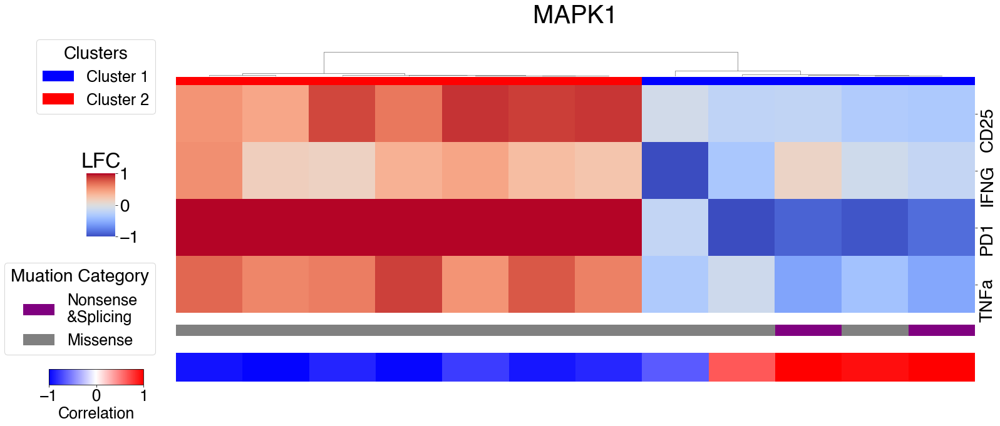

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/MAPK1_DimReduction.png


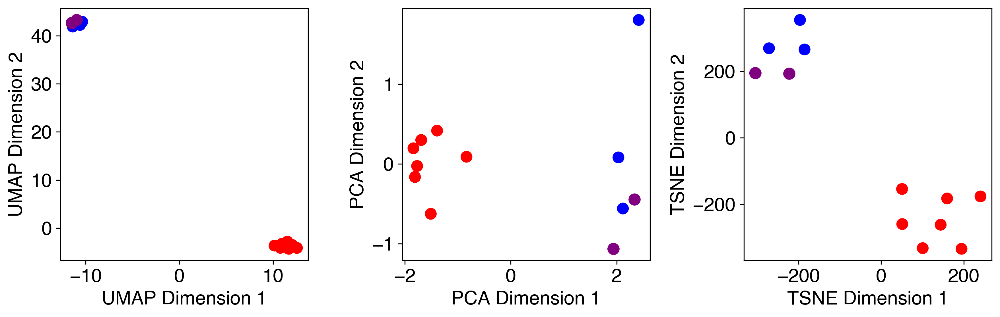

In [11]:
gene = 'MAPK1'

df_sig = df_be[df_be['Zscore']>4]

df_gene = df_sig[df_sig['Gene']==gene]

sample_ls = ['CD25','IFNG','PD1','TNFa']

df_clust = clustering(df_gene,gene,sample_ls,'',2,'ward','euclidean','Test')

In [10]:
import pandas as pd
import re

df = pd.read_csv('../Ciccia_BE_screen_MCF10A_normalized.csv')

df_neg = df[df['NegativeControl']==1]

m = df_neg['Range.max'].mean()
s = df_neg['Range.max'].std()

df['Range.zscore'] = (df['Range.max']-m)/s

from collections import Counter

mut_ls = []; aa_ls = []

for s in df['AAChg']:
    #print(s)
    if str(s)!='nan':
        ls = s.split(' ')
        counter = Counter(ls)
        most_common = counter.most_common(1)[0]
        mut = most_common[0]
        #print(ls,most_common_number)
        if 'del' in mut:
            mut = mut[2:mut.index('del')] + '_Delins'
            mut_ls.append(mut)
        else:
            mut_ls.append(mut[2:])
            
        match = re.search(r'\d+', mut)
        if match:
            number = match.group()
            aa_ls.append(int(number))
    else:
        mut_ls.append('NA')
        aa_ls.append('NA')
    
df['Mutation'] = mut_ls
df['AA'] = aa_ls
df['AA_str'] = [str(s) for s in df['AA']]
df['AA_name'] = [s[0] if str(s)!='NA' else '' for s in df['Mutation']]
df.index = df['Function']+'_'+df['AA_name']+df['AA_str']

df.index = [s if s!='nonsense_W266' else 'missense_W266' for s in df.index]
df.index = [s if s!='splice-acceptor_E731' else 'missense_E731K' for s in df.index]
df.index = [s if s!='splice-acceptor_G68' else 'missense_G68' for s in df.index]

df['sgID'] = df['Gene']+'_'+df['sgRNA_ID']

In [6]:
df_clust

,Unnamed: 0,Unnamed: 0.1,T0_R1,T0_R2,T0_R3,T18_UNT_R1,T18_UNT_R2,T18_UNT_R3,T18_CISP_R1,T18_CISP_R2,...,Range.max,p_max,Range.zscore,Mutation,AA,AA_str,AA_name,sgID,Cluster,Correlation
splice-donor_NA,15931,RIF1_Core-RIF1.326,0.203483,0.079322,0.539247,-0.850361,-1.073035,-0.364835,0.036927,-1.199938,...,1.549459,0.000400,3.597339,NA,NA,NA,,RIF1_Core-RIF1.326,0,0.358572
missense_A29T,15933,RIF1_Core-RIF1.328,-0.061451,-0.210164,0.165904,-0.397273,-0.625164,0.350581,-0.197468,-0.731319,...,1.463709,0.025003,3.265921,A29T,29,29,A,RIF1_Core-RIF1.328,1,0.891722
missense_E17K,15938,RIF1_Core-RIF1.332,-0.080735,-0.089706,-0.040822,-1.375578,-1.425600,-0.503607,-1.269461,-0.351941,...,1.335245,0.004495,2.769421,E17K,17,17,E,RIF1_Core-RIF1.332,0,0.781756
nonsense_M1?,15944,RIF1_Core-RIF1.338,0.542856,0.241735,0.556252,-0.939371,-0.954472,-0.460556,-0.990986,-1.561394,...,1.931134,0.001620,5.072475,M1?,1,1,M,RIF1_Core-RIF1.338,0,0.788920
missense_E873_V874_Delins,16060,RIF1_Core-RIF1.442,-0.105658,-0.292620,-0.174701,-0.856127,-1.168824,-0.743401,-1.488389,-1.231473,...,1.624697,0.002631,3.888127,E873_V874_Delins,873,873,E,RIF1_Core-RIF1.442,0,0.926874
splice-acceptor_V2201I,16200,RIF1_Core-RIF1.569,0.031283,-0.048458,0.240633,-0.924149,-1.104263,-0.913595,-0.986907,-1.546444,...,1.914951,0.000331,5.009926,V2201I,2201,2201,V,RIF1_Core-RIF1.569,2,0.925712


In [11]:
df_gene['AAChg']

splice-donor_NA                                               NaN
missense_A29T                    p.A29T p.D28N p.D28_A29delinsNT 
missense_E17K                               p.E17K p.L16= p.E17K 
nonsense_M1?                                               p.M1? 
missense_E873_V874_Delins    p.E873_V874delinsKI p.E873K p.V874I 
splice-acceptor_V2201I                                  p.V2201I 
Name: AAChg, dtype: object

/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:88: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Clustermap figure saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/PNKP_ClusterMap.png


<Figure size 2400x1800 with 0 Axes>

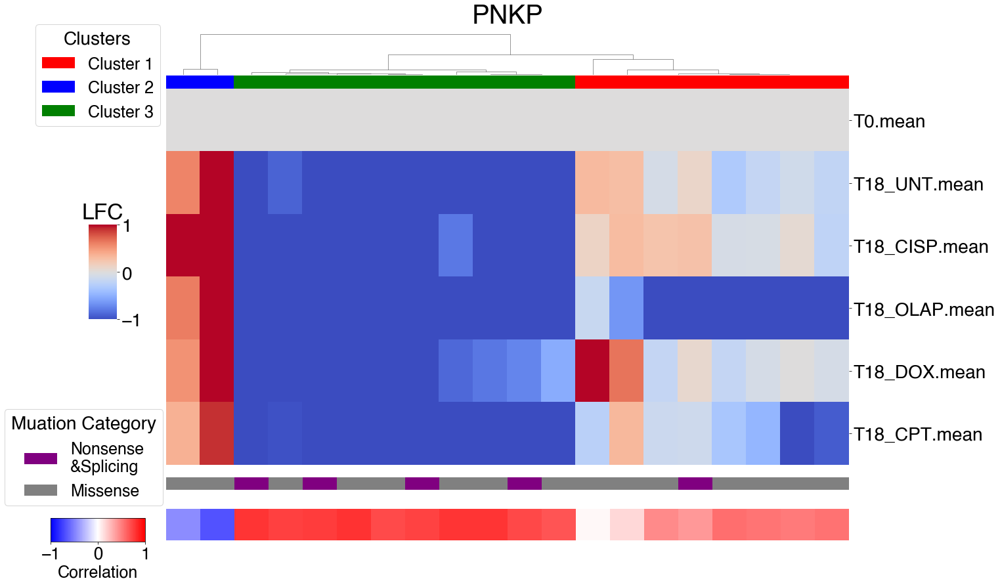

Dimensionality reduction plot saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/PNKP_DimReduction.png


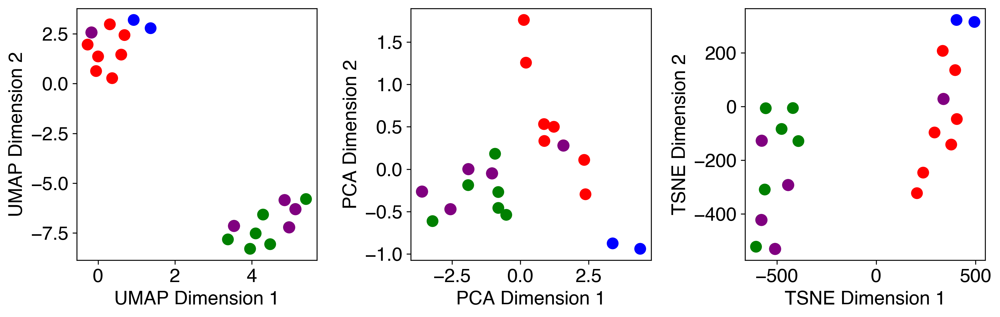

In [11]:
gene = 'PNKP'

df = df[(df['Function']=='nonsense')|(df['Function'].str.contains('splice')==True)|(df['Function']=='missense')]

df_sig = df[df['Range.zscore']>2]

df_gene = df_sig[df_sig['Gene']==gene]

sample_ls = ['T0.mean', 'T18_UNT.mean','T18_CISP.mean', 'T18_OLAP.mean','T18_DOX.mean', 'T18_CPT.mean']

df_clust = clustering(df_gene,gene,sample_ls,'T0.mean',3,'average','correlation','Test')

In [151]:
def Annotation(df_clust,gene,output_folder,pdb_path=None):
    # Create output folder if provided
    if output_folder is not None and not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    ## Annotate alphafold score
    if gene in alpha_dic:
        alpha_ls = []
        for aa in df_clust['AA']:
            score = 'NA'
            if aa != 'NA' and str(aa) in alpha_dic[gene]:
                score = round(np.mean(alpha_dic[gene][str(aa)]),3)
            alpha_ls.append(score)
        df_clust['Alphafold.score'] = alpha_ls
    else:
        df_clust['Alphafold.score'] = ['NA'] * df_clust.shape[0]
             
    ## Domain annotation
    if gene in domain_dic:
        dom_ls = []   
        for aa in df_clust['AA']:
            domain = 'NA'
            if aa != 'NA':
                for dom in domain_dic[gene]:
                    name = dom[0]; start = dom[1]; end = dom[2]
                    if start <= aa <= end:
                        domain = name
                        break
            dom_ls.append(domain)
        df_clust['Pfam.domain'] = dom_ls
        
    else:
        df_clust['Pfam.domain'] = ['NA'] * df_clust.shape[0]
        
    ## Phosphorylation annotation
    if gene in po_dic:
        po_list = [s[0] for s in po_dic[gene] if s[1]>0]
        po_ls = []
        for aa in df_clust['AA']:
            po = 0
            if aa != 'NA':
                if aa in po_list:
                    po = 1
            po_ls.append(po)
        df_clust['Phospho.site'] = po_ls
    else:
        df_clust['Phospho.site'] = ['NA'] * df_clust.shape[0]
            
    ## Clivar annotation:
    if gene in clinvar_dic:
        cli_ls = []
        for aa in df_clust['AA']:
            cli = 'NA'
            if aa != 'NA':
                for mut in clinvar_dic[gene]:
                    mut_aa = int(mut[3:-3])
                    if abs(aa - mut_aa)<=5:
                        cli = mut
                        break
            cli_ls.append(cli)
        df_clust['ClinVar'] = cli_ls
            
    else:
        df_clust['ClinVar'] = ['NA'] * df_clust.shape[0]
    
    if pdb_path is None:
        print(f"No pdb path provided for gene {gene}. Skipping structure score calculation.")
        # Fill with 'NA' if you wish to maintain columns
        df_clust['ResidueDepth'] = ['NA'] * df_clust.shape[0]
        df_clust['ASA'] = ['NA'] * df_clust.shape[0]
    
    else:
        # Attempt to parse the PDB structure
        try:
            parser = PDBParser(PERMISSIVE=1, QUIET=True)
            structure = parser.get_structure('', pdb_path)
            model = structure[0]
        except Exception as e:
            print(f"Error parsing pdb file for gene {gene}: {e}")
            model = None
        
        if model is not None:
            
            try:
                surface = get_surface(model)
            except Exception as e:
                print(f"Error calculating surface for gene {gene}: {e}")
                surface = None
            
            try:
                chain = model['A']
            except Exception as e:
                print(f"Error accessing chain A for gene {gene}: {e}")
                chain = None
            
            try:
                dssp = DSSP(model, pdb_path, dssp='mkdssp')
            except Exception as e:
                print(f"Error calculating DSSP for gene {gene}: {e}")
                dssp = None

            rd_ls = []; asa_ls = []
            # Assuming df_clust['AA'] holds residue numbers (integers)
            for aa in df_clust['AA']:
                try:
                    if chain is not None and surface is not None and dssp is not None:
                        # Get the residue from chain using the residue number directly
                        residue = chain[aa]
                        rd = residue_depth(residue, surface)
                        # Construct the DSSP key; adjust based on your DSSP output format
                        key = ('A', (' ', aa, ' '))
                        asa = dssp[key][3]
                        rd_ls.append(rd)
                        asa_ls.append(asa)
                    else:
                        rd_ls.append('NA')
                        asa_ls.append('NA')
                except Exception as e:
                    rd_ls.append('NA')
                    asa_ls.append('NA')
            
            df_clust['ResidueDepth'] = rd_ls
            df_clust['ASA'] = asa_ls
        
        else:
            df_clust['ResidueDepth'] = ['NA'] * df_clust.shape[0]
            df_clust['ASA'] = ['NA'] * df_clust.shape[0]
    
    # Save the annotated table if an output folder is provided
    if output_folder is not None:
        table_path = os.path.join(os.getcwd(),output_folder, f"{gene}_Cluster_Annotation_Table.csv")
        df_clust.to_csv(table_path, index=False)
        print(f"Annotation table saved to: {table_path}")
    
    return df_clust

In [5]:
import json

exons_dic = json.loads(open('../ProteinAnnotationDataset/Exons_dic_hg38.json').read())
domain_dic = json.loads(open('../ProteinAnnotationDataset/Pfam_domain_proteome.json').read())
alpha_dic = json.loads(open('../ProteinAnnotationDataset/alphafold_dic_proteome').read())
po_dic = json.loads(open('../ProteinAnnotationDataset/phosphosite_dic.json').read())
clinvar_dic = json.loads(open('../ProteinAnnotationDataset/Clinvar_genome.json').read())

In [6]:
import mygene
import pymol

def get_uniprot_id_from_gene_symbol(gene_symbol):
    mg = mygene.MyGeneInfo()
    result = mg.query(gene_symbol, fields='uniprot.Swiss-Prot',species='9606')
    print(result)
    if 'hits' in result and len(result['hits']) > 0:
        for dic in result['hits']:
            if 'uniprot' in dic:
                uniprot_id = dic['uniprot']['Swiss-Prot']
                break
        if uniprot_id:
            return uniprot_id
    return None

uni_id = get_uniprot_id_from_gene_symbol(gene)
pdb_path = '/home/data/Alphafold_human/AF-'+uni_id+'-F1-model_v1.pdb'

NameError: name 'gene' is not defined

In [156]:
gene = 'EGFR'

Annotation(df_clust,gene,'Test',pdb_path)

/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

Annotation table saved to: /home/whe/Work_progress/BE_screen_pipeline/ProTiler-Mut/Test/EGFR_Cluster_Annotation_Table.csv


/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/whe/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:123: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,AA,score_ph55,score_surface,zscore_ph55,zscore_surface,Function,Mutation,Cluster,Correlation,Alphafold.score,Pfam.domain,Phospho.site,ClinVar,ResidueDepth,ASA
"Missense_1 3\n3 5\n6 8\n10 12\n11 13\n ... \n356 358\n357 359\n358 360\n361 363\n362 364\nName: AA, Length: 264, dtype: int64",3,-0.135906,-0.724109,-1.601231,-5.543938,Missense,1 3\n3 5\n6 8\n10 12...,0,0,49.63,NA,0,NA,1.833778,0.948529
"Missense_1 3\n3 5\n6 8\n10 12\n11 13\n ... \n356 358\n357 359\n358 360\n361 363\n362 364\nName: AA, Length: 264, dtype: int64",5,0.048878,-0.825302,-0.265919,-6.219605,Missense,1 3\n3 5\n6 8\n10 12...,0,0,41.40,NA,0,NA,1.709501,0.833333
"Missense_1 3\n3 5\n6 8\n10 12\n11 13\n ... \n356 358\n357 359\n358 360\n361 363\n362 364\nName: AA, Length: 264, dtype: int64",8,-0.049319,-0.755961,-0.950823,-5.610852,Missense,1 3\n3 5\n6 8\n10 12...,0,0,48.59,NA,0,NA,1.709642,0.535714
"Missense_1 3\n3 5\n6 8\n10 12\n11 13\n ... \n356 358\n357 359\n358 360\n361 363\n362 364\nName: AA, Length: 264, dtype: int64",12,0.417141,0.598637,2.395273,3.288059,Missense,1 3\n3 5\n6 8\n10 12...,2,0,55.07,NA,0,NA,1.858753,0.780488
"Missense_1 3\n3 5\n6 8\n10 12\n11 13\n ... \n356 358\n357 359\n358 360\n361 363\n362 364\nName: AA, Length: 264, dtype: int64",13,-1.057918,-1.409645,-8.263992,-10.121273,Missense,1 3\n3 5\n6 8\n10 12...,3,0,56.43,NA,0,NA,1.767666,0.584906
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Missense_1 3\n3 5\n6 8\n10 12\n11 13\n ... \n356 358\n357 359\n358 360\n361 363\n362 364\nName: AA, Length: 264, dtype: int64",358,0.634602,0.606665,3.966716,3.341663,Missense,1 3\n3 5\n6 8\n10 12...,2,0,94.11,NA,0,NA,1.848902,0.527174
"Missense_1 3\n3 5\n6 8\n10 12\n11 13\n ... \n356 358\n357 359\n358 360\n361 363\n362 364\nName: AA, Length: 264, dtype: int64",359,0.505350,0.574745,3.032702,3.128534,Missense,1 3\n3 5\n6 8\n10 12...,2,0,95.41,NA,0,NA,3.090983,0.000000
"Missense_1 3\n3 5\n6 8\n10 12\n11 13\n ... \n356 358\n357 359\n358 360\n361 363\n362 364\nName: AA, Length: 264, dtype: int64",360,0.588258,0.388430,3.631821,1.884508,Missense,1 3\n3 5\n6 8\n10 12...,2,0,92.40,NA,0,NA,2.060351,0.575610
"Missense_1 3\n3 5\n6 8\n10 12\n11 13\n ... \n356 358\n357 359\n358 360\n361 363\n362 364\nName: AA, Length: 264, dtype: int64",363,0.399657,0.633020,2.211473,3.428566,Missense,1 3\n3 5\n6 8\n10 12...,2,0,94.01,Recep_L_domain,0,NA,2.212335,0.084507


In [7]:
def kde_sklearn(x: np.ndarray, x_grid: np.ndarray, bandwidth: float) -> np.ndarray:
    """
    Compute Kernel Density Estimation using Scikit-learn.

    Parameters:
        x (np.ndarray): Input data points of shape (n_samples, 1).
        x_grid (np.ndarray): Points to evaluate the density on.
        bandwidth (float): Bandwidth for the kernel.

    Returns:
        np.ndarray: Density estimates evaluated on x_grid.
    """
    kde_model = KernelDensity(kernel="gaussian", bandwidth=bandwidth)
    kde_model.fit(x)
    log_pdf = np.exp(kde_model.score_samples(x_grid))
    return log_pdf


def get_sift_kde(con_list: list, aa_list: list, bw: float) -> np.ndarray:
    """
    Generate a kernel density estimate (KDE) for SIFT scores.

    Parameters:
        con_list (list): List of conservation scores.
        aa_list (list): List of amino acid positions.
        bw (float): Bandwidth for KDE.

    Returns:
        np.ndarray: KDE values evaluated on the amino acid grid.
    """
    binned = list(pd.cut(con_list, 100, labels=False))
    x_grid = np.array(aa_list).reshape(-1, 1)
    weight_list = []
    for i, count in enumerate(binned):
        weight_list += [(i + 1)] * int(count)
    x = np.array(weight_list).reshape(-1, 1)
    kde_values = kde_sklearn(x, x_grid, bw)
    return kde_values


def plot_exons(res_max: float, pos: float, exon_list: list) -> None:
    """
    Plot exon regions as bars.

    Parameters:
        res_max (float): Maximum residue value.
        pos (float): Vertical position for plotting.
        exon_list (list): List of exon boundaries.
    """
    plt.text(-(res_max / 7), pos + 0.2, "Exons list")
    for i in range(len(exon_list) - 1):
        exon_width = exon_list[i + 1] - exon_list[i]
        color = "silver" if (i + 1) % 2 == 0 else "black"
        plt.bar(
            exon_list[i] + exon_width / 2,
            0.6,
            width=exon_width,
            bottom=pos,
            facecolor=color,
            alpha=0.2,
        )


def plot_domain(res_max: float, pos: float, domains: list) -> None:
    """
    Plot Pfam domain annotations.

    Parameters:
        res_max (float): Maximum residue value.
        pos (float): Vertical position for plotting.
        domains (list): List of domains, each represented as (name, start, end).
    """
    plt.bar(res_max / 2, 0.6, width=res_max, bottom=pos, color="silver", alpha=0.2)
    plt.text(-(res_max / 7), pos + 0.2, "Pfam domain")
    for domain in domains:
        dom_name, dom_start, dom_end = domain
        loc = int((dom_start + dom_end) / 2)
        length = dom_end - dom_start
        plt.bar(loc, 0.6, width=length, bottom=pos, facecolor="lightcoral", alpha=0.8)
        label_y = pos + 0.2 if len(dom_name) <= 15 else pos + 0.1
        label_text = dom_name if len(dom_name) <= 15 else dom_name[:15]
        plt.text(loc, label_y, label_text, fontsize=8, horizontalalignment="center")


def plot_contlist(
    res_max: float, cont_list: list, pos: float, label: str, palette: str, reverse: bool
) -> None:
    """
    Plot a continuous data list as a bar plot.

    Parameters:
        res_max (float): Maximum residue value.
        cont_list (list): List of continuous values.
        pos (float): Vertical position for plotting.
        label (str): Label text to display.
        palette (str): Seaborn color palette to use.
        reverse (bool): If True, sort in descending order.
    """
    plt.text(-(res_max / 7), pos + 0.2, label)
    pair_list = [(i + 1, cont_list[i]) for i in range(len(cont_list))]
    pair_list.sort(key=lambda x: x[1], reverse=reverse)
    color_list = sns.color_palette(palette, len(cont_list))
    min_val = min(cont_list)
    zero_list = [pair for pair in pair_list if pair[1] == min_val]
    non_zero = [pair for pair in pair_list if pair[1] != min_val]
    plt.bar(
        [pair[0] for pair in zero_list],
        height=[0.6] * len(zero_list),
        width=1,
        bottom=pos,
        color=color_list[0],
    )
    plt.bar(
        [pair[0] for pair in non_zero],
        height=[0.6] * len(non_zero),
        width=1,
        bottom=pos,
        color=color_list[len(zero_list):],
    )


def plot_bilist(res_max: float, loc_list: list, pos: float, label: str, color: str) -> None:
    """
    Plot a binary list as a bar plot.

    Parameters:
        res_max (float): Maximum residue value.
        loc_list (list): List of locations to mark.
        pos (float): Vertical position for plotting.
        label (str): Label text to display.
        color (str): Color for the bars.
    """
    plt.text(-(res_max / 7), pos + 0.2, label)
    plt.bar(res_max / 2, 0.6, width=res_max, bottom=pos, color="silver", alpha=0.2)
    plt.bar(loc_list, [0.6] * len(loc_list), width=res_max / 1000, bottom=pos, color=color)


def visualization_1d(
     df_all:pd.DataFrame, df_clust: pd.DataFrame, gene: str, output_folder: str
) -> None:
    """
    Generate a one-dimensional visualization of tiling mutagenesis screen data for missense mutations.

    Parameters:
        df_all (pd.DataFrame): DataFrame containing all sgRNA data.
        df_clust (pd.DataFrame): DataFrame with sgRNA clustering results.
        gene (str): Gene name.
        output_folder (str): Directory path to save the resulting figure.
        
    Note:
        This function expects global dictionaries 'exons_dic', 'alpha_dic', 'po_dic',
        'clinvar_dic', and 'domain_dic' to be defined.
    """
    # Retrieve exon information
    res_max = exons_dic[gene][0]["AA.num"]
    exon_list = exons_dic[gene][0]["AA.list"]

    # Compute Alphafold score list if available
    if gene in alpha_dic:
        score_list = [np.mean(alpha_dic[gene][str(n)]) for n in range(1, len(alpha_dic[gene]) + 1)]
    else:
        score_list = [0] * res_max

    kde_score_list = get_sift_kde(score_list, list(range(1, res_max)), 10)

    # Retrieve phosphosite and ClinVar data if available
    if gene in po_dic:
        po_list = [s[0] for s in po_dic[gene] if s[1] > 0]
    else:
        po_list = [0] * res_max

    if gene in clinvar_dic:
        clinvar_list = [int(s[3:-3]) for s in clinvar_dic[gene] if s[-3:] != "Ter"]
    else:
        clinvar_list = [0] * res_max

    # Retrieve domain data if available
    dom_list = domain_dic.get(gene, [])

    plt.figure(figsize=(8, 5), dpi=300)
    plt.rcParams["font.size"] = 10
    plt.rcParams["font.family"] = "Helvetica"
    ax = plt.gca()
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.spines["left"].set_visible(False)

    # Plot various tracks
    plot_contlist(res_max, kde_score_list, 6, "Alphafold", "Blues", reverse=False)
    plot_exons(res_max, 5, exon_list)
    plot_domain(res_max, 4, dom_list)
    plot_bilist(res_max, po_list, 3, "Phosphosite", "black")
    plot_bilist(res_max, clinvar_list, 2, "Pathogenicity", "red")

    # Plot all missense sgRNA locations
    df_gene_missense = df_all[(df_all["Gene"] == gene) & (df_all["Function"] == "missense")]
    aa_list_all = [aa for aa in list(df_gene_missense["AA"]) if aa != "NA"]
    plot_bilist(res_max, aa_list_all, 1, "sgRNAs all", "gray")

    # Plot significant sgRNAs per cluster for missense mutations
    df_clust_missense = df_clust[df_clust["Function"] == "missense"]
    color_list = ["blue", "red", "green", "orange", "purple", "yellow", "cyan", "pink", "teal", "brown"]
    
    for cluster in sorted(set(df_clust_missense["Cluster"])):
        df_cluster = df_clust_missense[df_clust_missense["Cluster"] == cluster]
        aa_list_res = []
        for aa in df_cluster["AA"]:
            if str(aa) != "NA":
                offset = random.randint(1, int(res_max / 100)) if aa not in aa_list_res else random.randint(2, int(res_max / 100))
                aa_list_res.append(aa + offset)
        
        plot_bilist(res_max, aa_list_res, -cluster, f"Cluster_{cluster+1}", color_list[cluster])

    plt.title(f"Tiling mutagenesis screen data of Missense sgRNAs targeting {gene}")
    plt.yticks([])
    plt.xticks([i - i % 10 for i in range(0, int(res_max), int(res_max / 100) * 10)])
    plt.xlabel("AA_Location")
    plt.xlim(0, res_max + 5)

    fig_save_path = os.path.join(os.getcwd(), output_folder, f"{gene}_ClusterDistribution_1D.png")
    plt.savefig(fig_save_path, dpi=300, facecolor="white", bbox_inches="tight")
    plt.show()

In [159]:
df

,hgvs,SE_ph55,epsilon_ph55,score_ph55,SE_ph65,epsilon_ph65,score_ph65,SE_surface,epsilon_surface,score_surface,pos,len,mutation_type,variants,is.wt,AAChange,AA
122,p.(A122A),0.118656,6.980000e-21,-0.153384,0.454754,1.110000e-16,0.338089,0.080570,1.020000e-75,-0.335912,122,1,S,A,True,A122A,122
122,p.(A122C),0.381317,5.400000e-19,-1.801114,0.919180,2.220000e-16,-0.190261,1.127075,4.470000e-45,0.503273,122,1,M,C,False,A122C,122
122,p.(A122D),0.220801,3.720000e-50,-1.445751,0.482411,1.110000e-16,-0.053051,0.256248,6.470000e-70,-2.255615,122,1,M,D,False,A122D,122
122,p.(A122E),0.450482,3.460000e-59,-2.122347,0.072890,9.620000e-41,0.303307,0.607109,3.190000e-63,-1.098069,122,1,M,E,False,A122E,122
122,p.(A122F),0.239804,8.700000e-60,-1.953510,2.802126,0.000000e+00,1.240737,0.220101,9.650000e-25,-0.638656,122,1,M,F,False,A122F,122
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,p.(Y80_V81del),0.455226,8.110000e-09,-0.530086,1.008242,0.000000e+00,0.971333,0.411174,2.050000e-07,0.977311,80,2,D,D_2,False,Y80_V81del,80
80,p.(Y80_V81insG),0.701363,6.800000e-30,-1.404568,0.355739,1.930000e-56,-0.622321,0.346511,7.810000e-45,-1.159986,80,1,I,I_1,False,Y80_V81insG,80
80,p.(Y80_V81insGS),0.227937,1.370000e-54,-1.729858,0.181542,5.710000e-18,-0.590542,0.520644,0.000000e+00,-1.126745,80,2,I,I_2,False,Y80_V81insGS,80
80,p.(Y80_V81insGSG),0.449102,1.410000e-10,-1.906479,0.393649,3.291436e-03,-0.646405,0.438738,0.000000e+00,-2.110456,80,3,I,I_3,False,Y80_V81insGSG,80


In [252]:
df['Gene'] = ['GPR68'] * df.shape[0]
df['Function'] = ['missense'] * df.shape[0]

In [177]:
df_clust

,AA,score_ph55,score_surface,zscore_ph55,zscore_surface,Function,Mutation,Cluster,Correlation
1,3,-0.135906,-0.724109,-1.601231,-5.543938,Missense,3,0,0
3,5,0.048878,-0.825302,-0.265919,-6.219605,Missense,5,0,0
6,8,-0.049319,-0.755961,-0.950823,-5.610852,Missense,8,0,0
10,12,0.417141,0.598637,2.395273,3.288059,Missense,12,2,0
11,13,-1.057918,-1.409645,-8.263992,-10.121273,Missense,13,3,0
...,...,...,...,...,...,...,...,...,...
356,358,0.634602,0.606665,3.966716,3.341663,Missense,358,2,0
357,359,0.505350,0.574745,3.032702,3.128534,Missense,359,2,0
358,360,0.588258,0.388430,3.631821,1.884508,Missense,360,2,0
361,363,0.399657,0.633020,2.211473,3.428566,Missense,363,2,0


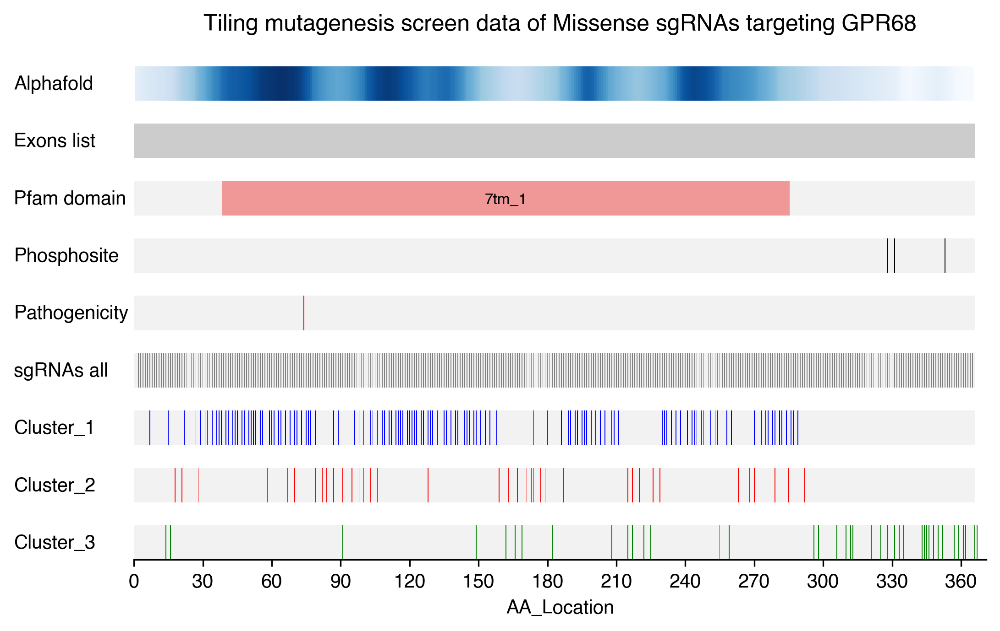

In [253]:
gene = 'GPR68'

visualization_1d(df,df_clust,gene,'Test')

In [254]:
def Visualization_3D(gene, clust_ls, output_folder, pdb_path=None):
    
    if output_folder is not None and not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    if pdb_path is None:
        print(f"No pdb path provided for gene {gene}. Skip.")
        # Fill with 'NA' if you wish to maintain columns
        return None
    
    pymol.cmd.load(pdb_path)
    #pymol.cmd.hide('surface')
    pymol.cmd.hide('everything')
    pymol.cmd.color('gray')
    pymol.cmd.bg_color('white')
    
    pymol.cmd.show('cartoon')
    pymol.cmd.set('cartoon_transparency',0.7)
    #pymol.cmd.spectrum('b','blue_white_red',minimum=50,maximum=100)
    
    color_list = [ "blue","red", "green", "orange", "purple", 
                  "yellow", "cyan", "pink", "teal", "brown"]
    
    one_letter ={'VAL':'V', 'ILE':'I', 'LEU':'L', 'GLU':'E', 'GLN':'Q', \
                 'ASP':'D', 'ASN':'N', 'HIS':'H', 'TRP':'W', 'PHE':'F', 'TYR':'Y', \
                 'ARG':'R', 'LYS':'K', 'SER':'S', 'THR':'T', 'MET':'M', 'ALA':'A', \
                 'GLY':'G', 'PRO':'P', 'CYS':'C'}
    
    n = 0
    for ix_ls in cluster_ls:
        sel = '+'.join([str(num) for num in ix_ls])
        print(sel)
        
        color = color_list[n]

        pymol.cmd.select('Cluster'+str(n+1), "resi "+sel)
        pymol.cmd.show('sticks', 'Cluster'+str(n+1))
        pymol.cmd.color(color, 'Cluster'+str(n+1))
        

        pymol.cmd.label('n. CA and i. '+sel, 'resi')
        pymol.cmd.set('label_size',10)
        pymol.cmd.set('stick_radius',0.5)
        
        n += 1
    
    pymol.cmd.set('stick_transparency',0)  
    
    print('Save pymol session and images ...')
    
    #figsavepath = os.path.join(os.getcwd(),outputfolder,gene+'_BE_Cluster_3D.png')
    pymolsavepath = os.path.join(os.getcwd(),output_folder,gene+'_ClustersDistribution_3D.pse')
    pymol.cmd.save(pymolsavepath)
    pymol.cmd.reinitialize()
    #pymol.cmd.png(figsavepath,width=1200, height=1200, dpi=300, ray=0)
    print('Finished!') 

In [255]:
import mygene
import pymol

def get_uniprot_id_from_gene_symbol(gene_symbol):
    mg = mygene.MyGeneInfo()
    result = mg.query(gene_symbol, fields='uniprot.Swiss-Prot',species='9606')
    print(result)
    if 'hits' in result and len(result['hits']) > 0:
        for dic in result['hits']:
            if 'uniprot' in dic:
                uniprot_id = dic['uniprot']['Swiss-Prot']
                break
        if uniprot_id:
            return uniprot_id
    return None

uni_id = get_uniprot_id_from_gene_symbol(gene)
pdb = '/home/data/Alphafold_human/AF-'+uni_id+'-F1-model_v1.pdb'

cluster_ls = []
df_clust = df_clust[df_clust['Function']=='missense']
for c in sorted(set(df_clust['Cluster'])):
    df_c = df_clust[df_clust['Cluster']==c]
    aa_ls = [aa for aa in df_c['AA'] if aa!='NA']
    cluster_ls.append(aa_ls)
        
print(cluster_ls)

Visualization_3D(gene,cluster_ls,'Test',pdb)

{'took': 26, 'total': 4, 'max_score': 141.65678, 'hits': [{'_id': '8111', '_score': 141.65678, 'uniprot': {'Swiss-Prot': 'Q15743'}}, {'_id': '116268461', '_score': 7.4649153}, {'_id': '116268460', '_score': 6.9860625}, {'_id': '112272569', '_score': 5.8586254}]}
[[5, 13, 19, 23, 24, 26, 27, 28, 29, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 60, 61, 62, 63, 65, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 85, 87, 94, 96, 99, 100, 101, 104, 105, 106, 107, 108, 109, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 128, 129, 132, 133, 134, 135, 136, 137, 138, 139, 141, 142, 143, 144, 145, 146, 147, 149, 150, 151, 154, 156, 172, 173, 177, 178, 183, 187, 188, 189, 190, 193, 194, 195, 196, 197, 200, 201, 202, 204, 205, 207, 208, 228, 229, 230, 231, 233, 234, 235, 236, 238, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 255, 258, 268, 270, 271, 272, 273, 274, 275, 276, 277, 279, 280, 28